In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle

In [3]:
i=53
d=1

error_ep_f_path = f'output/results_run{i}_d{d}/error_ep_f_V1.txt'
error_ep_w_path = f'output/results_run{i}_d{d}/error_ep_w_V1.txt'
w_hist_path = f'output/results_run{i}_d{d}/W_hist_V1.txt'

with open(error_ep_f_path, 'rb') as file:
    error_ep_f = pickle.load(file)
with open(error_ep_w_path, 'rb') as file:
    error_ep_w = pickle.load(file)
with open(w_hist_path, 'rb') as file:
    w_hist = pickle.load(file)

In [4]:
df_error_ep_w = pd.DataFrame(error_ep_w)
df_error_ep_f = pd.DataFrame(error_ep_f)
df_w_hist = pd.DataFrame(w_hist)


In [5]:
df_w_hist.head()

,W_key,W,error,f_epoch_min
0,1,"[[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.038000003, 0.087000005]",114
1,2,"[[0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.016, 0.094000004]",114
2,3,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.032, 0.105000004]",259
3,4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,...","[0.040000003, 0.09200001]",59
4,5,"[[0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,...","[0.044000003, 0.095000006]",73


In [6]:
df_error_ep_f.head()

,W_key,epoch_w,epoch_f,error,time,window_size_0,window_size_1,window_size_2,window_size_3,window_size_4,window_size_5,window_size_6
0,1,0,0,0.47000003,14.838195,5,5,5,5,5,5,5
1,1,0,1,0.448,15.238325,5,5,5,5,5,5,5
2,1,0,2,0.48200002,15.381580,5,5,5,5,5,5,5
3,1,0,3,0.43600002,15.517162,5,5,5,5,5,5,5
4,1,0,4,0.33400002,15.674895,5,5,5,5,5,5,5


In [7]:
df_error_ep_w.head()

,epoch,error_train,error_val
0,0,0.038000003,0.087000005
1,1,0.012,0.055000003
2,2,0.010000001,0.041
3,3,0.012,0.045
4,4,0.008,0.048


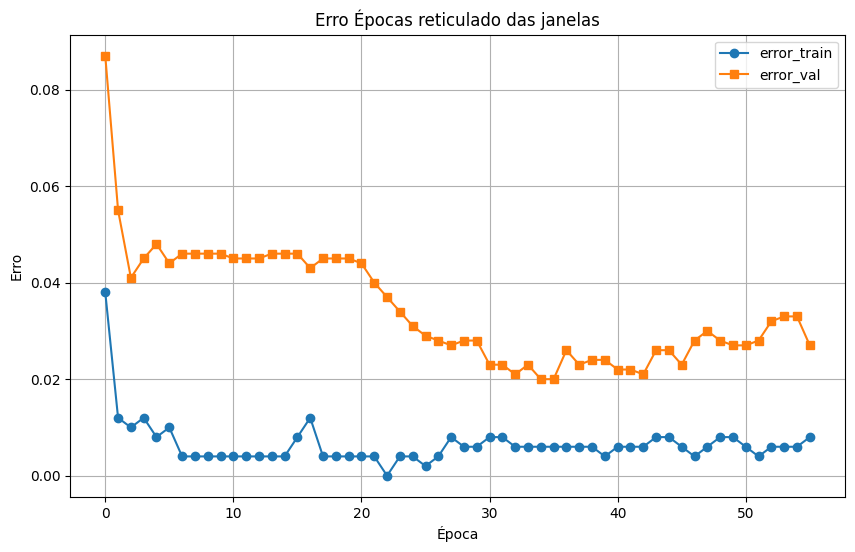

In [8]:
coluna_x = 'epoch'
coluna_y1 = 'error_train'
coluna_y2 = 'error_val'

plt.figure(figsize=(10, 6)) 
plt.plot(df_error_ep_w[coluna_x], df_error_ep_w[coluna_y1], label='error_train', marker='o')
plt.plot(df_error_ep_w[coluna_x], df_error_ep_w[coluna_y2], label='error_val', marker='s')

plt.xlabel('Época')
plt.ylabel('Erro')
plt.title('Erro Épocas reticulado das janelas')

plt.legend()

plt.grid(True)  # Adicione grades se desejar
plt.show()

In [14]:
df_error_ep_f.W_key.unique()

array([   1,    2,    3, ..., 4737, 4738, 4739])

In [12]:
df_error_ep_f.head()

,W_key,epoch_w,epoch_f,error,time,window_size_0,window_size_1,window_size_2,window_size_3,window_size_4,window_size_5,window_size_6
0,1,0,0,0.47000003,14.838195,5,5,5,5,5,5,5
1,1,0,1,0.448,15.238325,5,5,5,5,5,5,5
2,1,0,2,0.48200002,15.381580,5,5,5,5,5,5,5
3,1,0,3,0.43600002,15.517162,5,5,5,5,5,5,5
4,1,0,4,0.33400002,15.674895,5,5,5,5,5,5,5


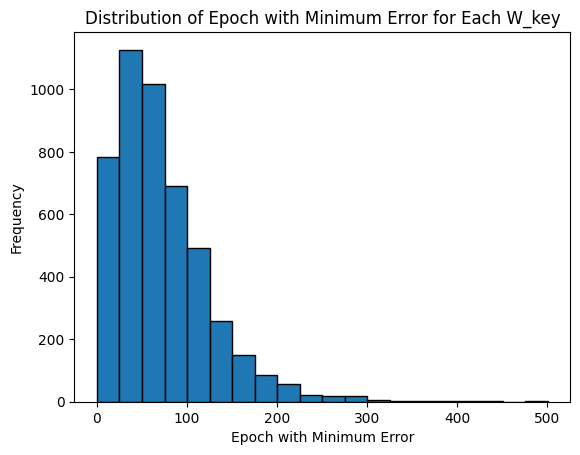

In [15]:
min_epoch_df = df_error_ep_f.loc[df_error_ep_f.groupby('W_key')['error'].idxmin()]

# Armazene os valores de epoch_f na variável min_epoch
min_epoch = min_epoch_df['epoch_f']
plt.hist(min_epoch, bins=20, edgecolor='black')
plt.xlabel('Epoch with Minimum Error')
plt.ylabel('Frequency')
plt.title('Distribution of Epoch with Minimum Error for Each W_key')
plt.show()

In [16]:
df_w_hist.head()

,W_key,W,error,f_epoch_min
0,1,"[[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.038000003, 0.087000005]",114
1,2,"[[0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.016, 0.094000004]",114
2,3,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...","[0.032, 0.105000004]",259
3,4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,...","[0.040000003, 0.09200001]",59
4,5,"[[0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,...","[0.044000003, 0.095000006]",73


In [7]:
df_w_hist[['error_train', 'error_val']] = df_w_hist['error'].apply(pd.Series)
df_w_hist.drop(columns=['error'], inplace=True)
df_w_hist.head()

,W_key,W,f_epoch_min,error_train,error_val
0,1,"[[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...",114,0.038,0.087
1,2,"[[0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0,...",114,0.016,0.094
2,3,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...",259,0.032,0.105
3,4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,...",59,0.040,0.092
4,5,"[[0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,...",73,0.044,0.095


In [9]:
df_w_hist.error_val.min()

np.float32(0.020000001)

In [10]:
df_w_hist[df_w_hist.error_val==df_w_hist.error_val.min()]

,W_key,W,f_epoch_min,error_train,error_val
2938,2939,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...",2,0.006,0.02
3038,3039,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...",3,0.006,0.02
3041,3042,"[[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0,...",3,0.006,0.02


In [19]:
df_w_hist[df_w_hist.W_key==2939]['W'].values[0]

Array([[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        0, 0, 0]], dtype=int8)

In [26]:
import jax.numpy as jnp

In [27]:
W_save = jnp.array(df_w_hist[df_w_hist.W_key==2939]['W'].values[0])
W_save.shape

(7, 25)

In [28]:
filename_W =f'W_V1.txt'
pickle.dump(W_save, open(filename_W, 'wb'))

In [29]:
path_window = f'./output/results_run53_d1/run/W_V1_ep34.txt'

In [30]:
W = jnp.load(path_window, allow_pickle=True)#.astype(jnp.int8)

In [31]:
W

Array([[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        0, 0, 0]], dtype=int8)

In [ ]:
Array([[0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        0, 0, 0]], dtype=int8)

In [20]:
W_learned = df_w_hist[df_w_hist.W_key==2939]['W'].values[0]

In [21]:
W_learned.shape

(7, 25)

In [ ]:
version = '1'
WOMC_WINDOW = USDMM_data.load_window(
    path_window = f'/{work_directory}/output/{path_result}/trained/W_V{version}.txt',
    path_joint = f'/{work_directory}/output/{path_result}/trained/joint_V{version}.txt',
    path_joint_shape = f'/{work_directory}/output/{path_result}/trained/joint_shape_V{version}.txt'
)

In [12]:
df_w_hist.W_key.max()

np.int64(4739)

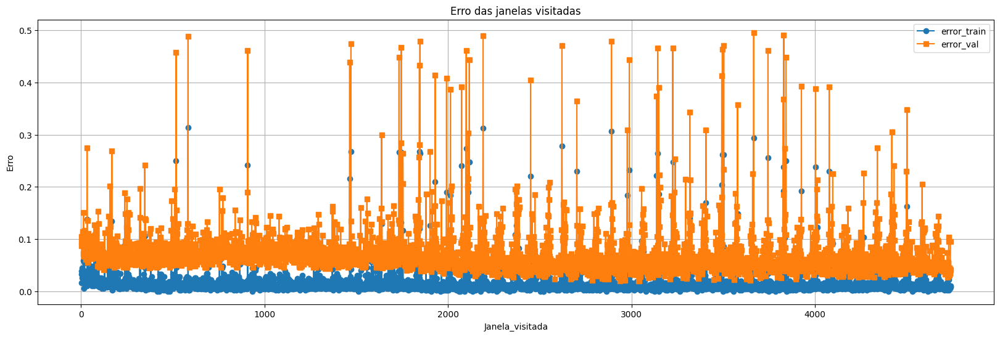

In [18]:
coluna_x = 'W_key'
coluna_y1 = 'error_train'
coluna_y2 = 'error_val'

# Criar o gráfico de linhas
plt.figure(figsize=(20, 6))  # Ajuste o tamanho da figura conforme necessário
plt.plot(df_w_hist[coluna_x], df_w_hist[coluna_y1], label='error_train', marker='o')
plt.plot(df_w_hist[coluna_x], df_w_hist[coluna_y2], label='error_val', marker='s')

# Adicionar rótulos e título
plt.xlabel('Janela_visitada')
plt.ylabel('Erro')
plt.title('Erro das janelas visitadas')

# Adicionar legenda
plt.legend()

# Mostrar o gráfico
plt.grid(True)  # Adicione grades se desejar
plt.show()

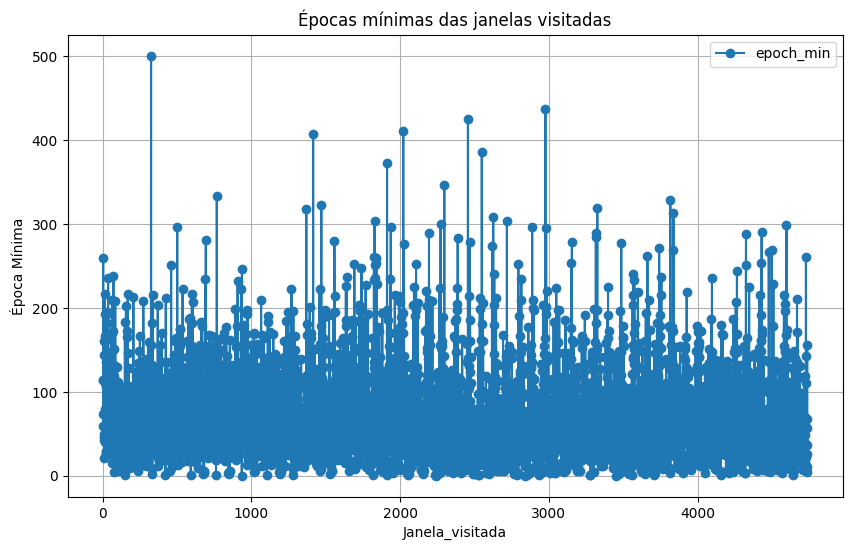

In [19]:
coluna_x = 'W_key'
coluna_y = 'f_epoch_min'


# Criar o gráfico de linhas
plt.figure(figsize=(10, 6))  # Ajuste o tamanho da figura conforme necessário
plt.plot(df_w_hist[coluna_x], df_w_hist[coluna_y], label='epoch_min', marker='o')


# Adicionar rótulos e título
plt.xlabel('Janela_visitada')
plt.ylabel('Época Mínima')
plt.title('Épocas mínimas das janelas visitadas')

# Adicionar legenda
plt.legend()

# Mostrar o gráfico
plt.grid(True)  # Adicione grades se desejar
plt.show()

In [ ]:
coluna_x = 'W_key'
coluna_y = 'f_epoch_min'


# Criar o gráfico de linhas
plt.figure(figsize=(10, 6))  # Ajuste o tamanho da figura conforme necessário
plt.plot(df[coluna_x], df[coluna_y], label='epoch_min', marker='o')


# Adicionar rótulos e título
plt.xlabel('Janela_visitada')
plt.ylabel('Época Mínima')
plt.title('Épocas mínimas das janelas visitadas')

# Adicionar legenda
plt.legend()

# Mostrar o gráfico
plt.grid(True)  # Adicione grades se desejar
plt.show()

Janela 1


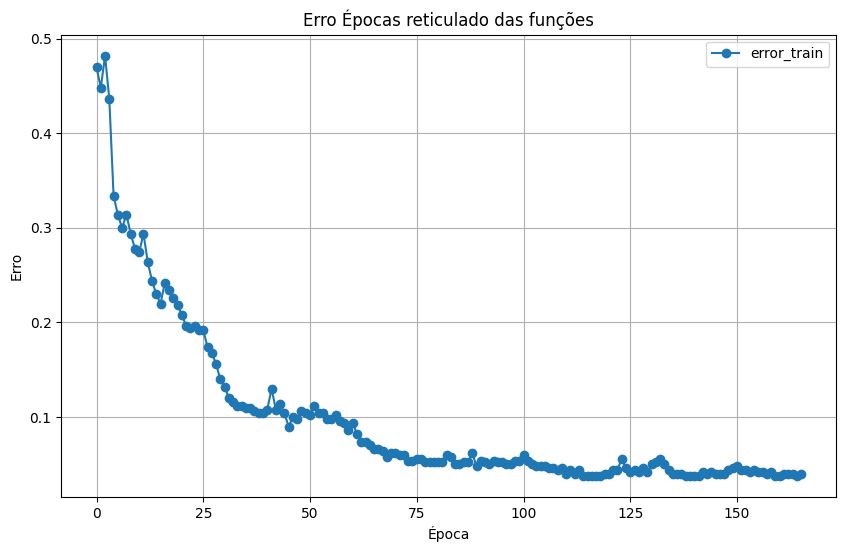

----
Janela 2


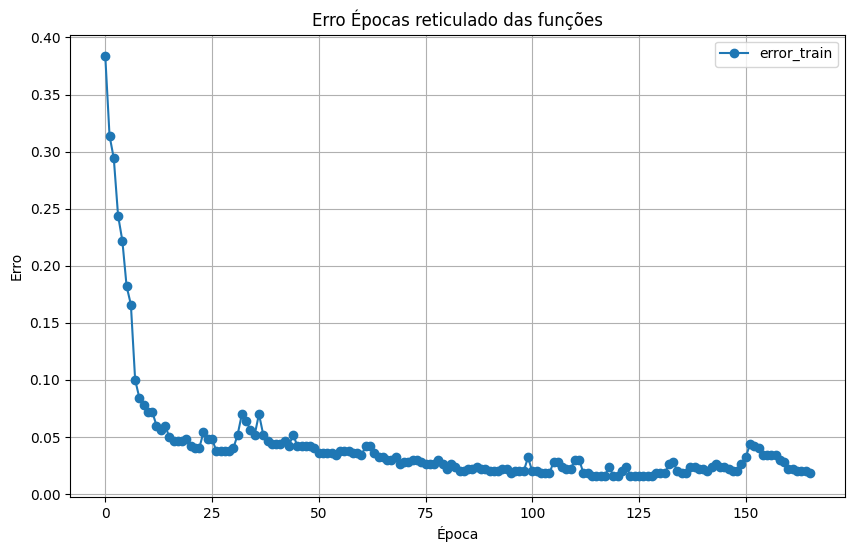

----
Janela 3


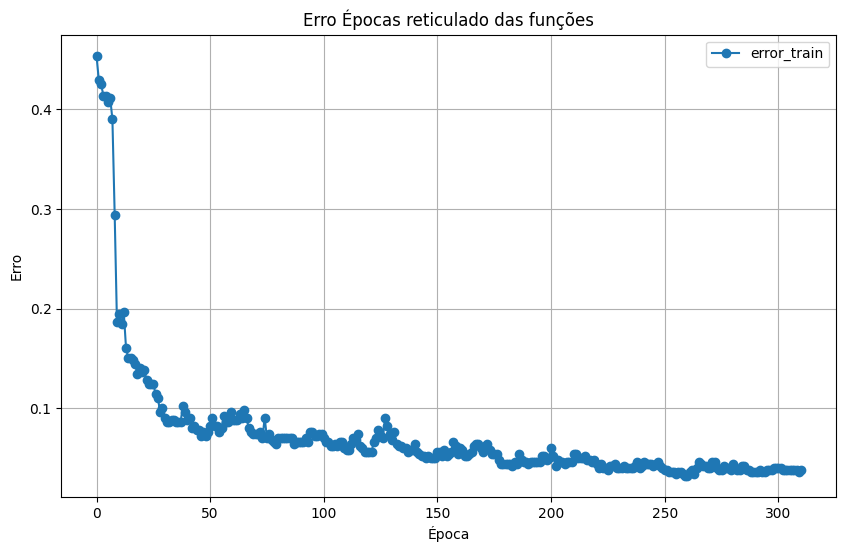

----
Janela 4


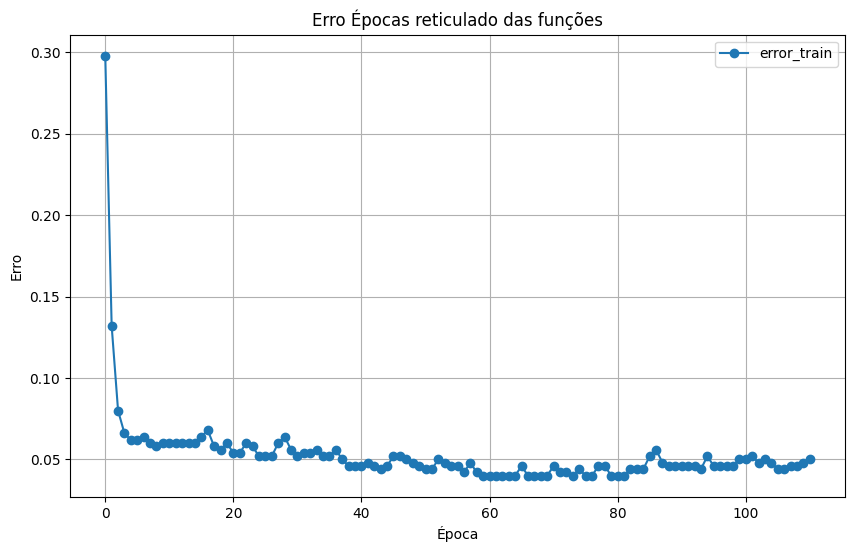

----
Janela 5


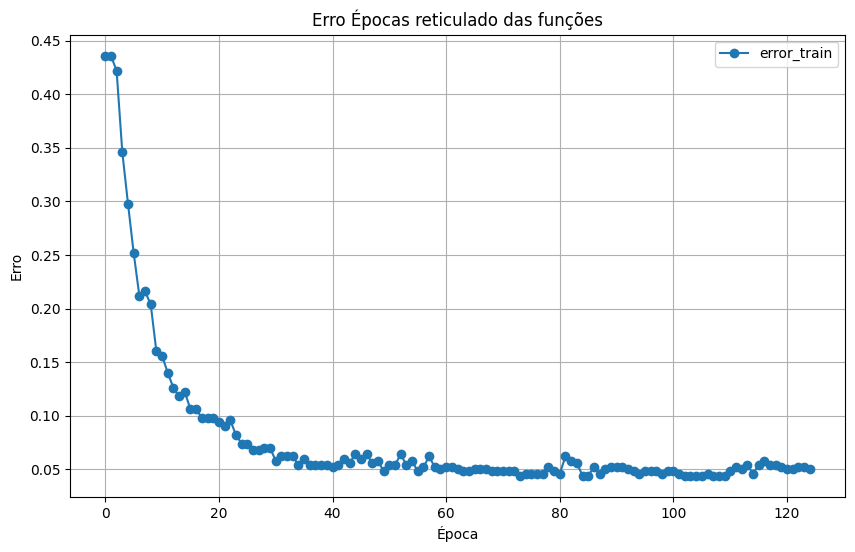

----
Janela 6


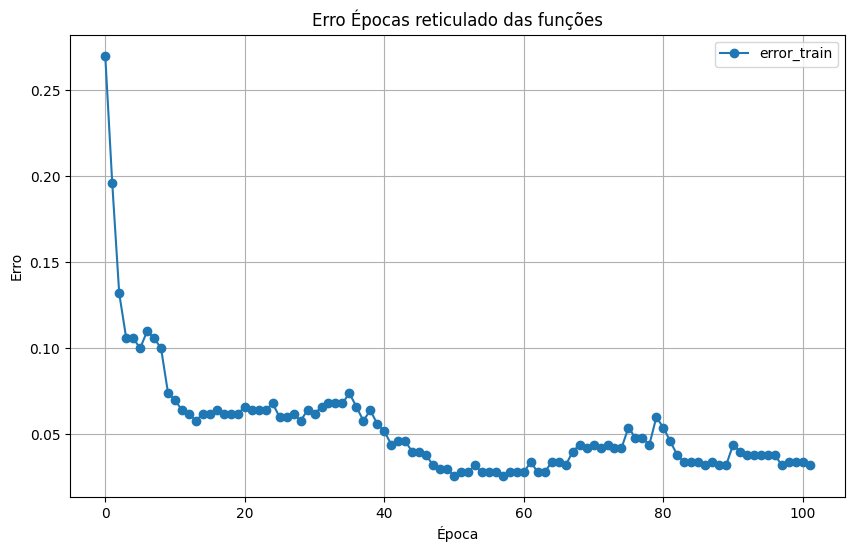

----
Janela 7


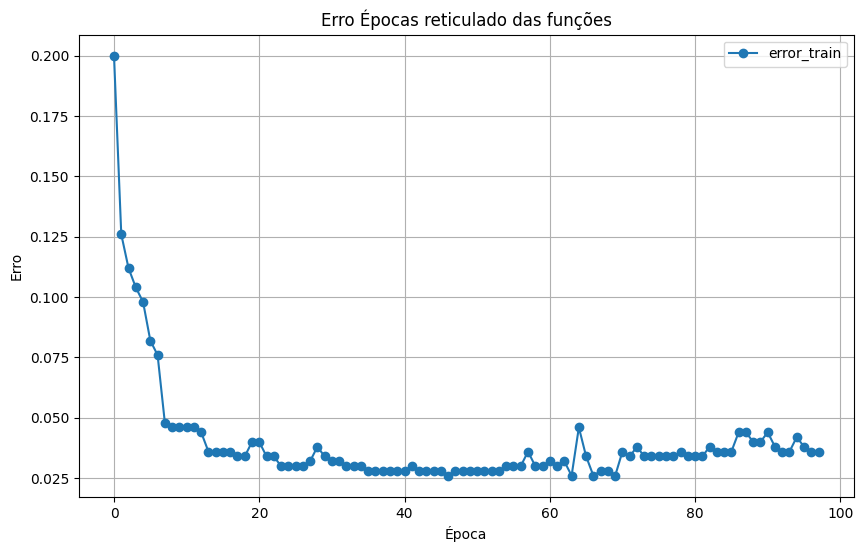

----
Janela 8


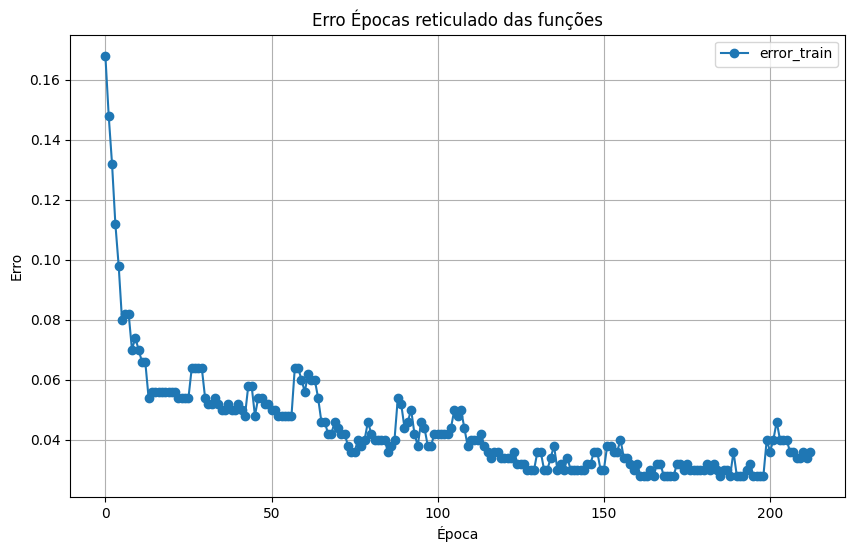

----
Janela 9


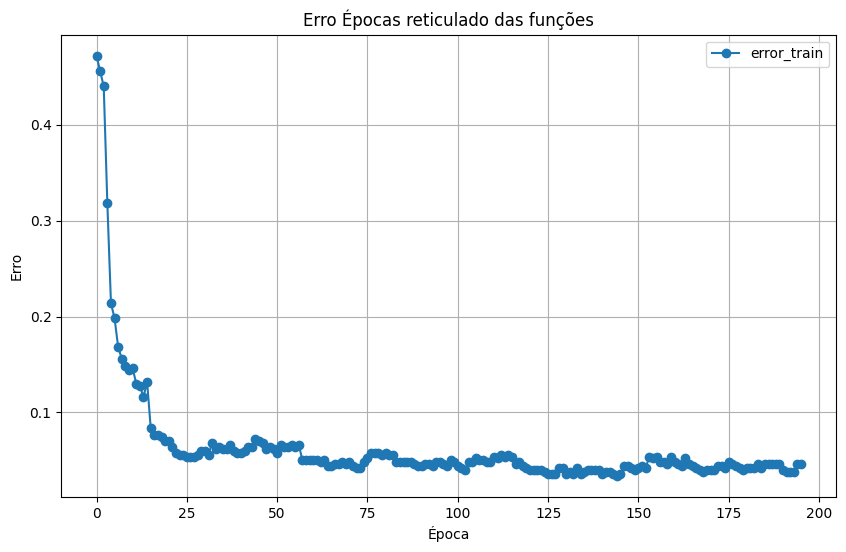

----
Janela 10


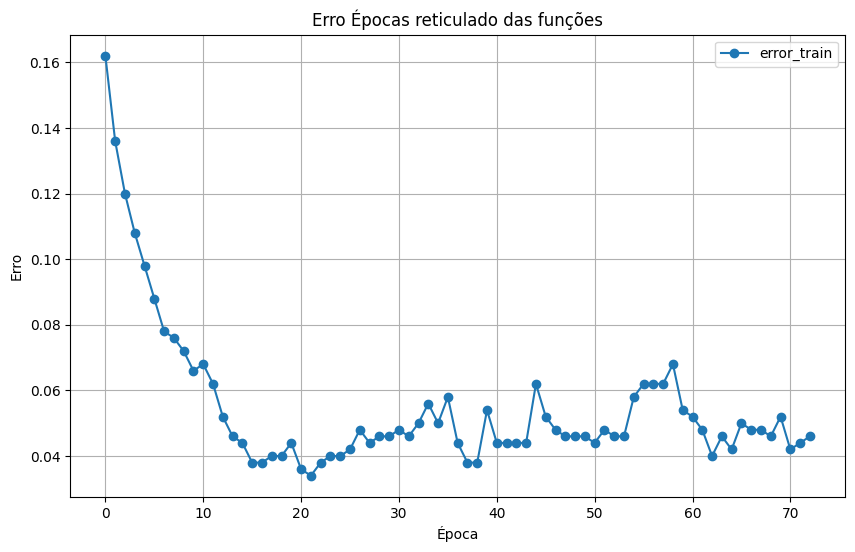

----
Janela 11


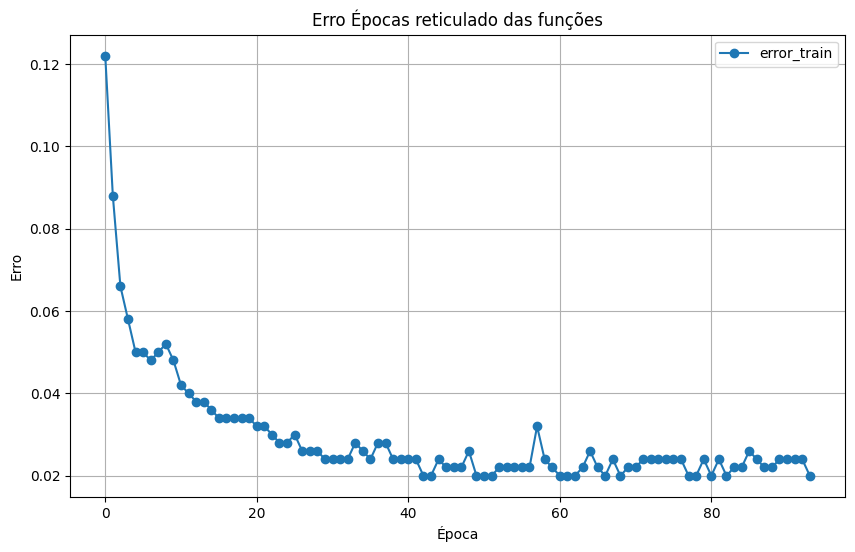

----
Janela 12


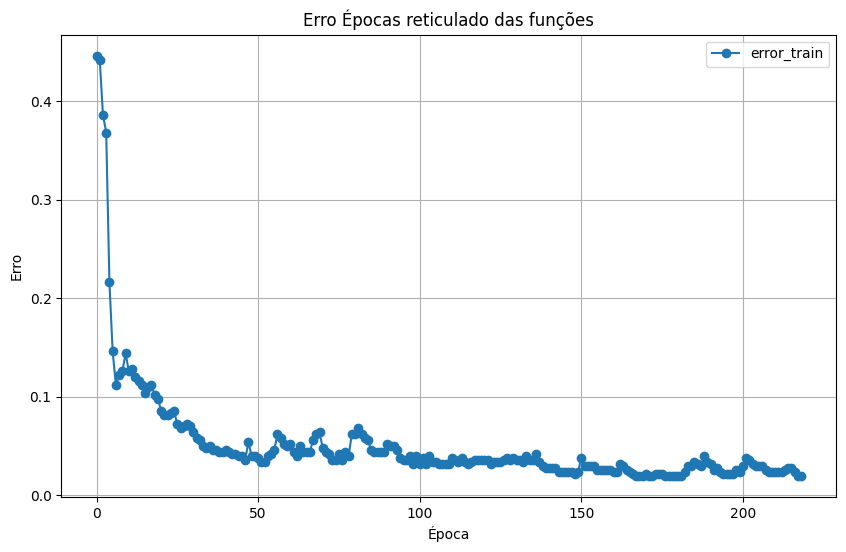

----
Janela 13


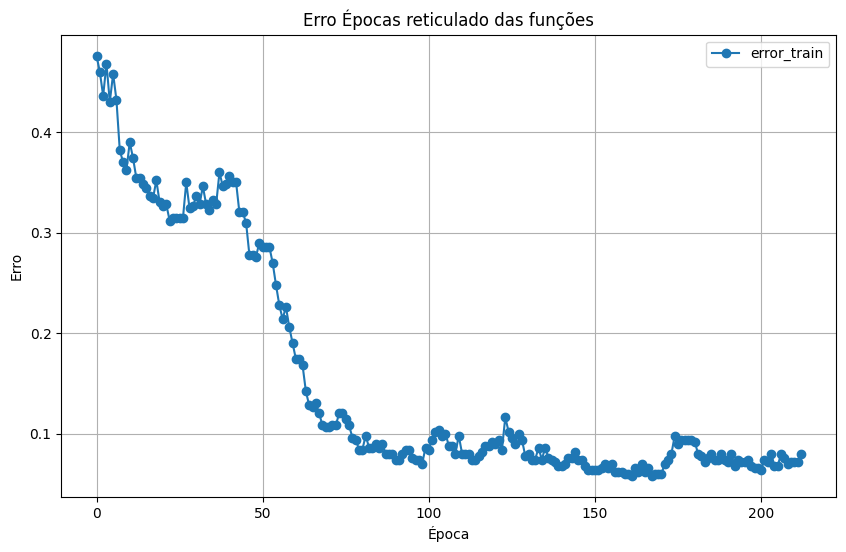

----
Janela 14


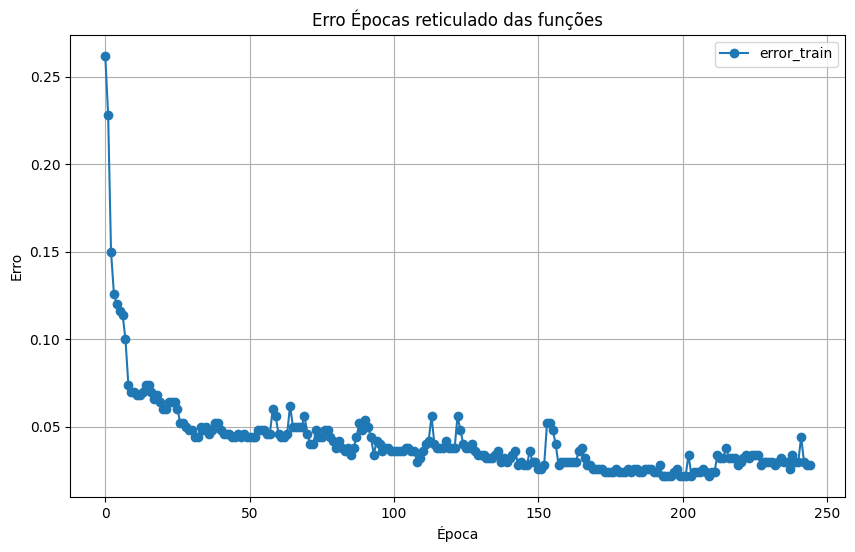

----
Janela 15


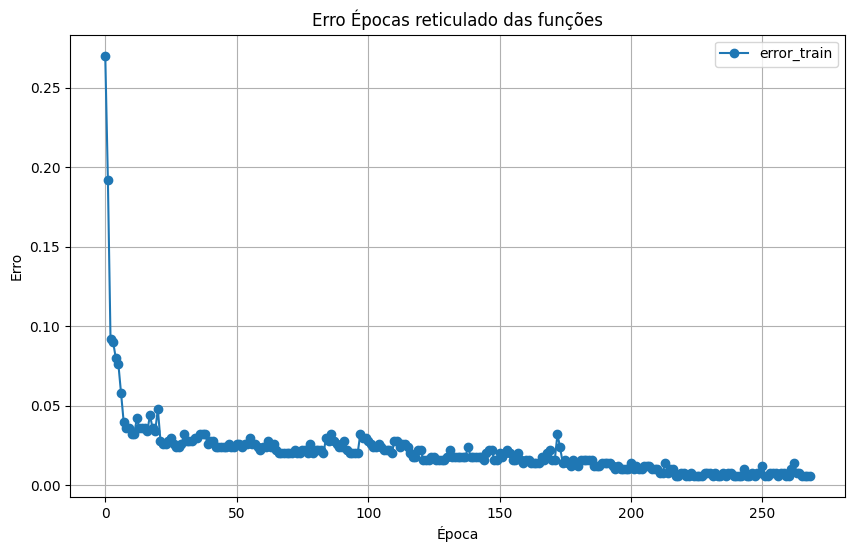

----
Janela 16


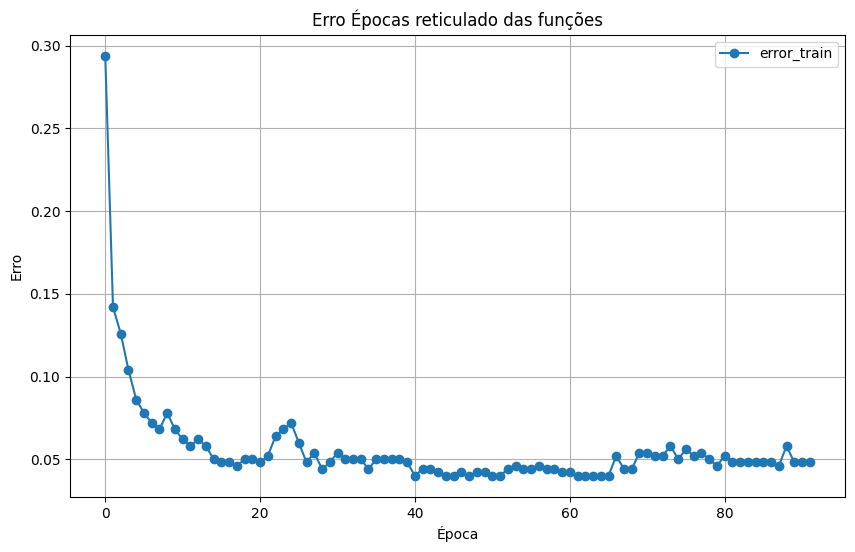

----
Janela 17


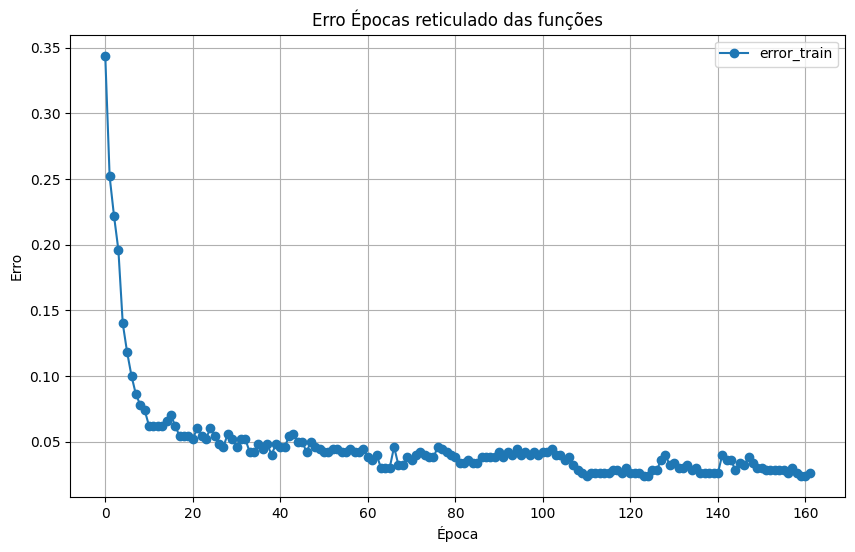

----
Janela 18


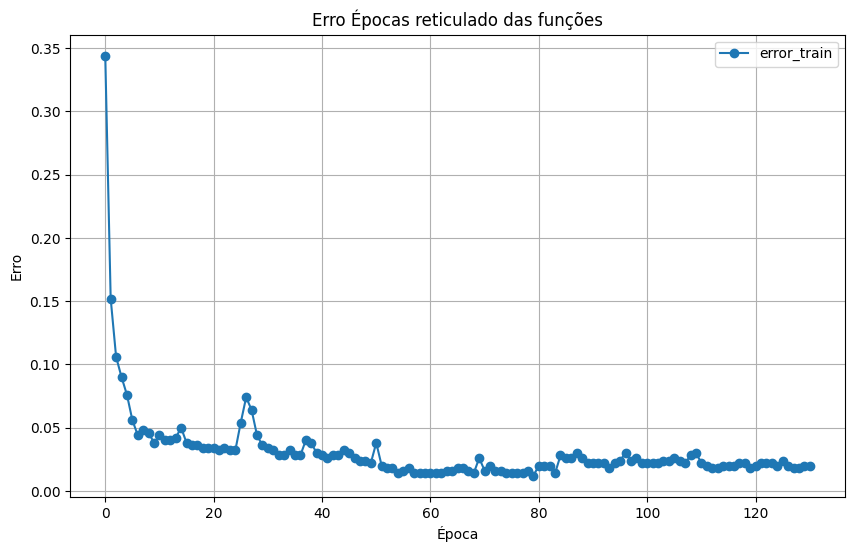

----
Janela 19


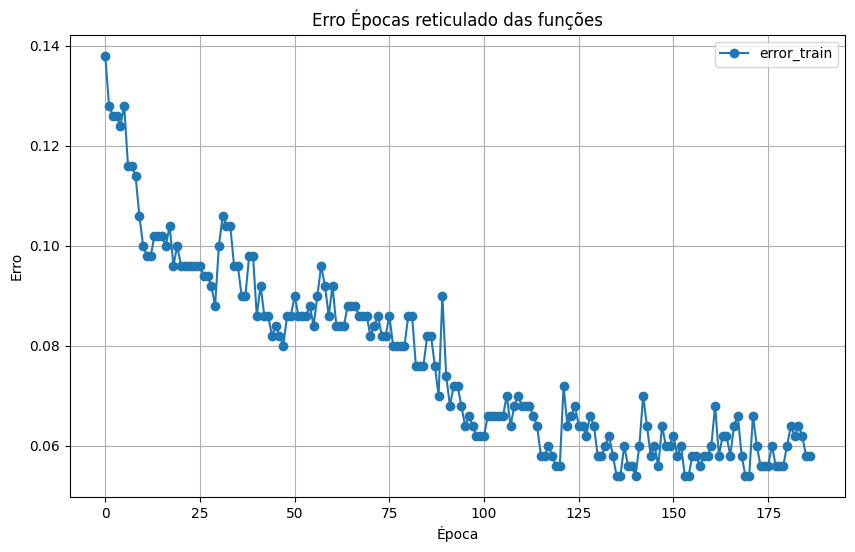

----
Janela 20


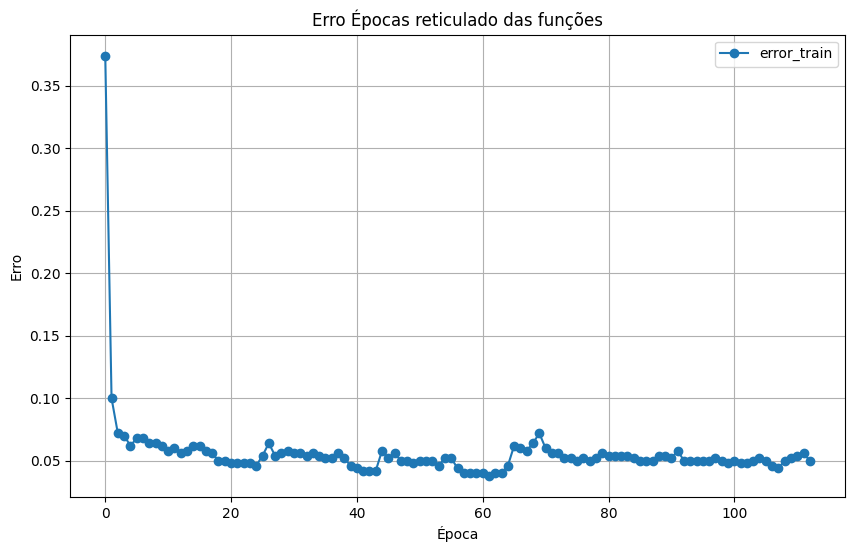

----
Janela 21


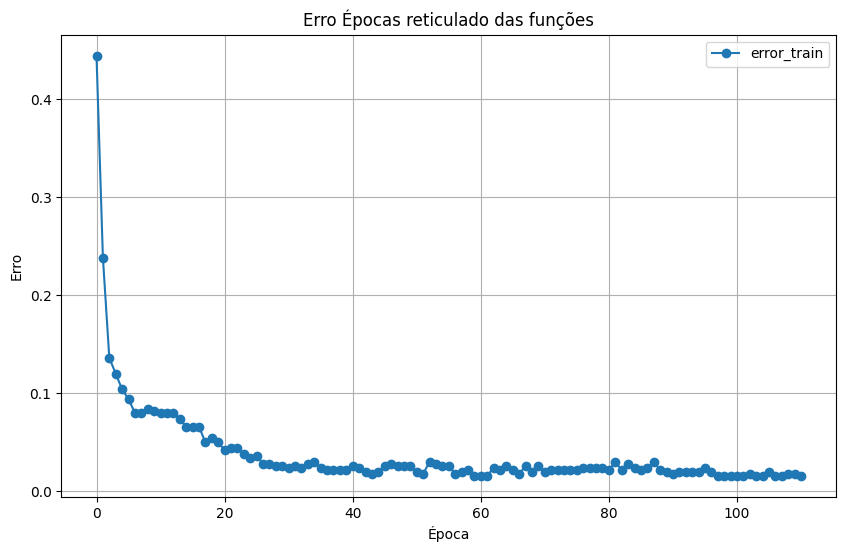

----
Janela 22


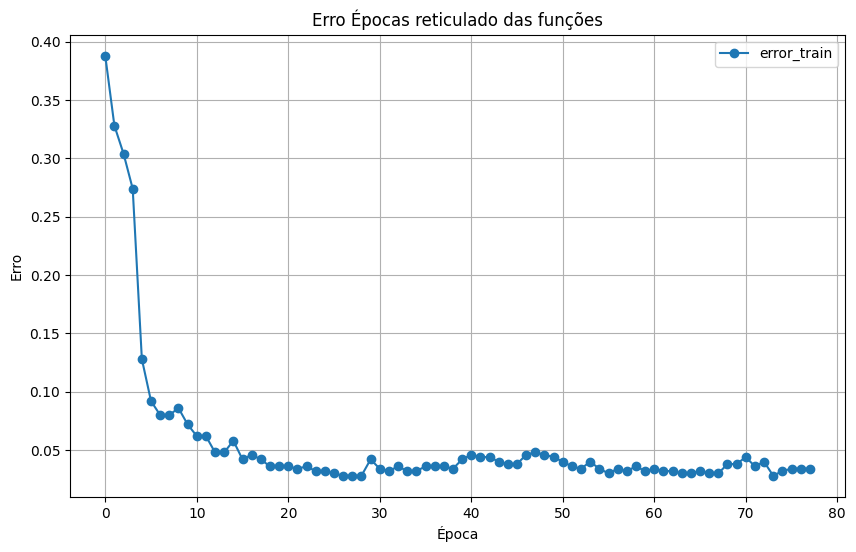

----
Janela 23


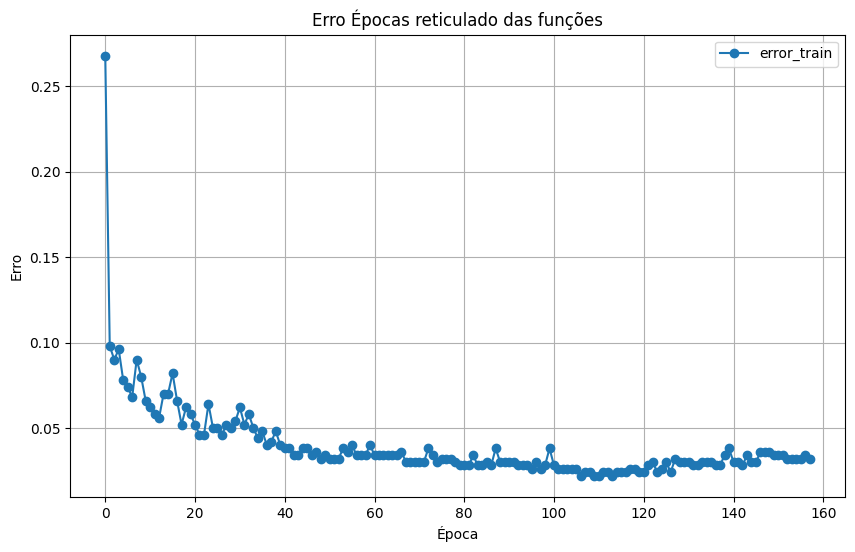

----
Janela 24


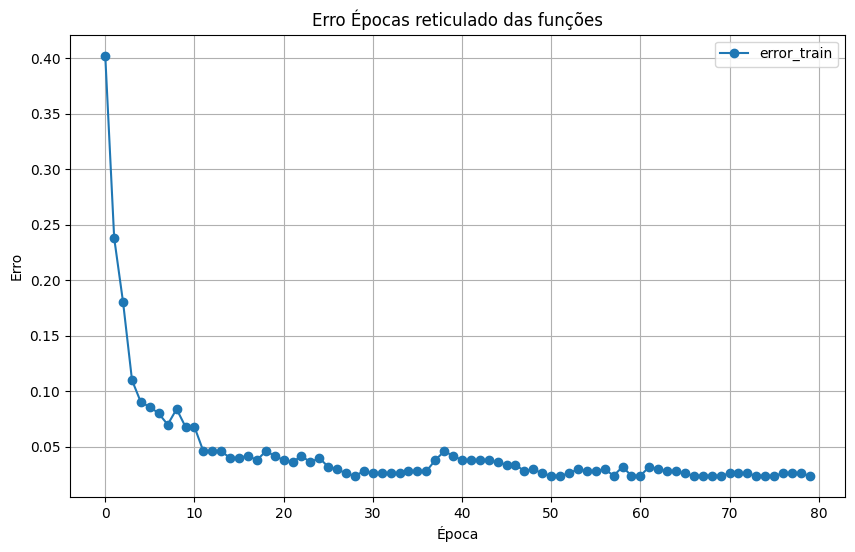

----
Janela 25


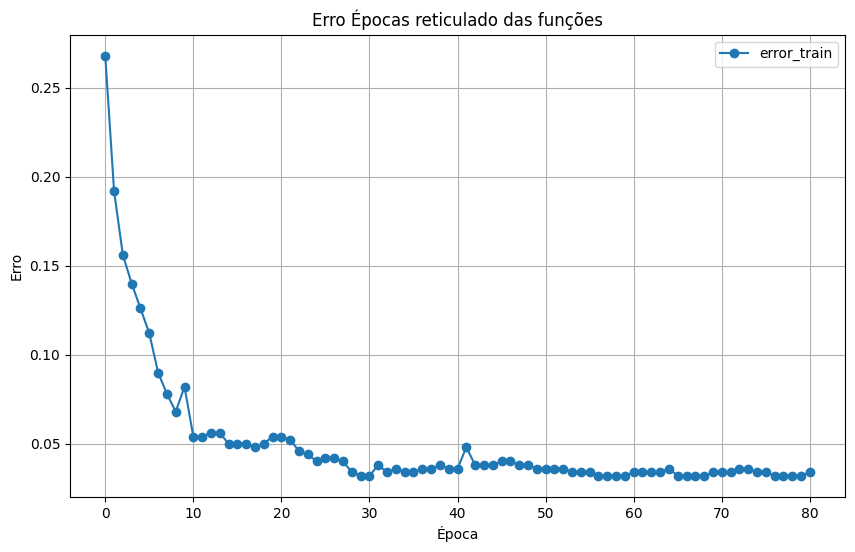

----
Janela 26


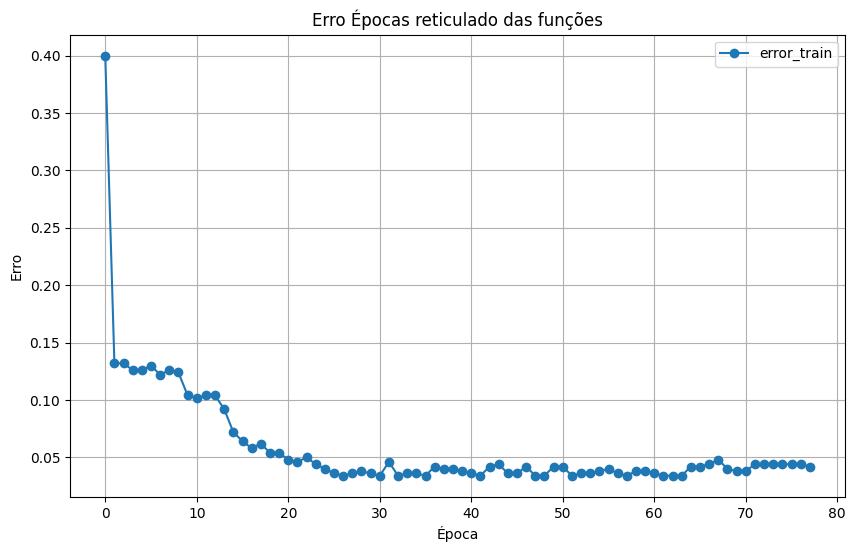

----
Janela 27


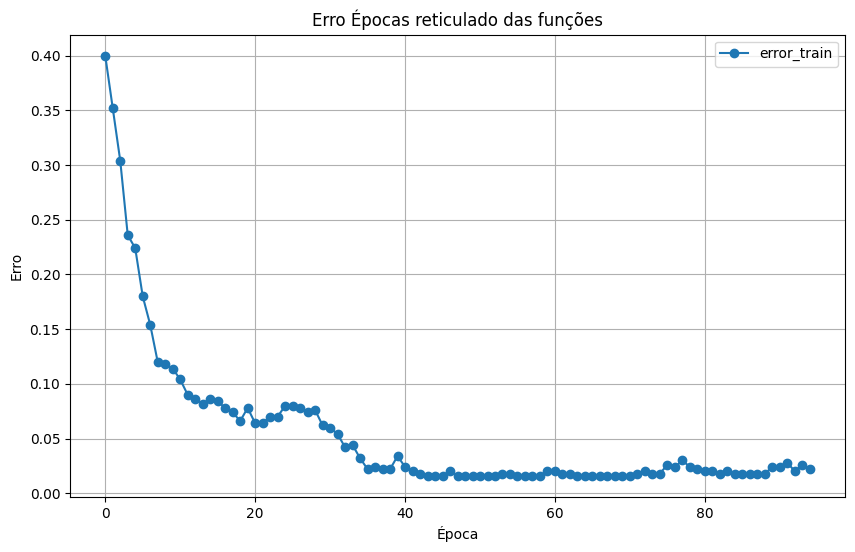

----
Janela 28


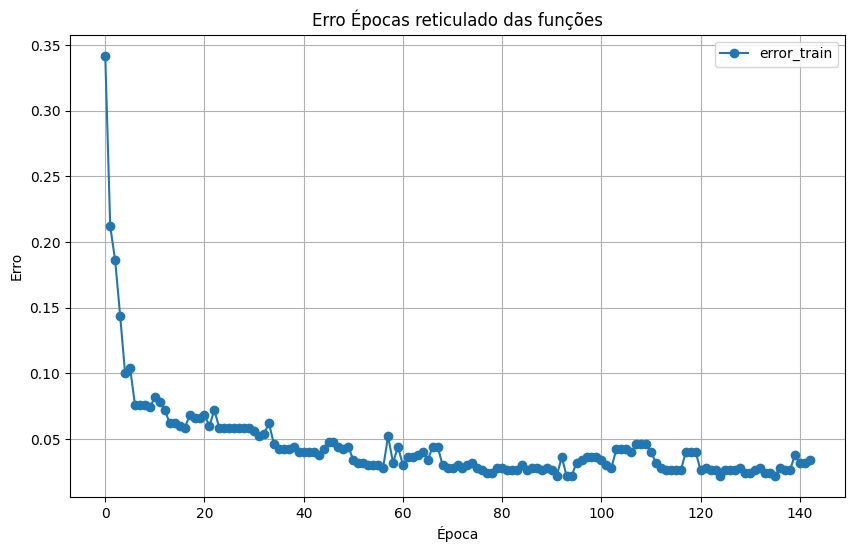

----
Janela 29


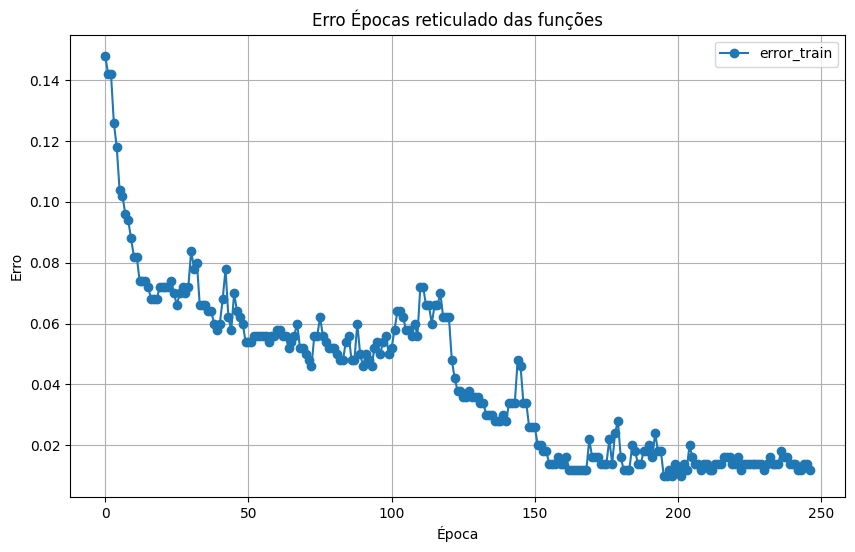

----
Janela 30


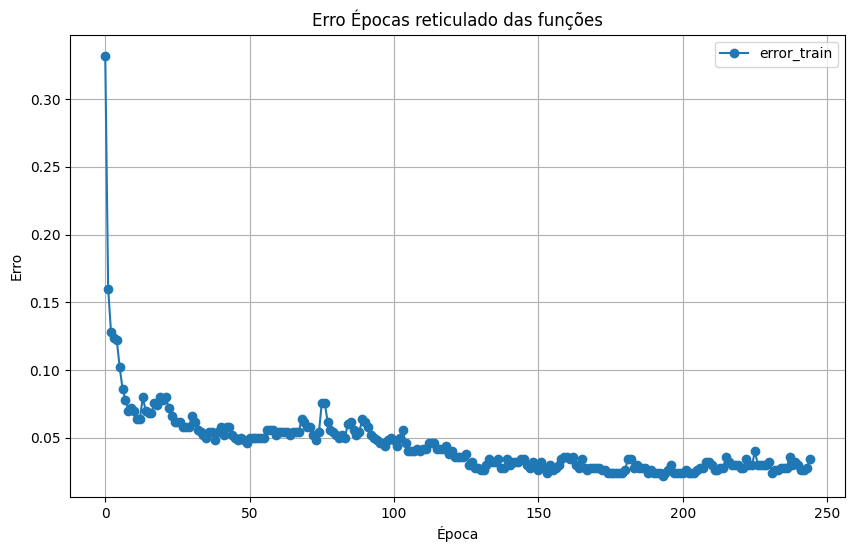

----
Janela 31


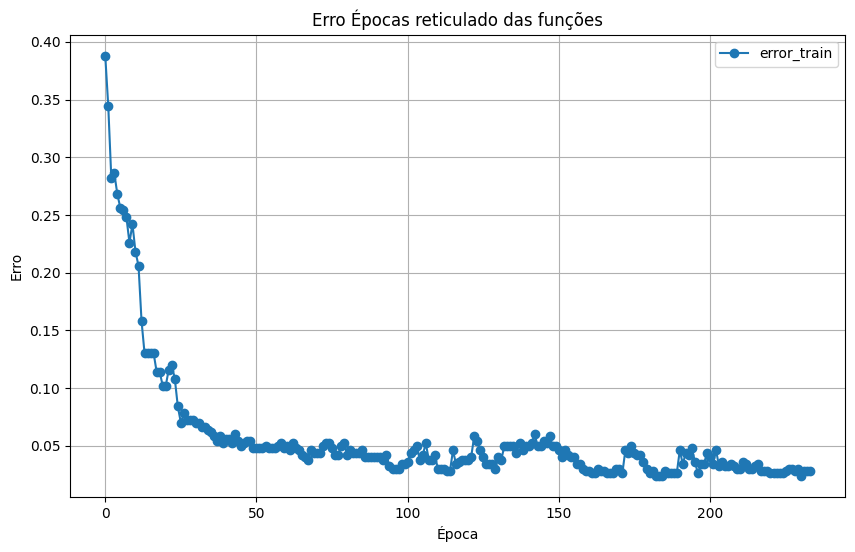

----
Janela 32


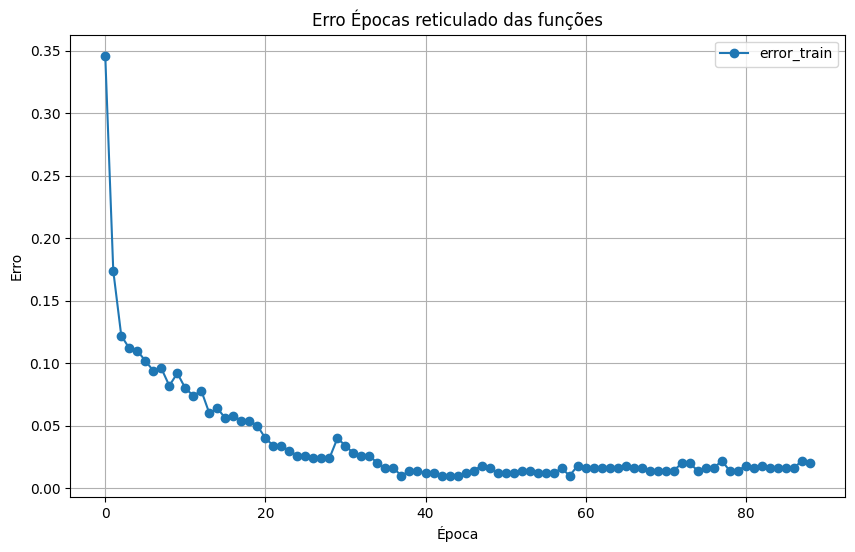

----
Janela 33


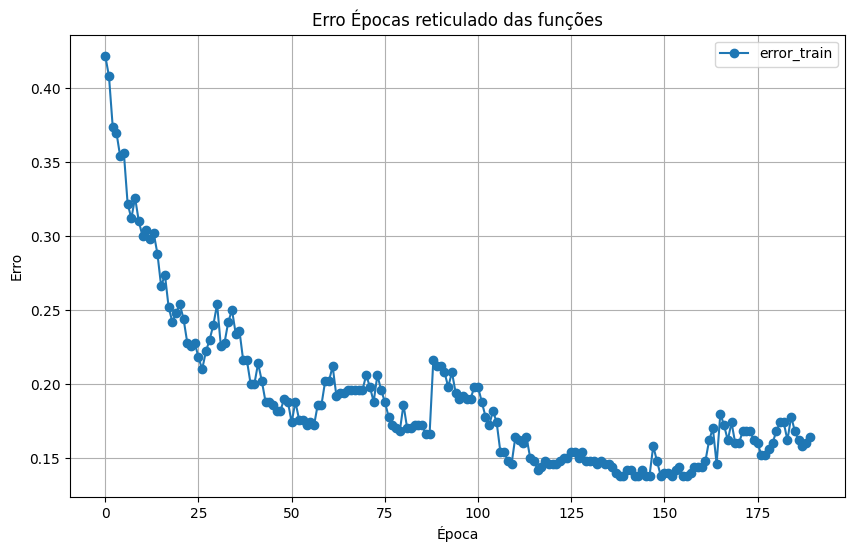

----
Janela 34


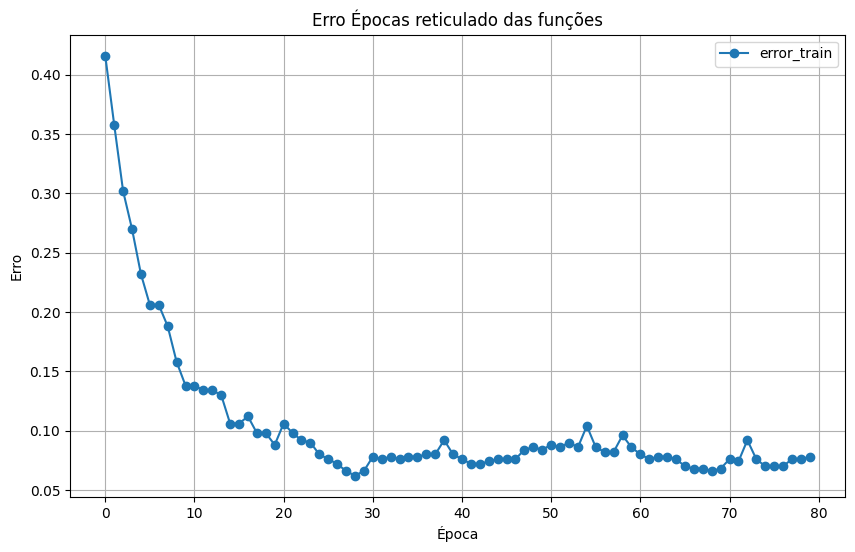

----
Janela 35


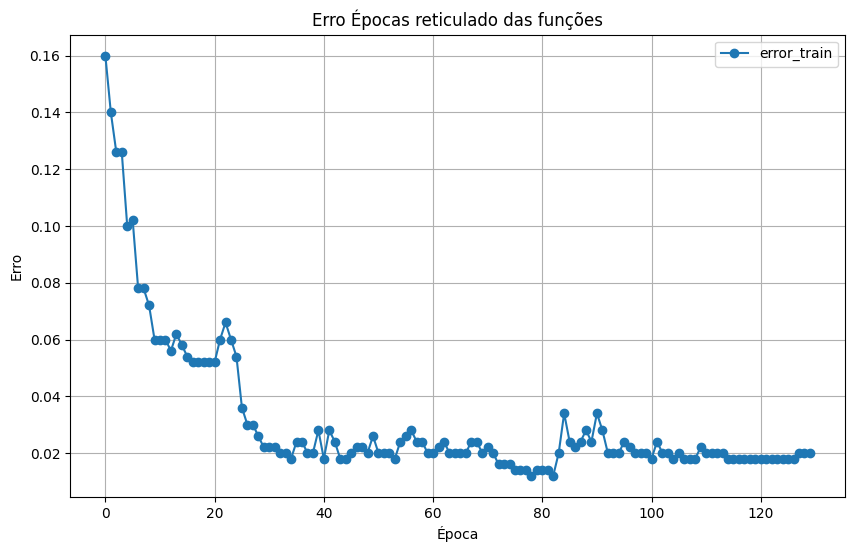

----
Janela 36


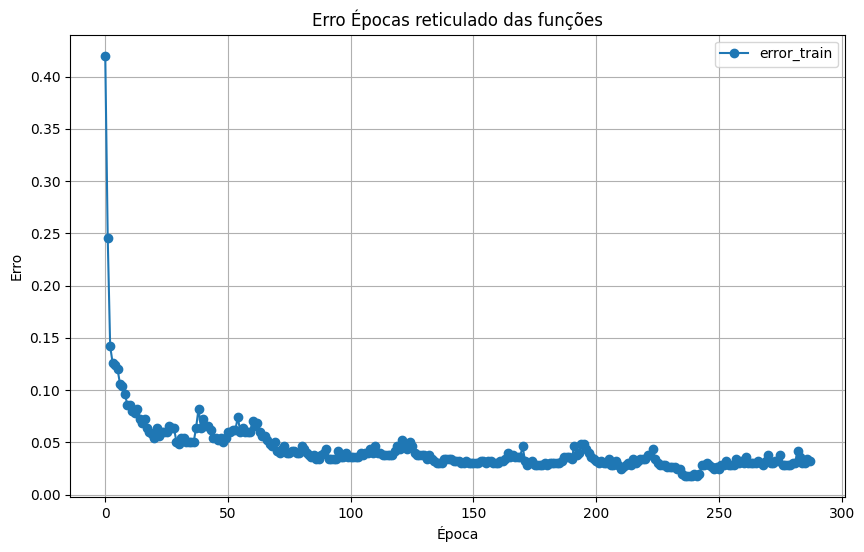

----
Janela 37


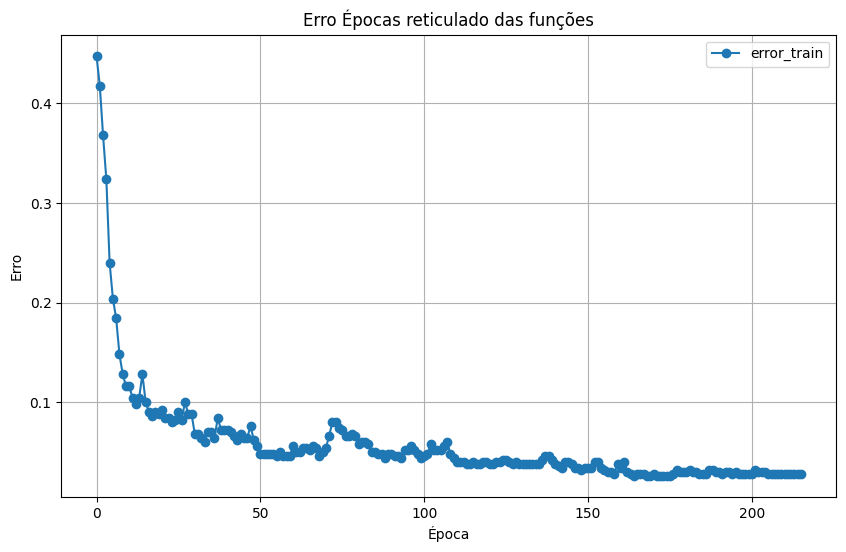

----
Janela 38


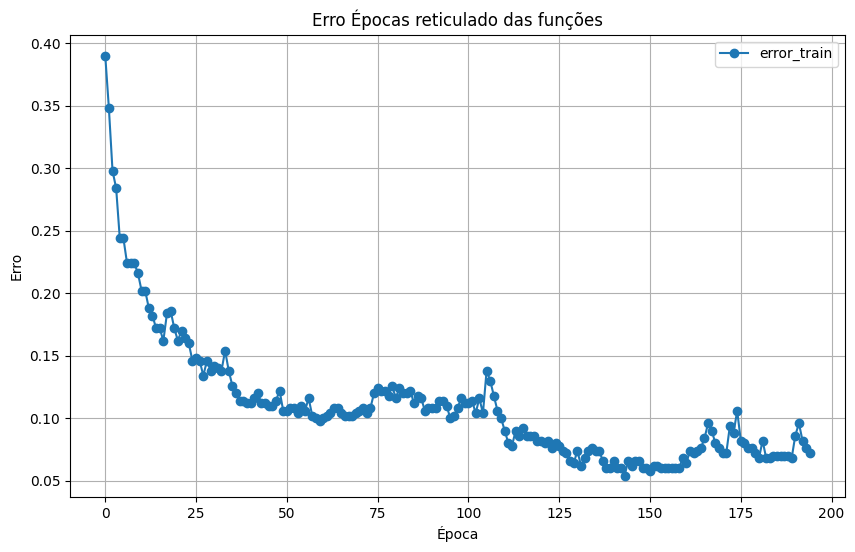

----
Janela 39


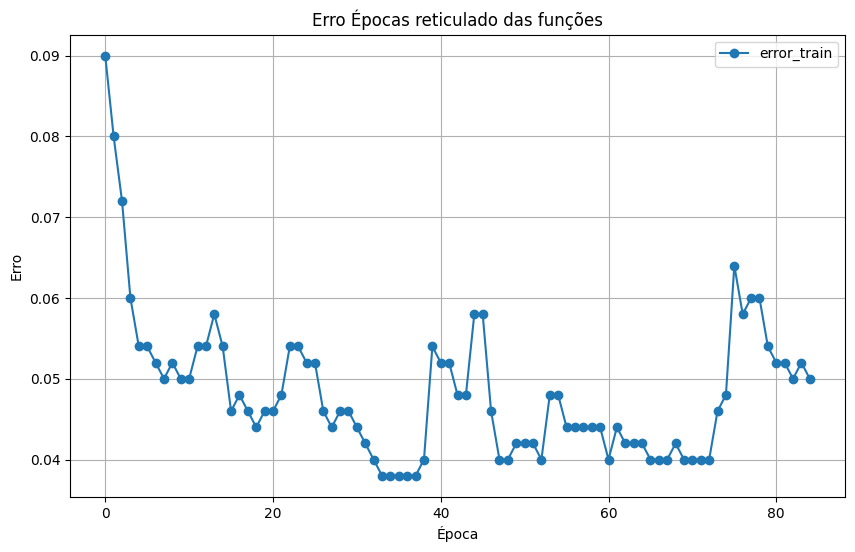

----
Janela 40


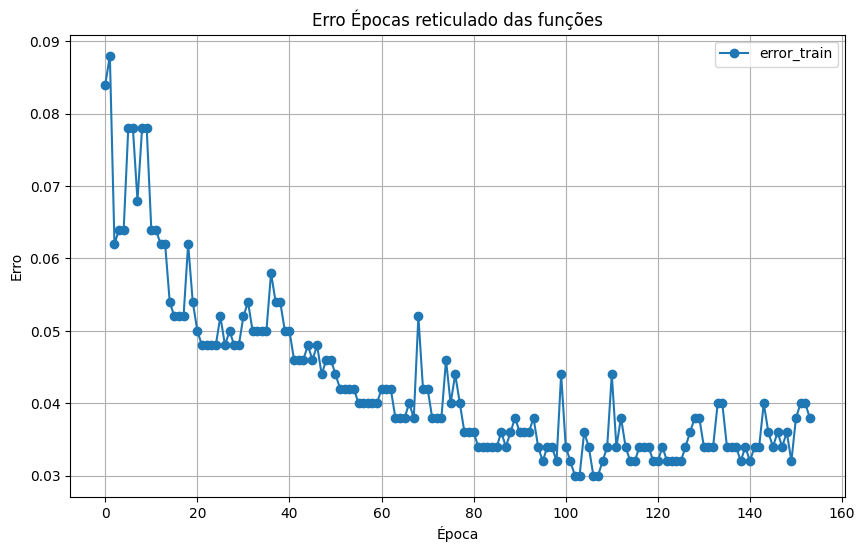

----
Janela 41


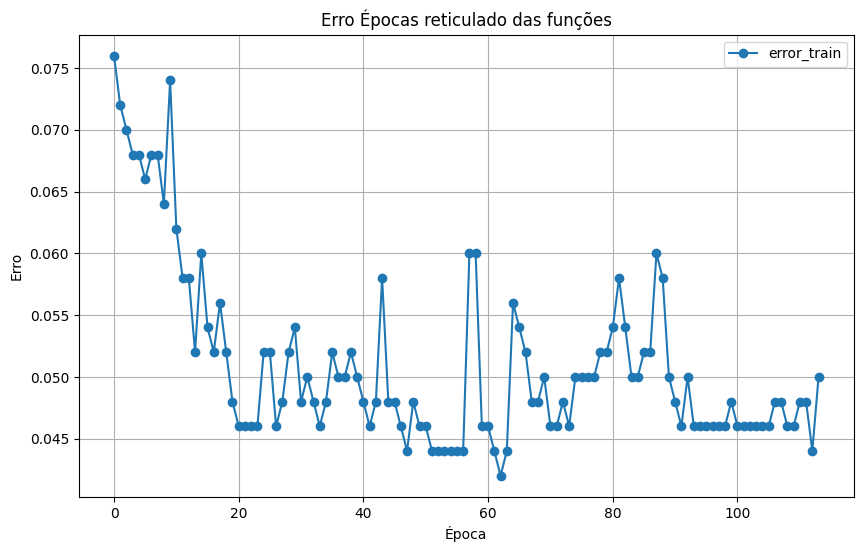

----
Janela 42


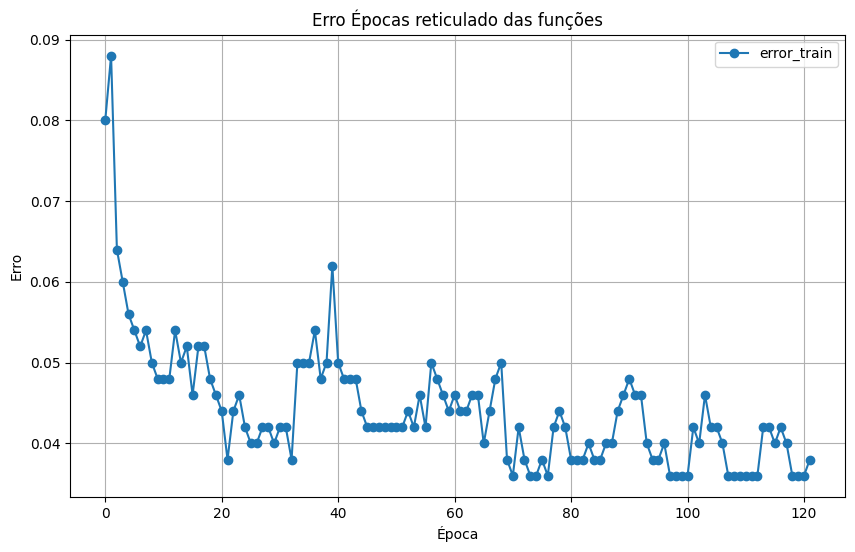

----
Janela 43


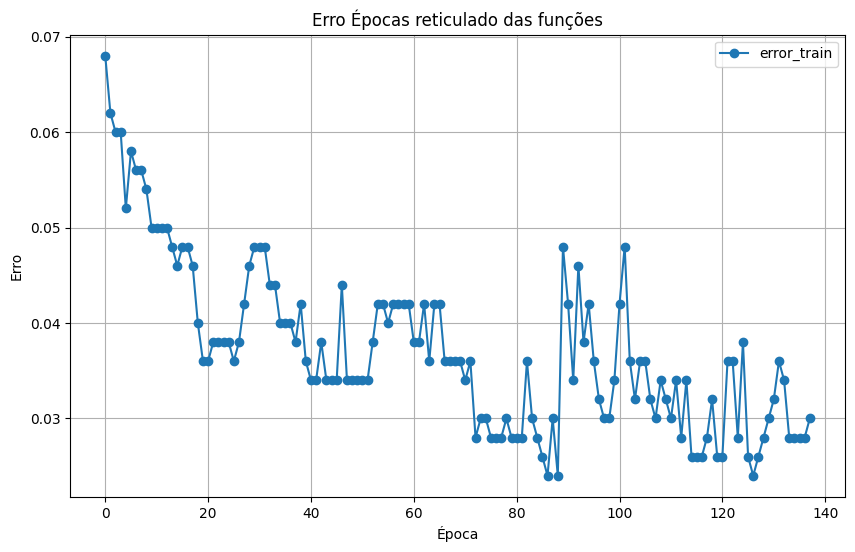

----
Janela 44


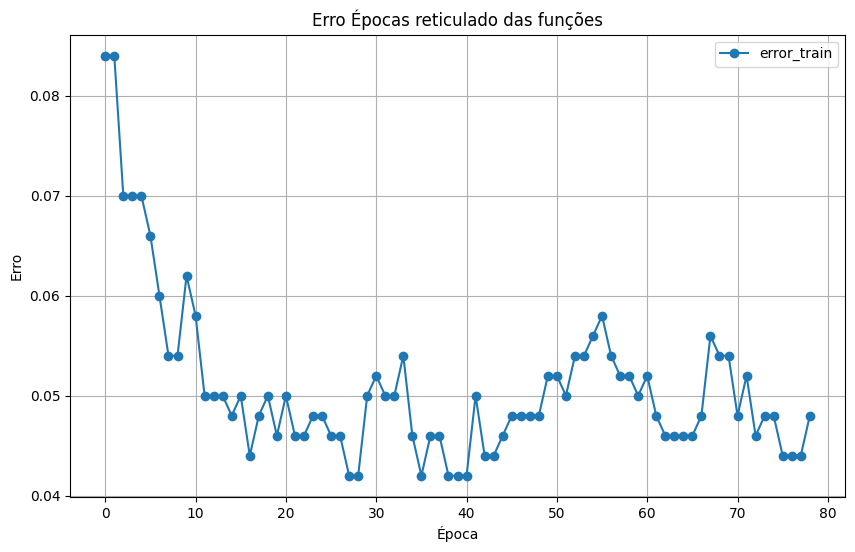

----
Janela 45


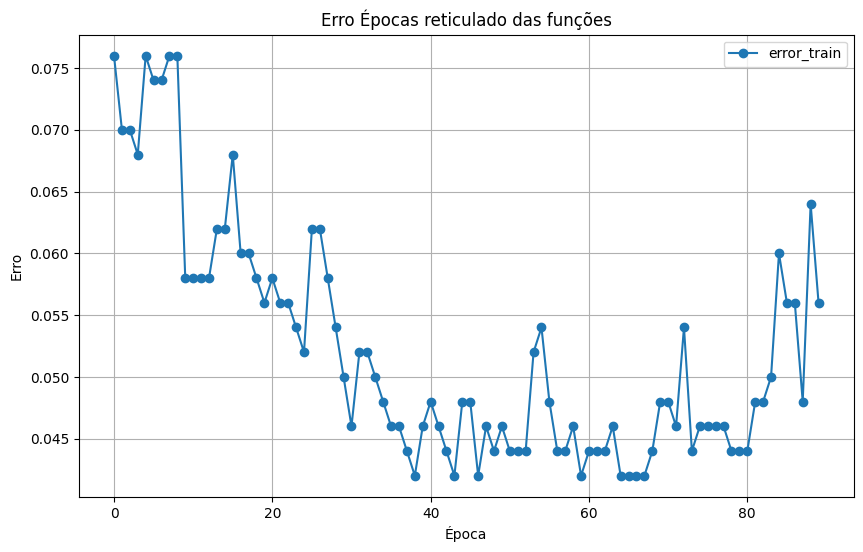

----
Janela 46


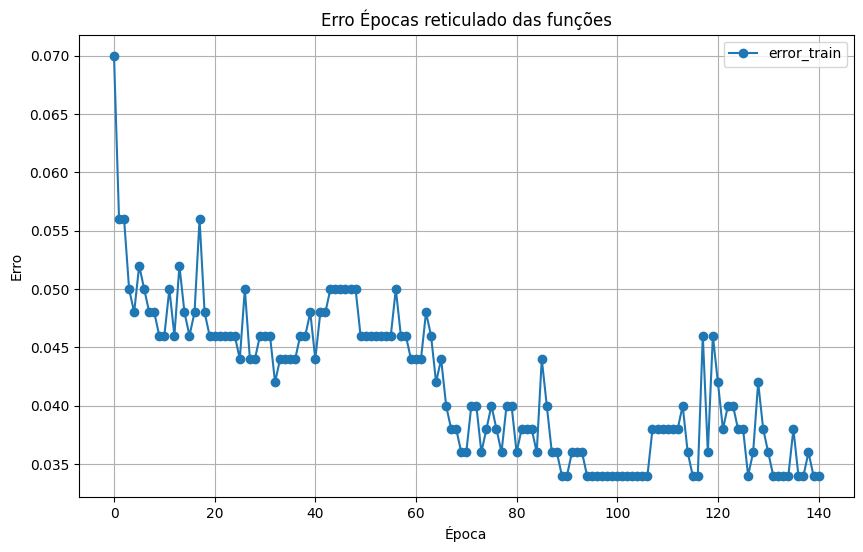

----
Janela 47


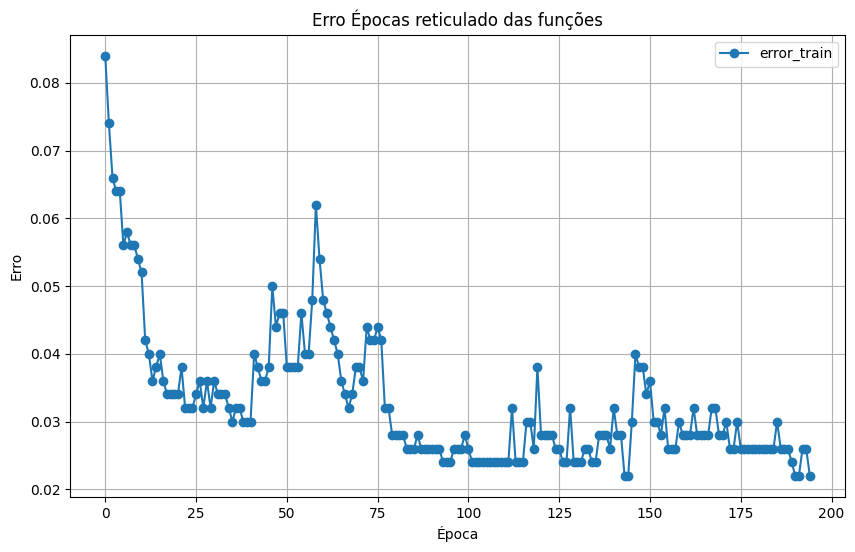

----
Janela 48


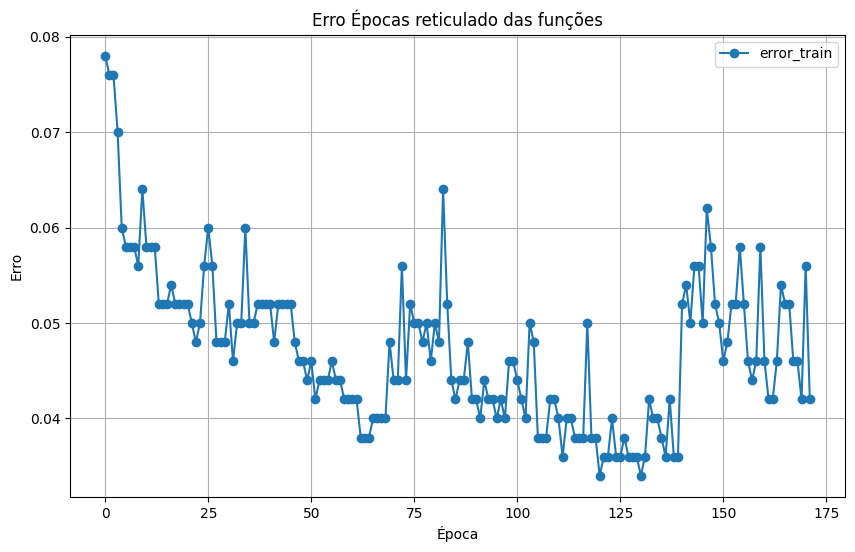

----
Janela 49


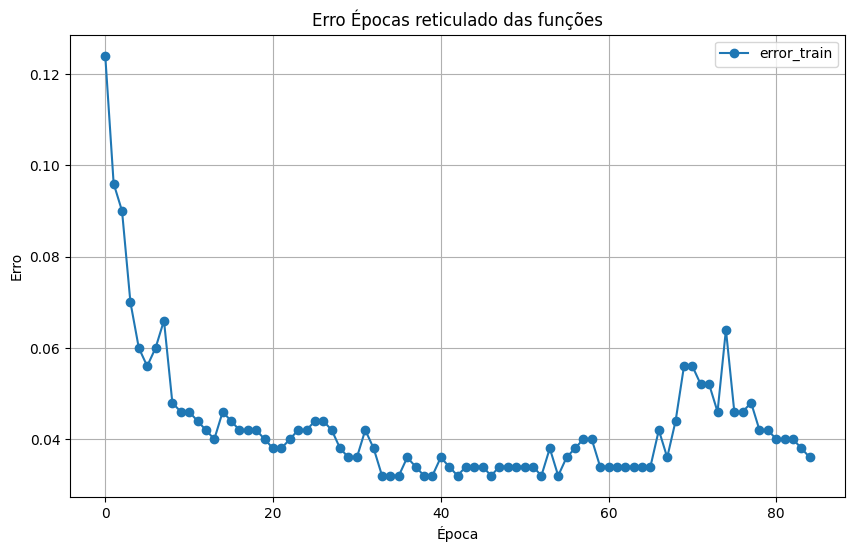

----
Janela 50


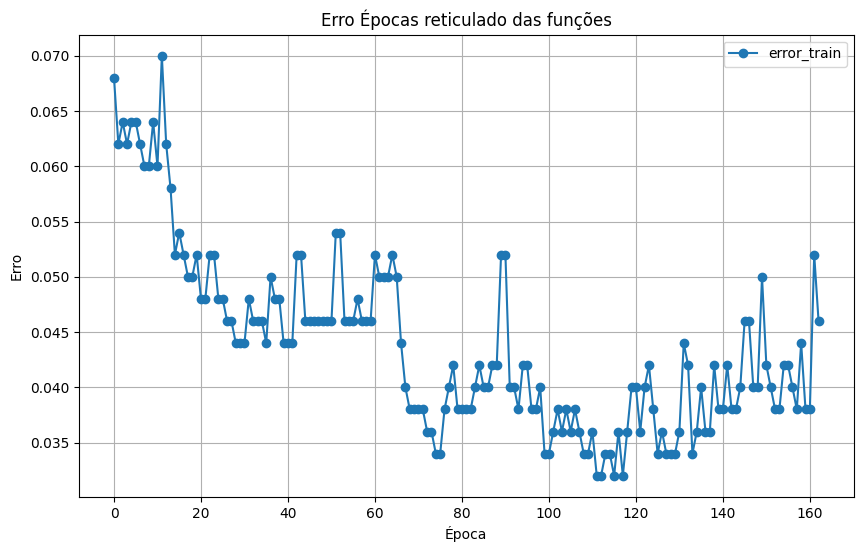

----
Janela 51


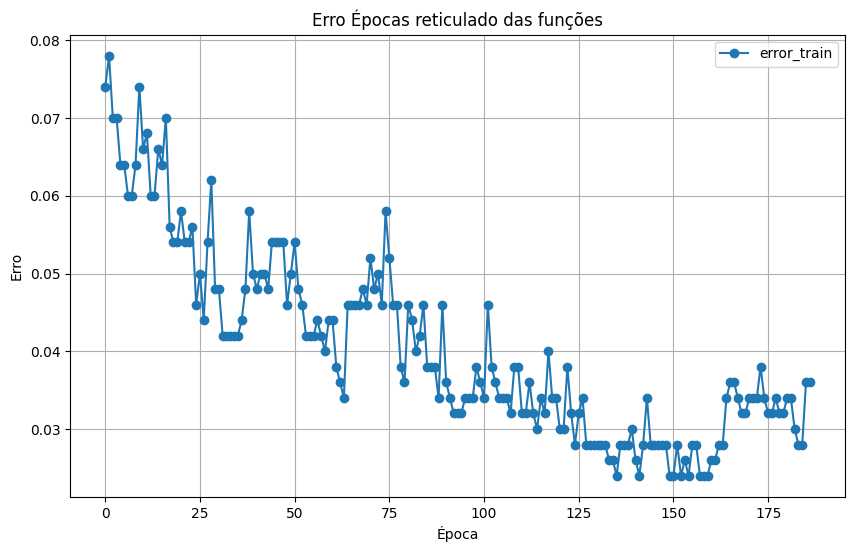

----
Janela 52


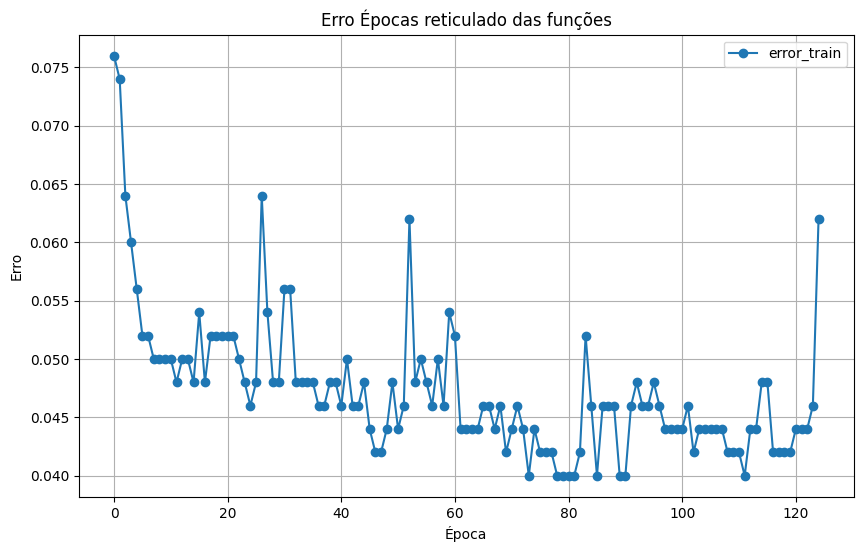

----
Janela 53


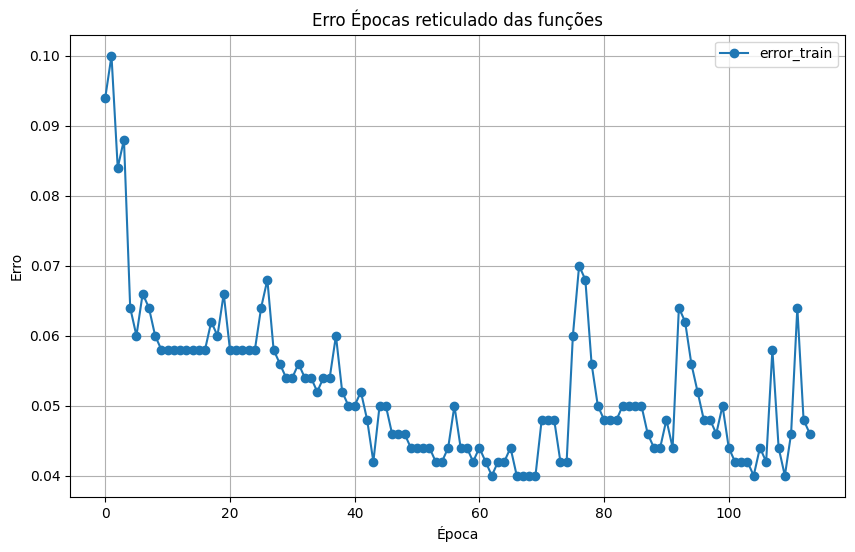

----
Janela 54


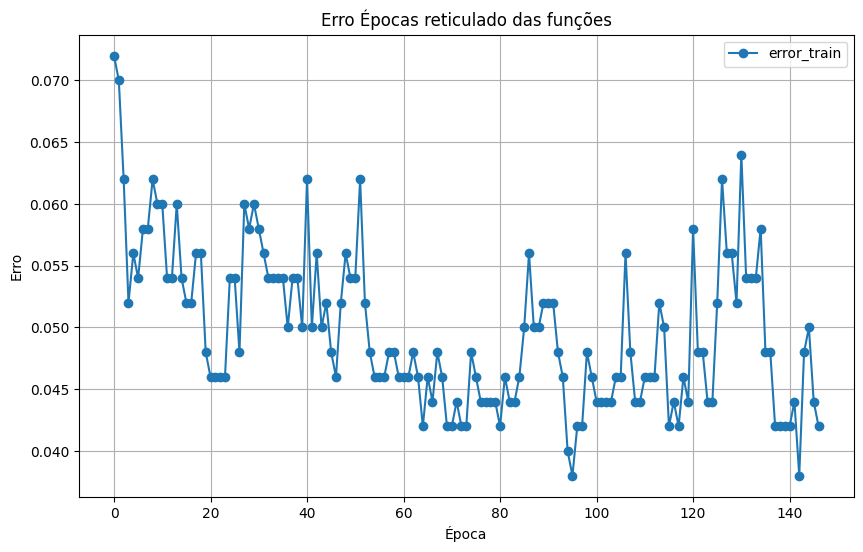

----
Janela 55


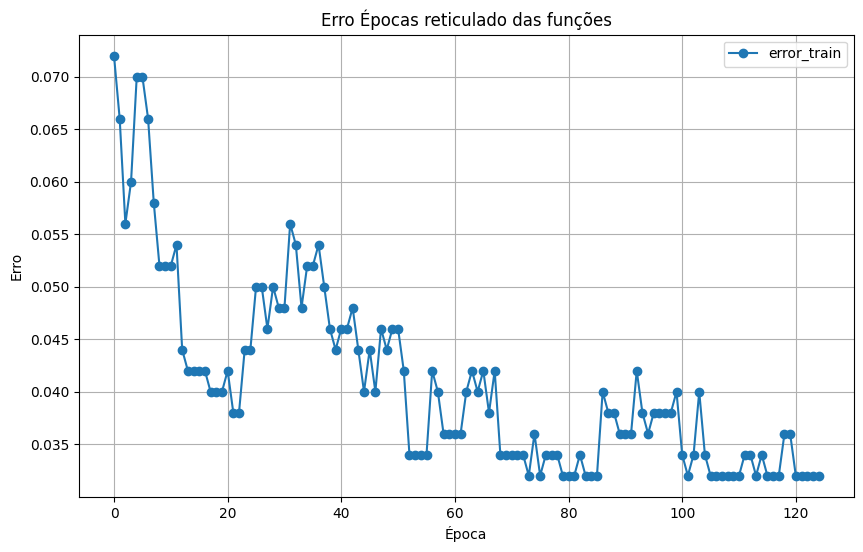

----
Janela 56


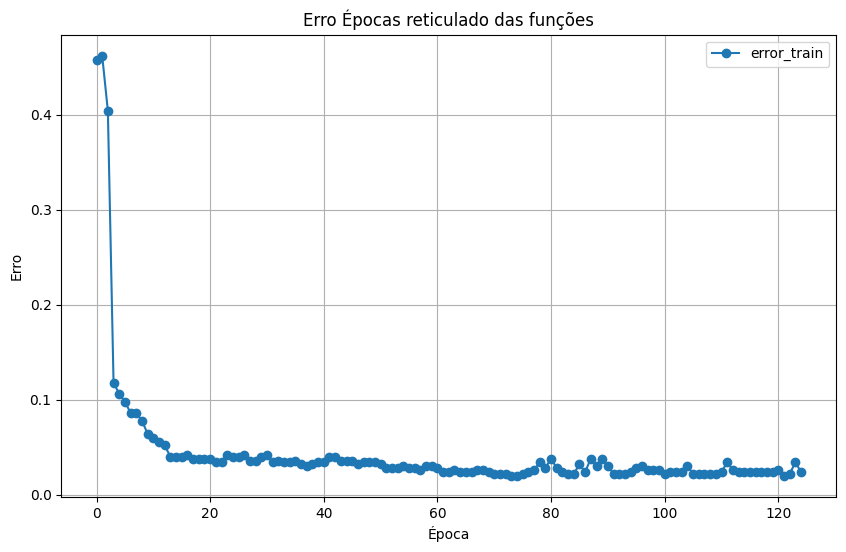

----
Janela 57


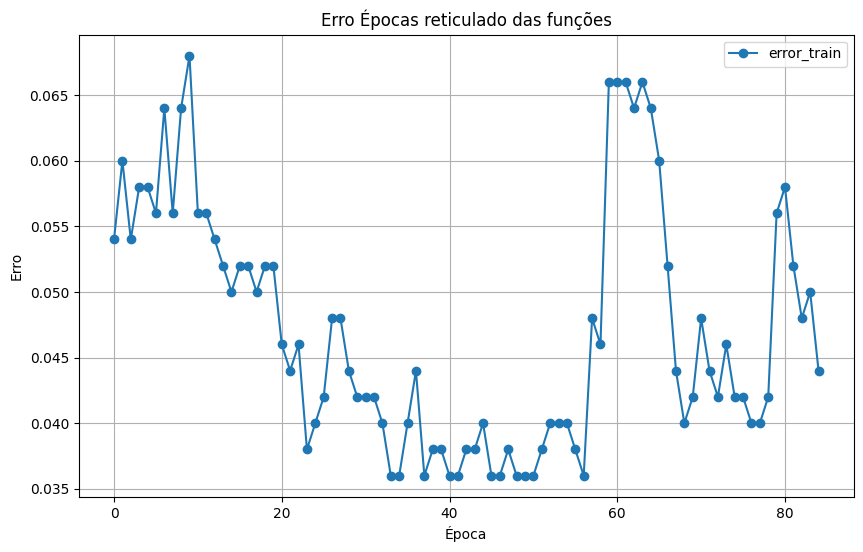

----
Janela 58


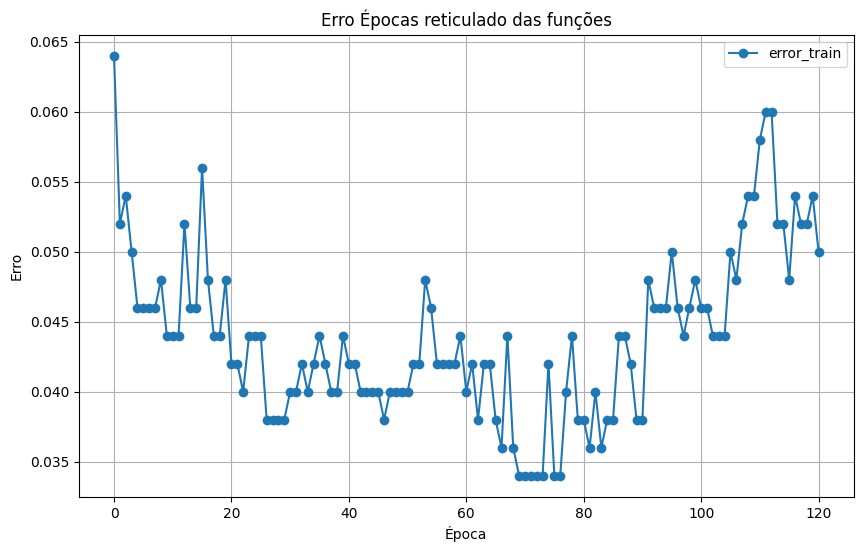

----
Janela 59


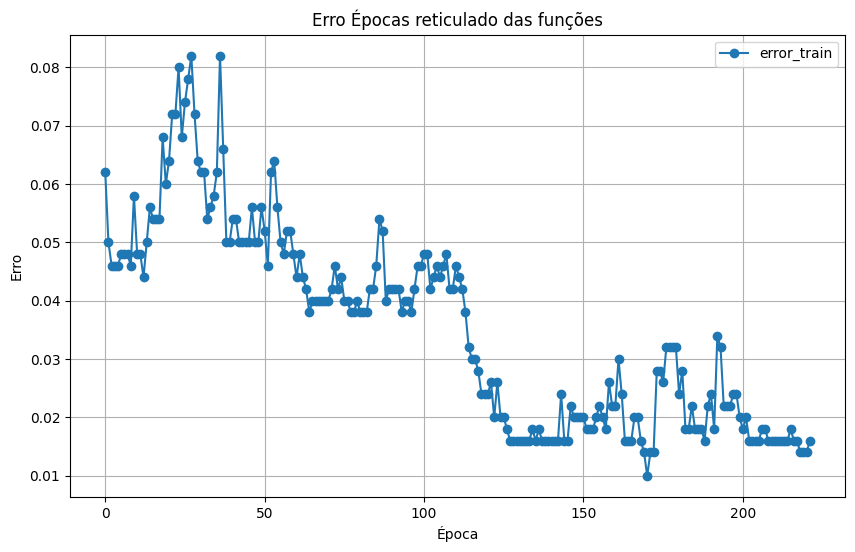

----
Janela 60


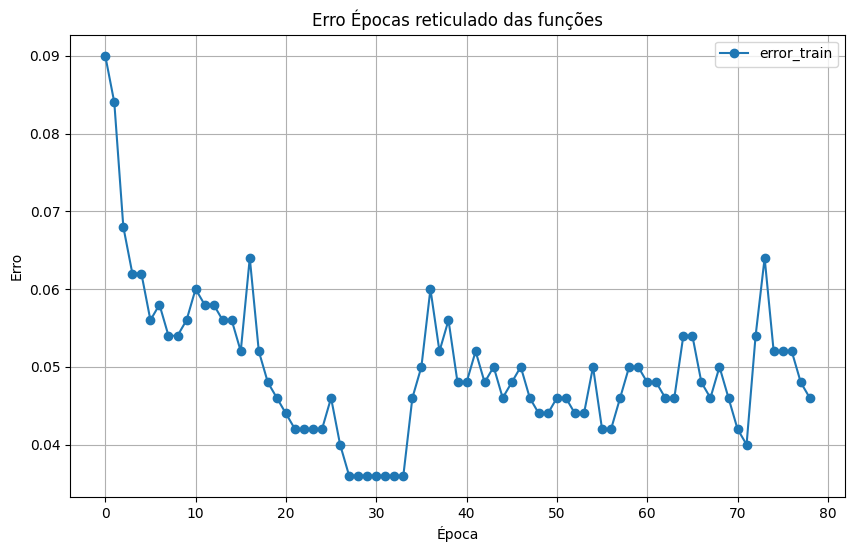

----
Janela 61


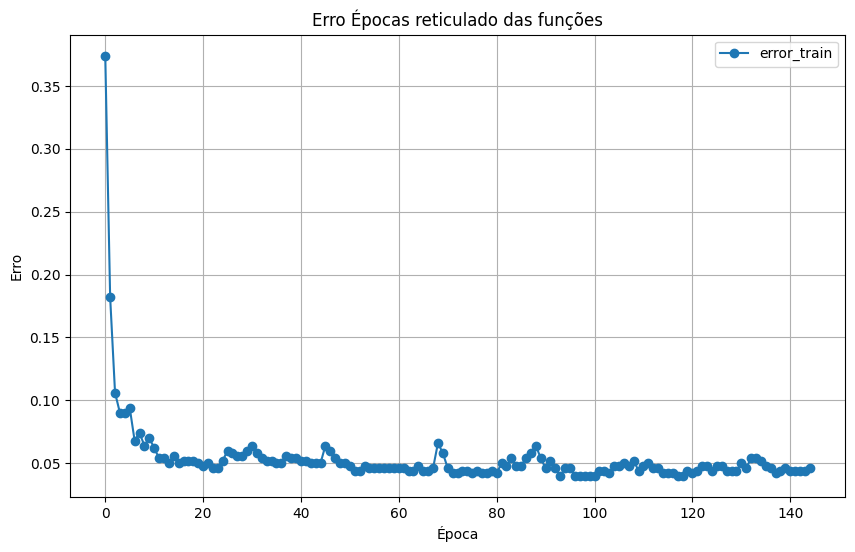

----
Janela 62


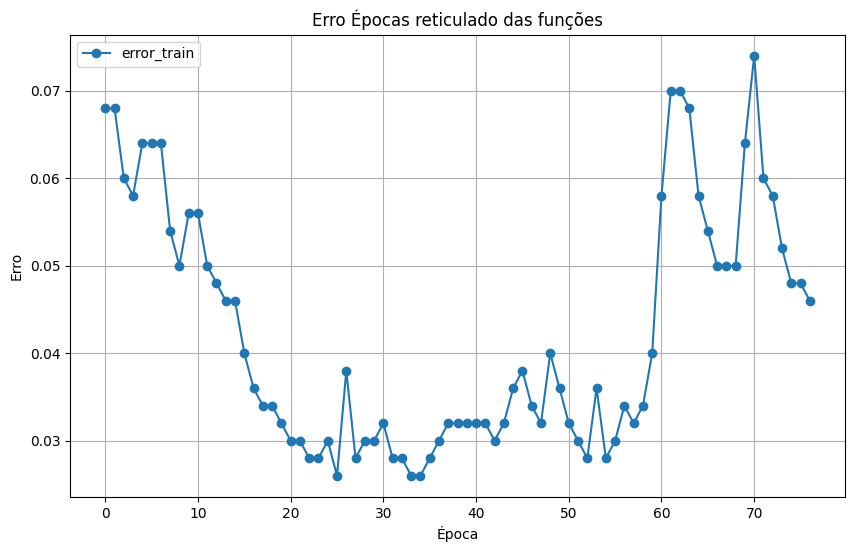

----
Janela 63


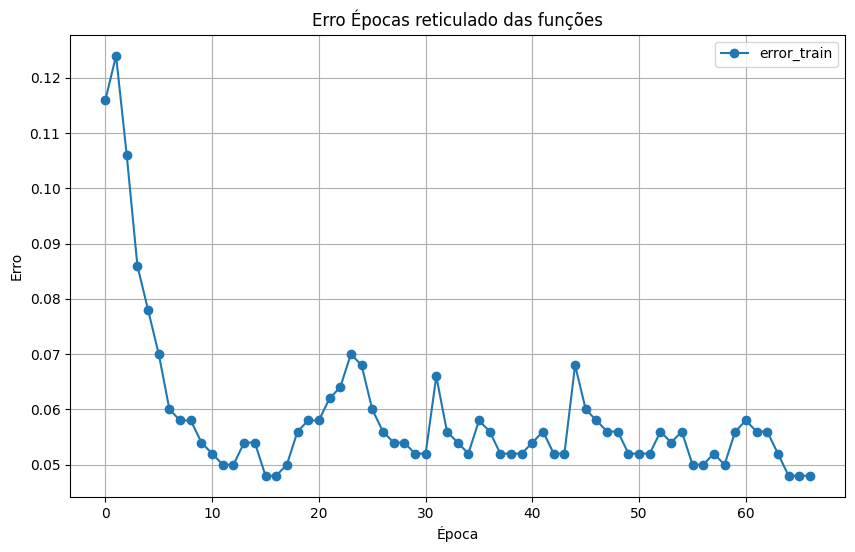

----
Janela 64


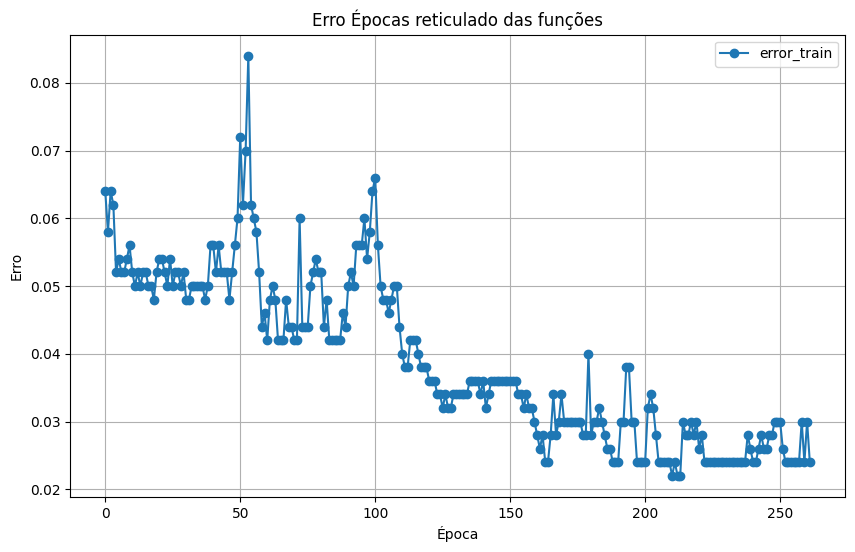

----
Janela 65


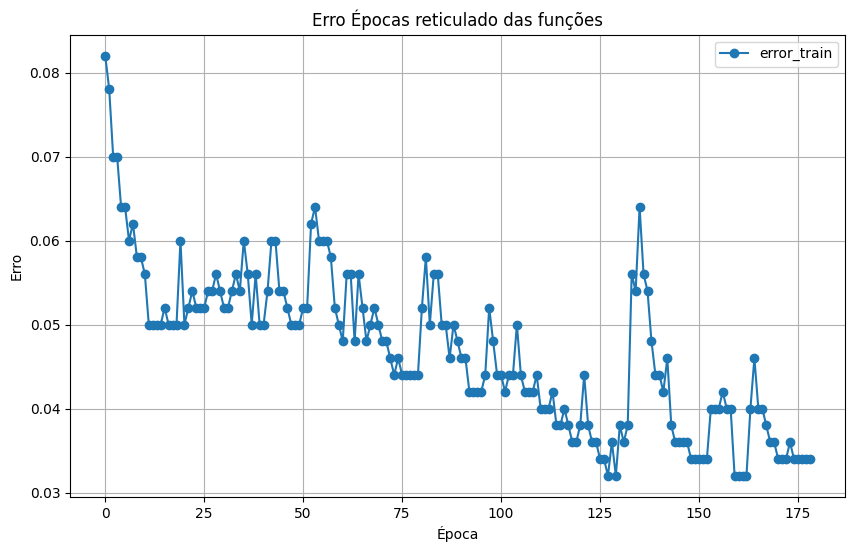

----
Janela 66


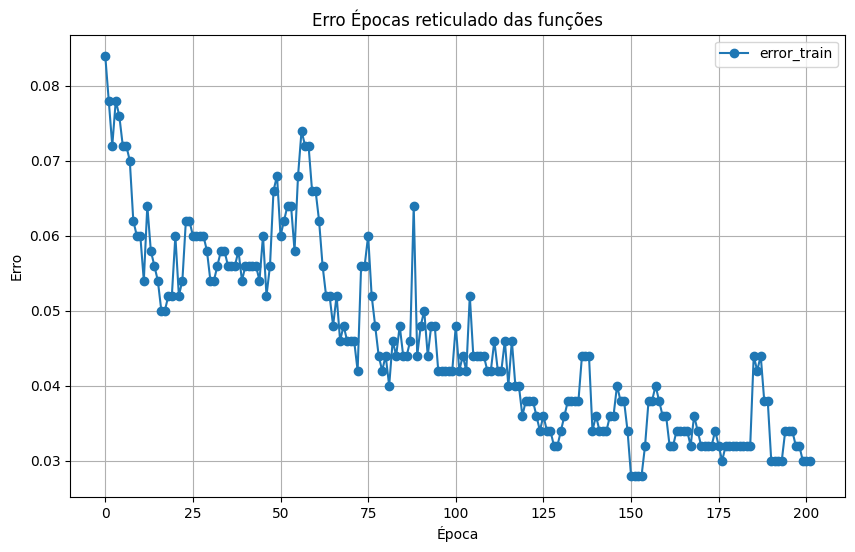

----
Janela 67


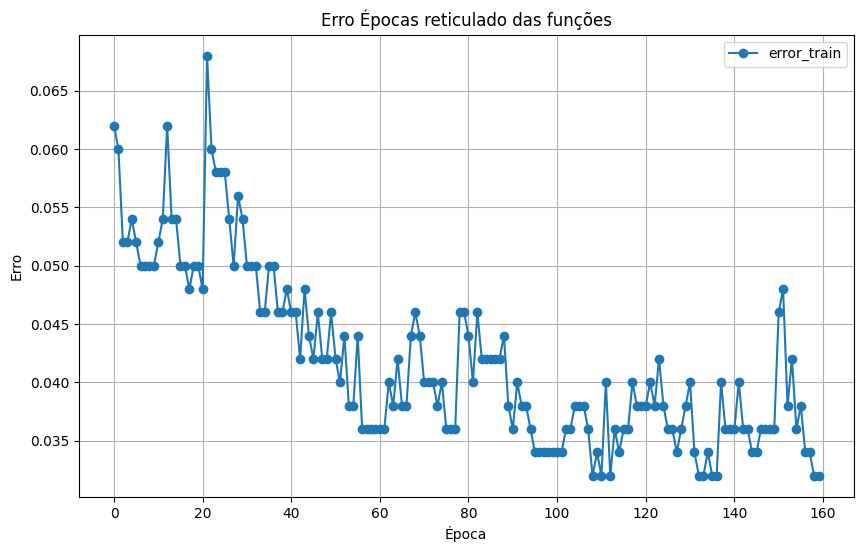

----
Janela 68


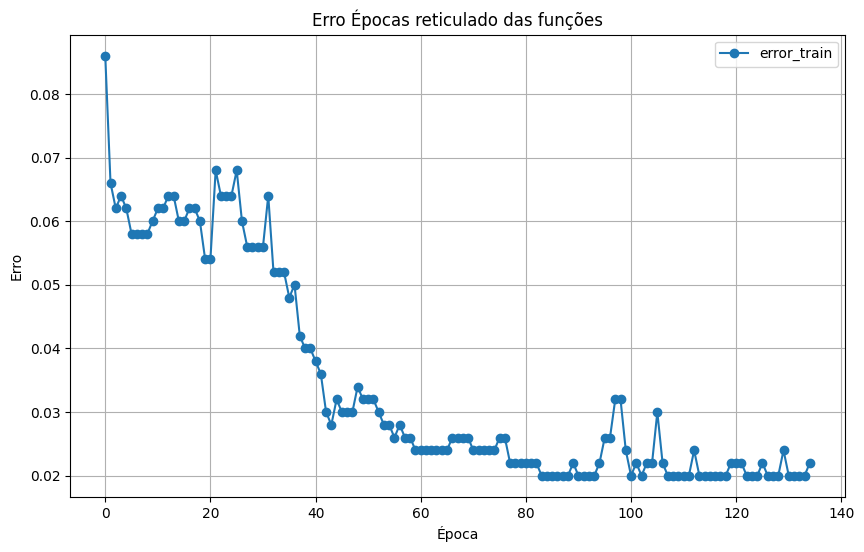

----
Janela 69


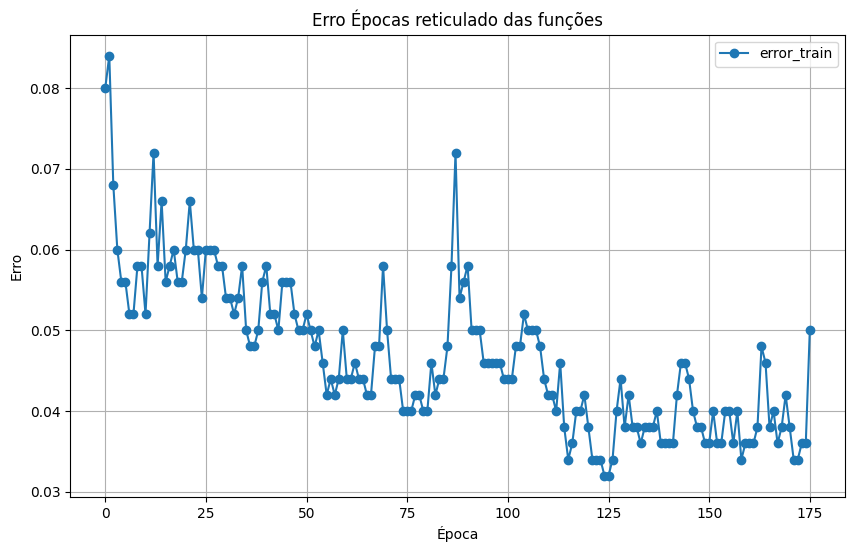

----
Janela 70


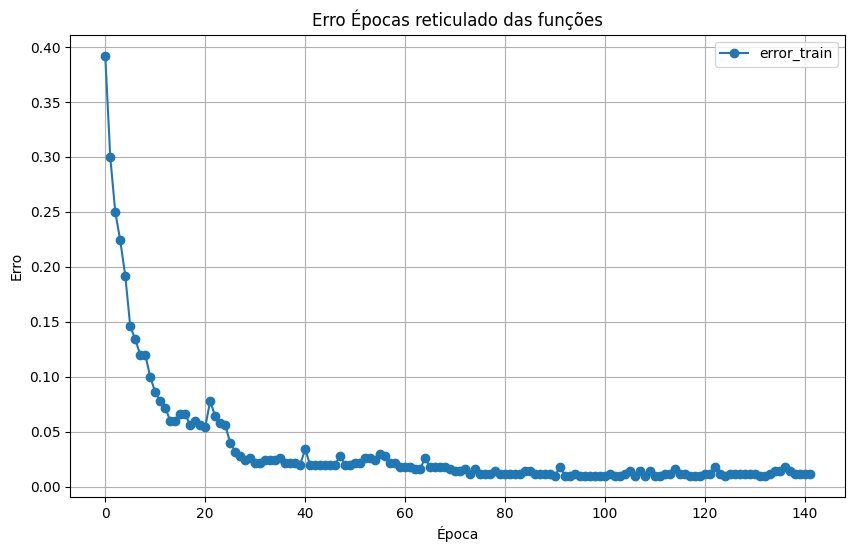

----
Janela 71


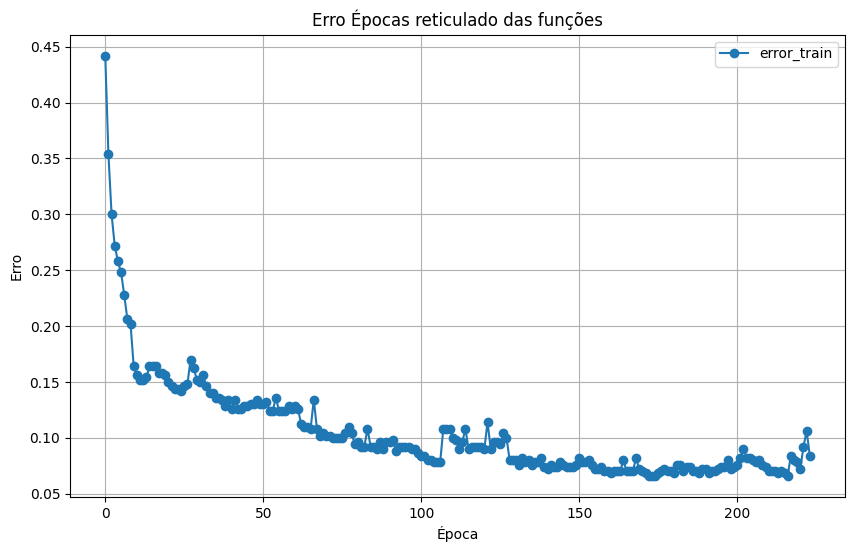

----
Janela 72


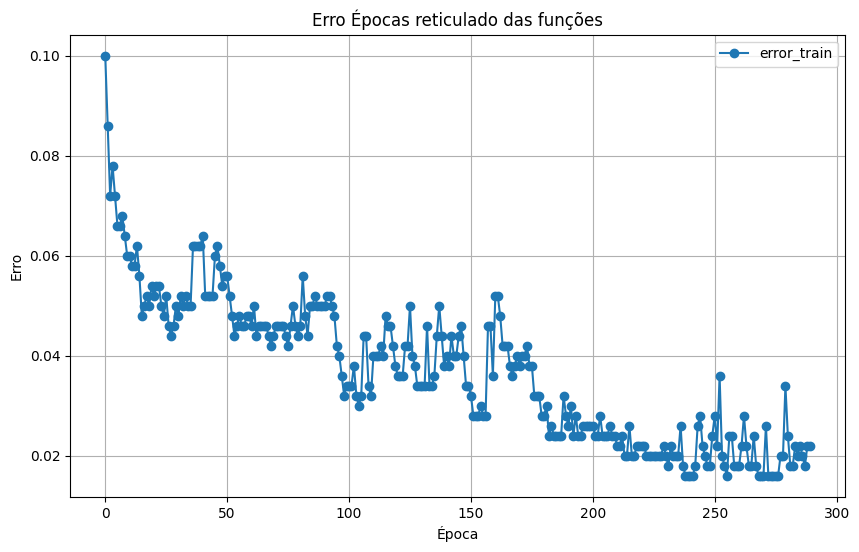

----
Janela 73


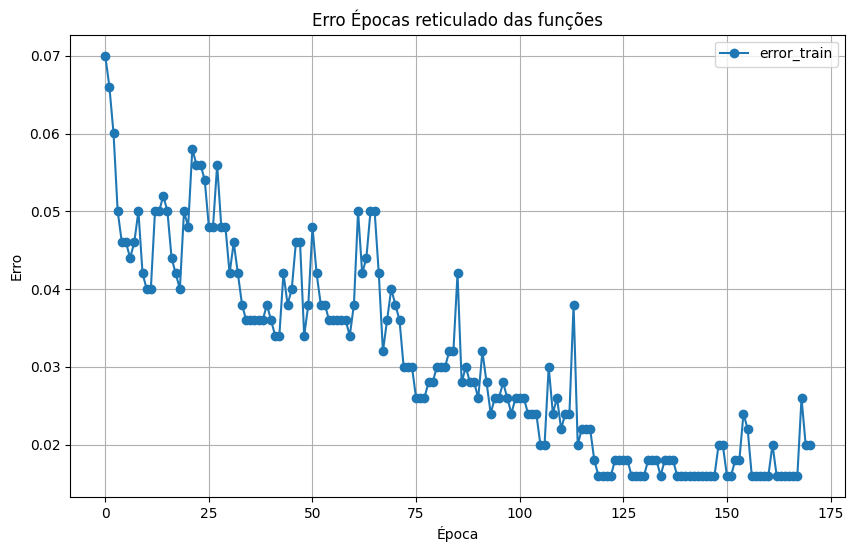

----
Janela 74


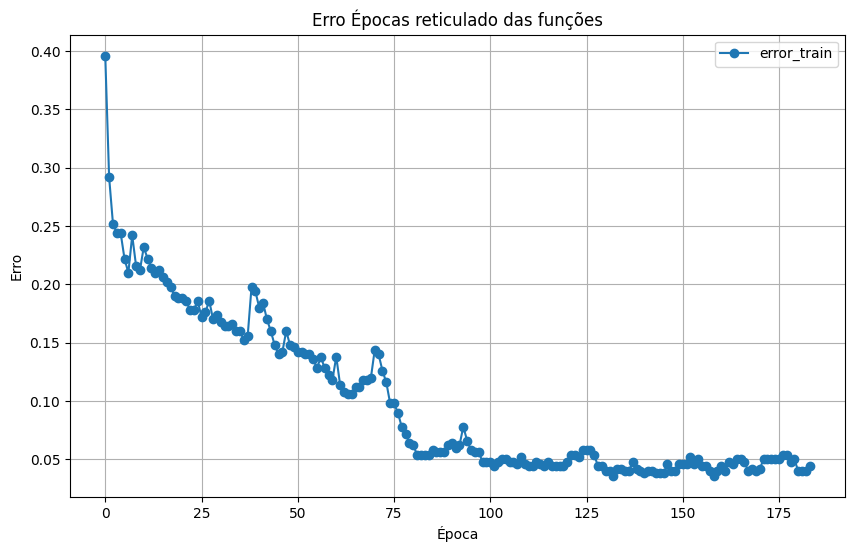

----
Janela 75


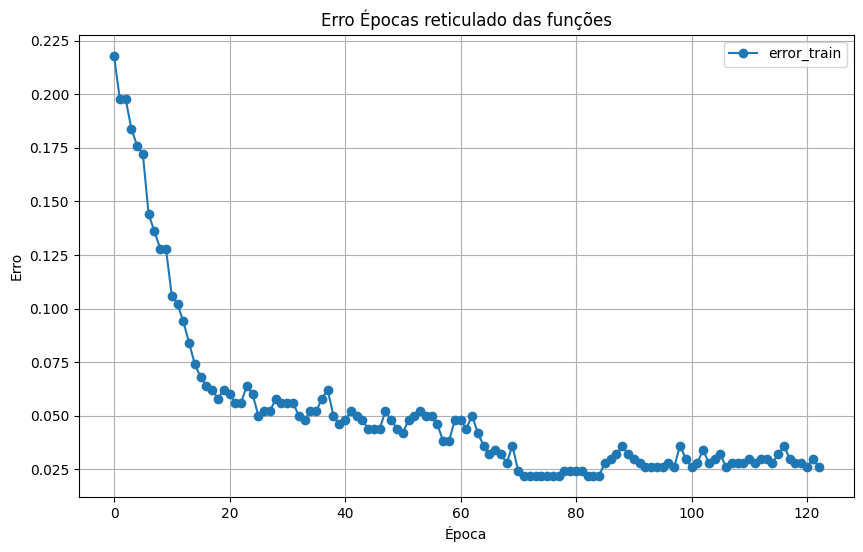

----
Janela 76


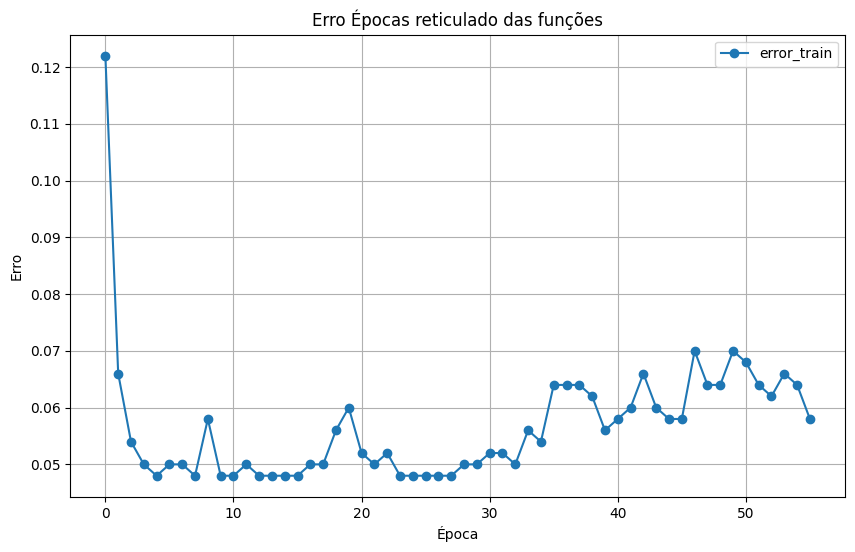

----
Janela 77


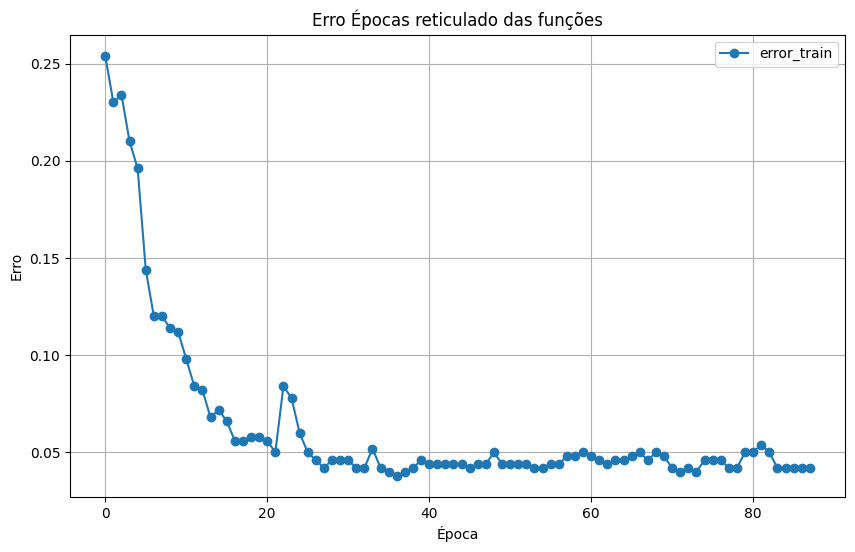

----
Janela 78


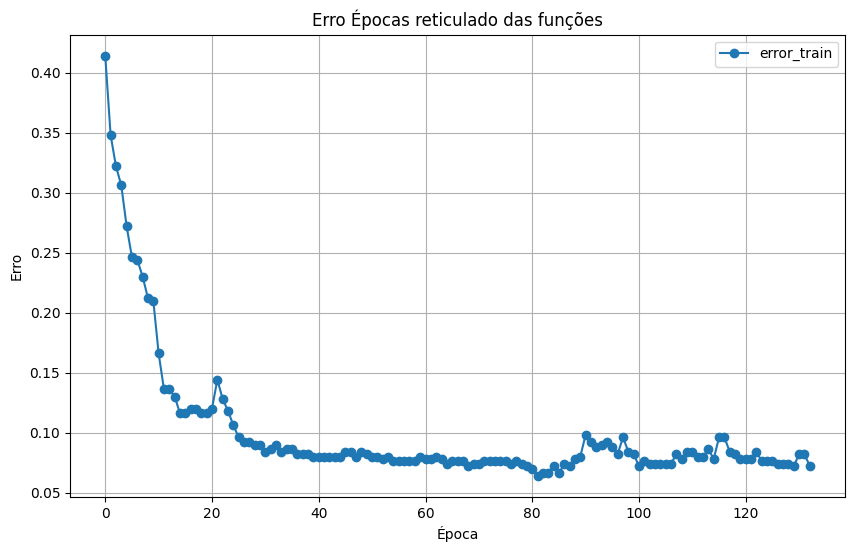

----
Janela 79


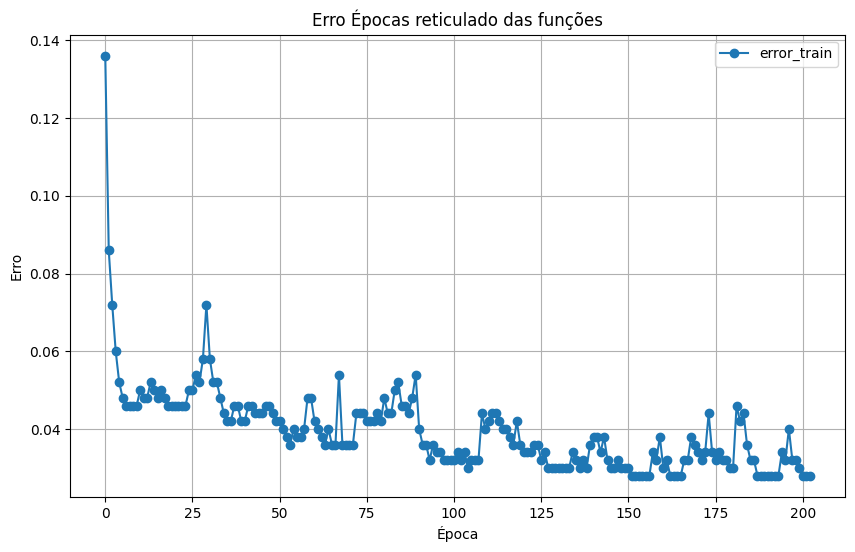

----
Janela 80


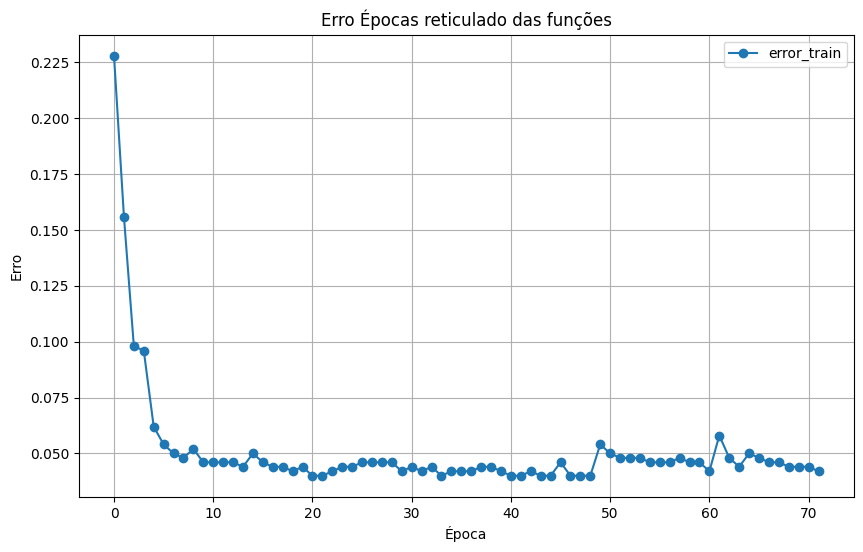

----
Janela 81


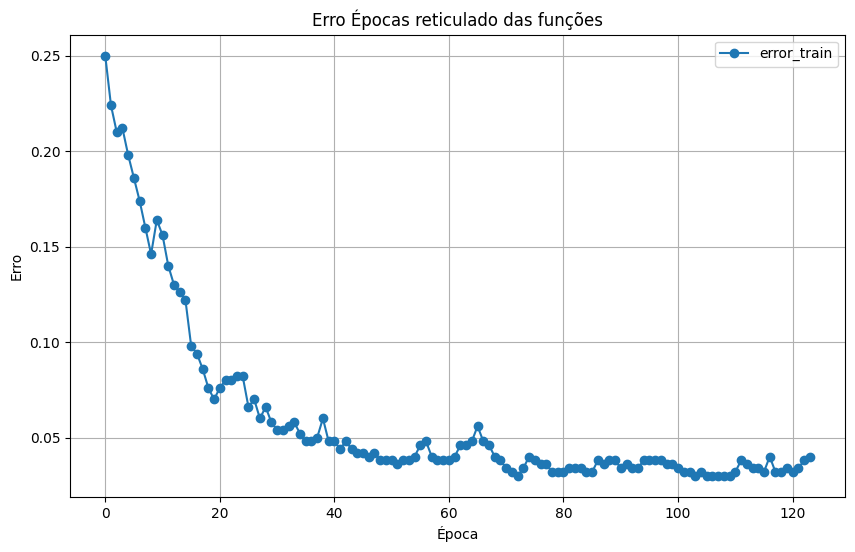

----
Janela 82


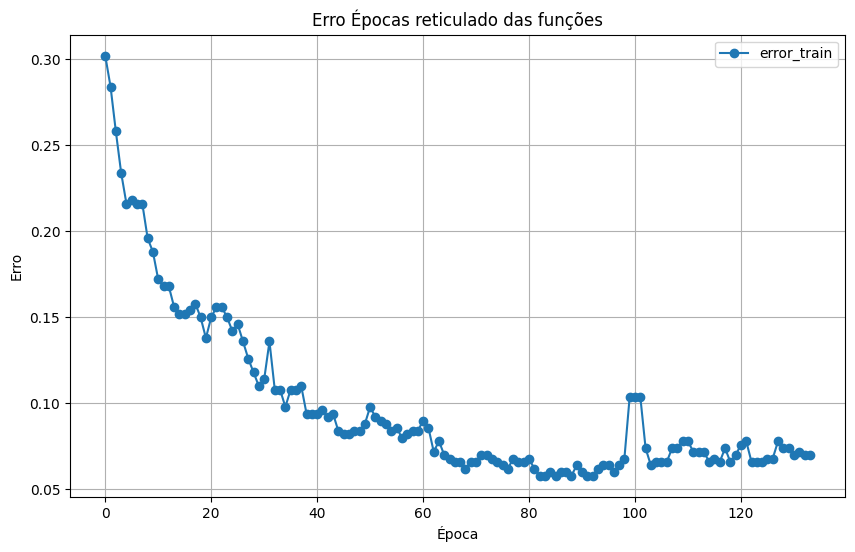

----
Janela 83


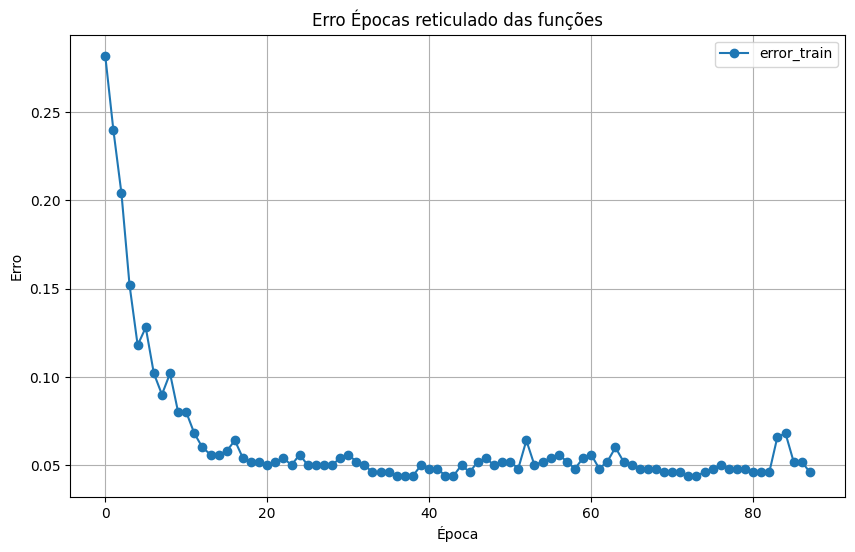

----
Janela 84


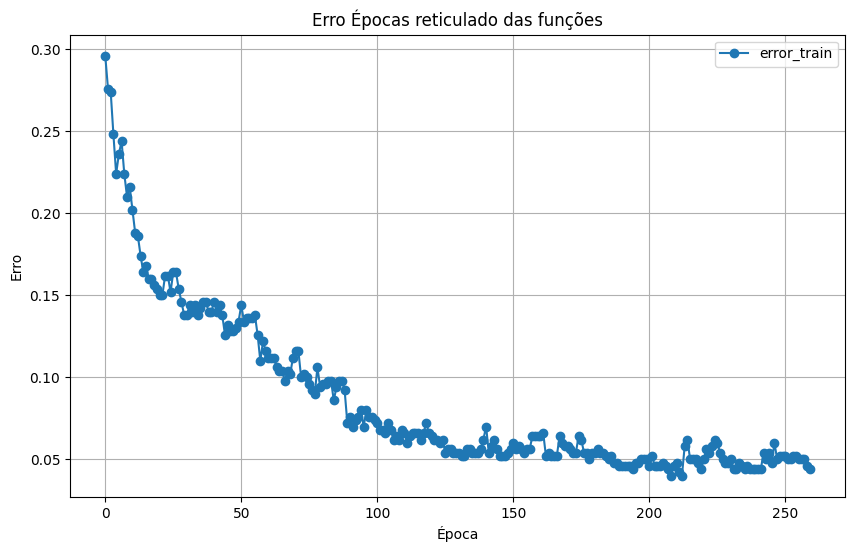

----
Janela 85


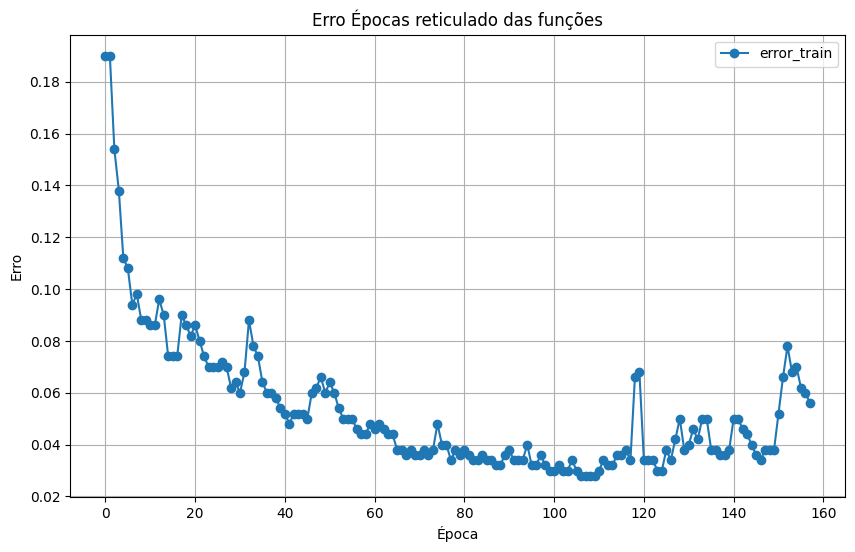

----
Janela 86


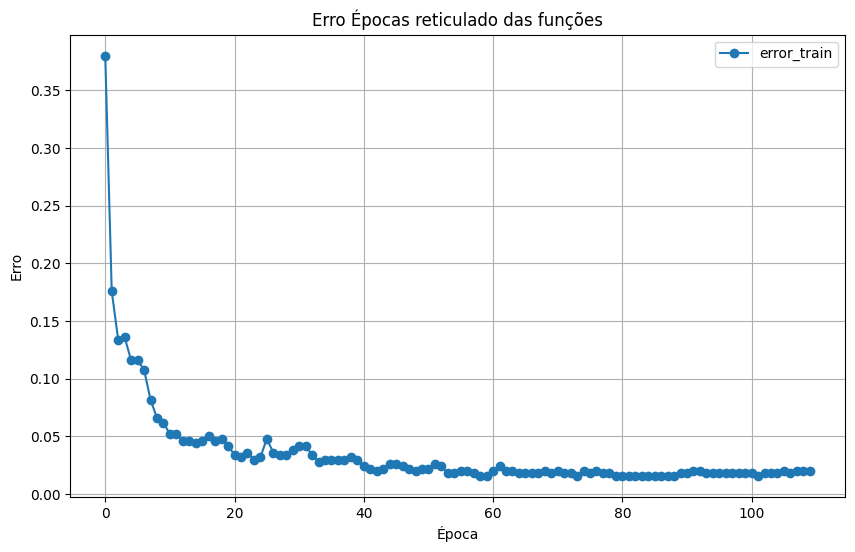

----
Janela 87


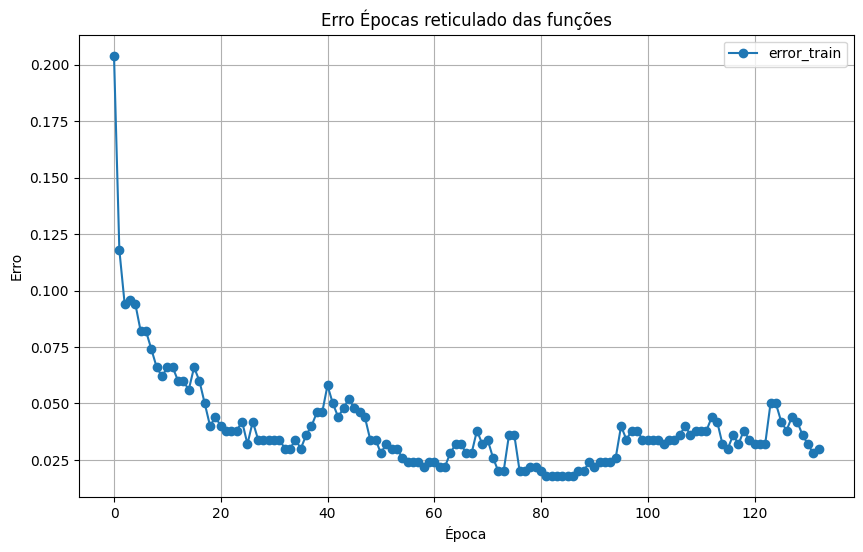

----
Janela 88


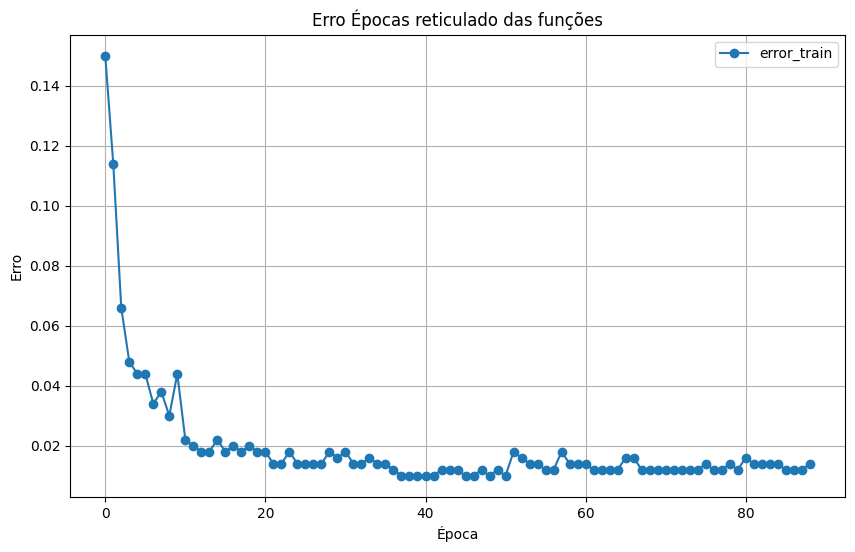

----
Janela 89


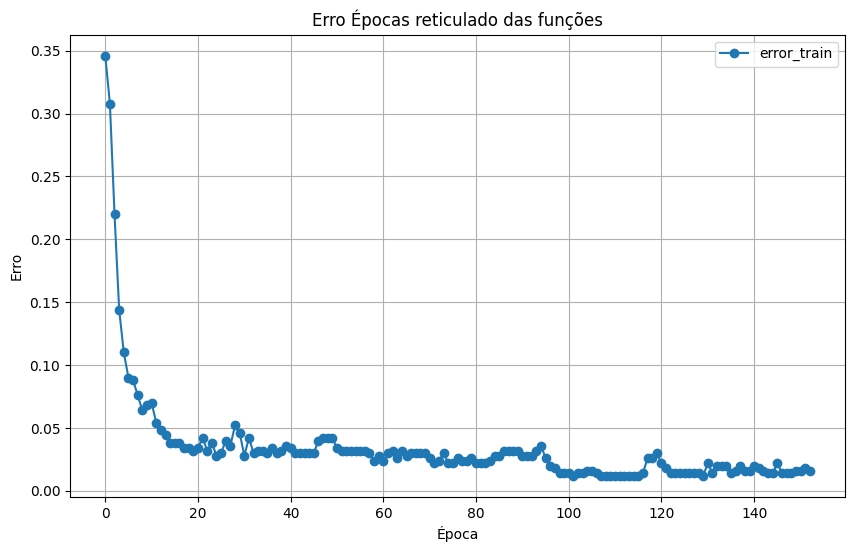

----
Janela 90


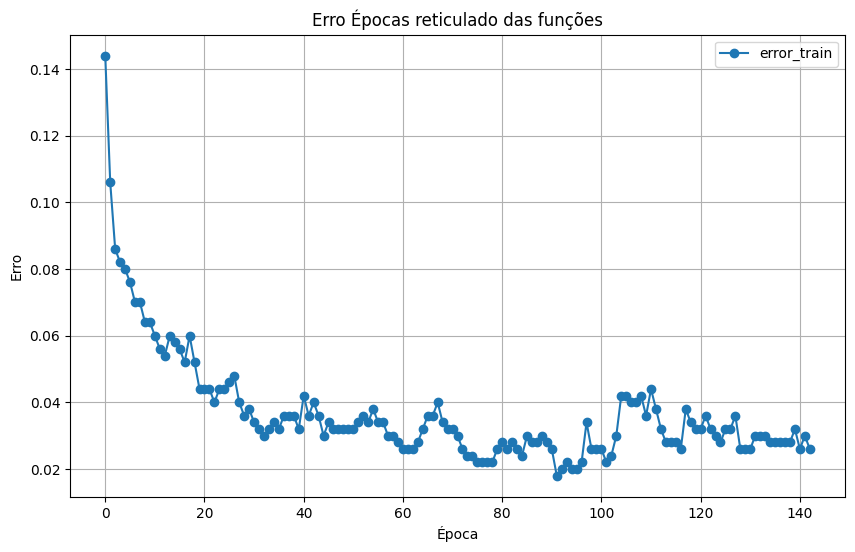

----
Janela 91


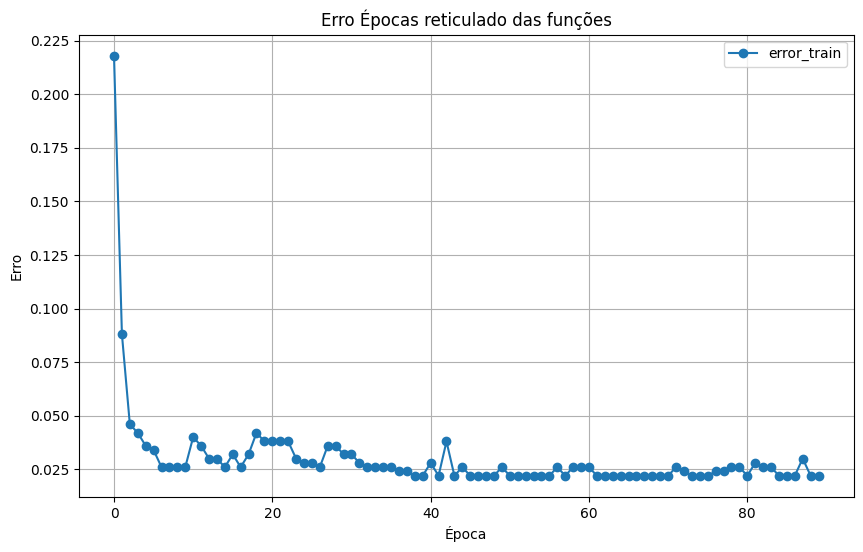

----
Janela 92


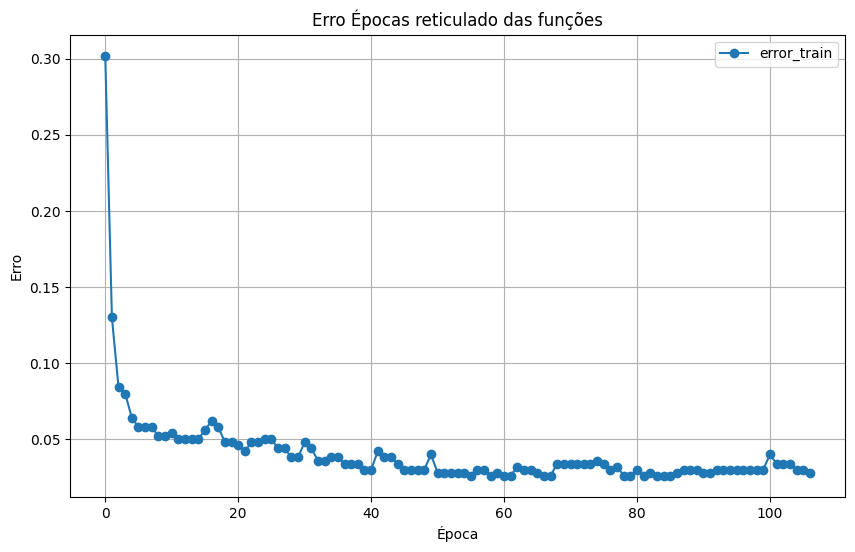

----
Janela 93


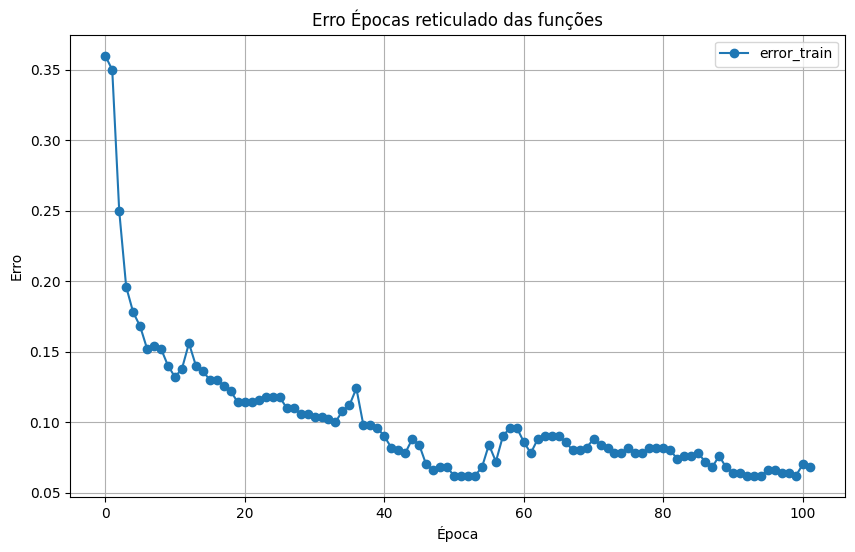

----
Janela 94


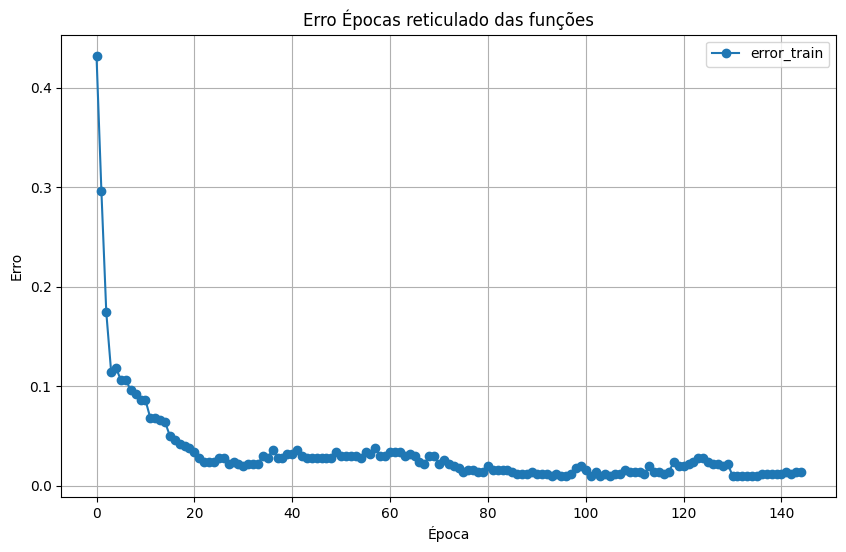

----
Janela 95


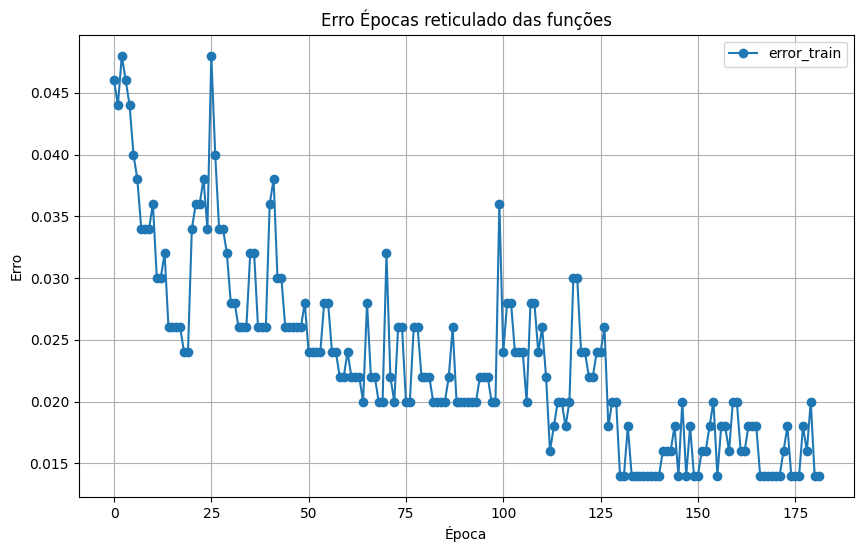

----
Janela 96


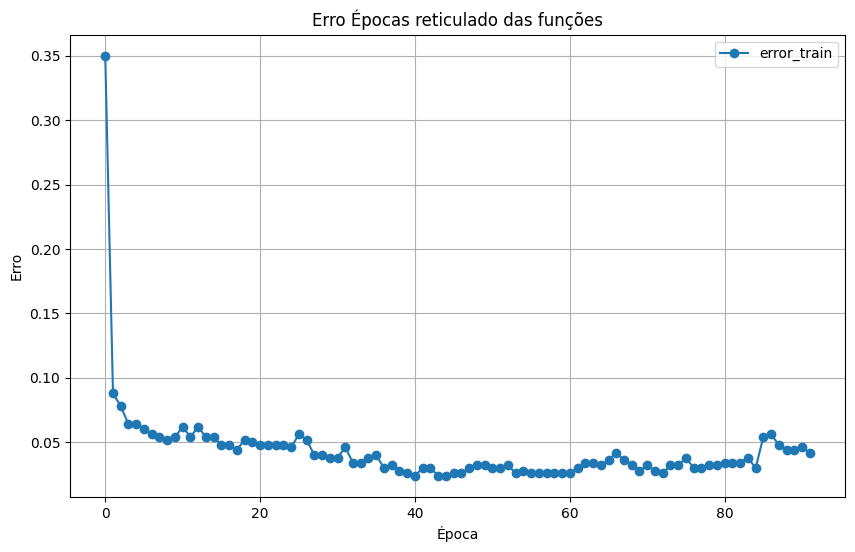

----
Janela 97


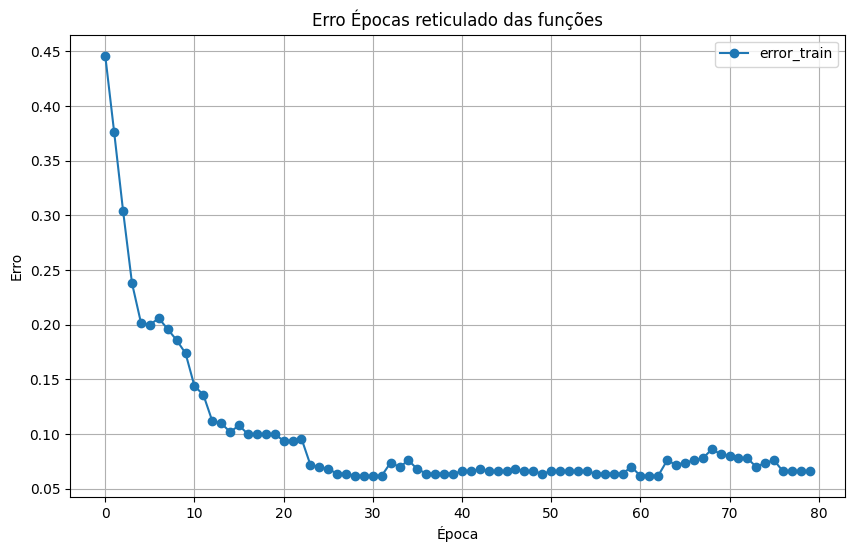

----
Janela 98


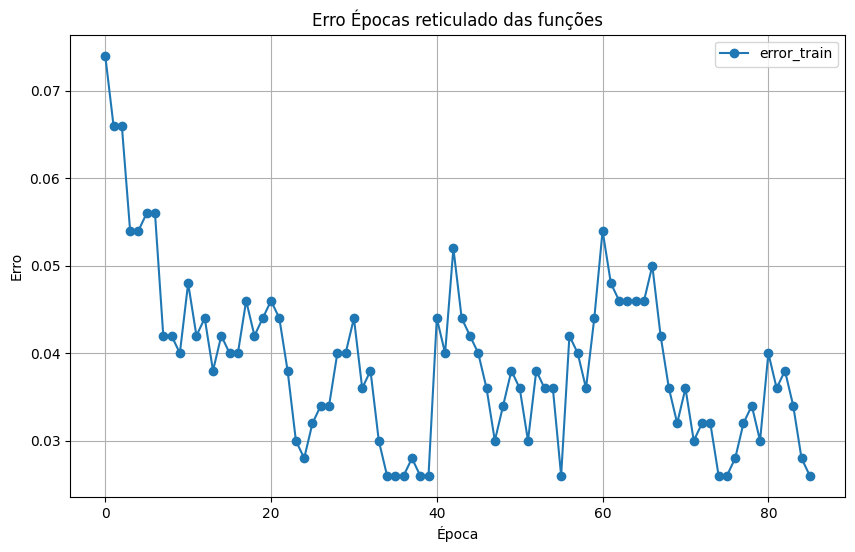

----
Janela 99


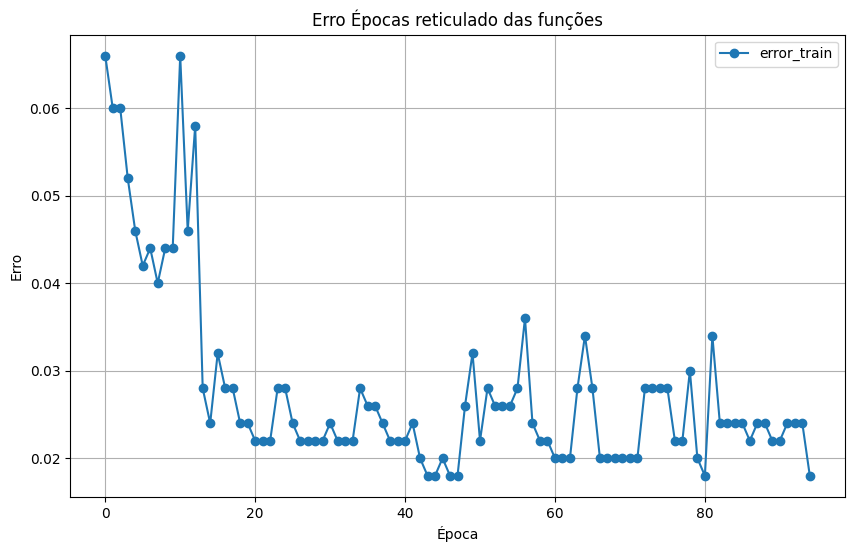

----
Janela 100


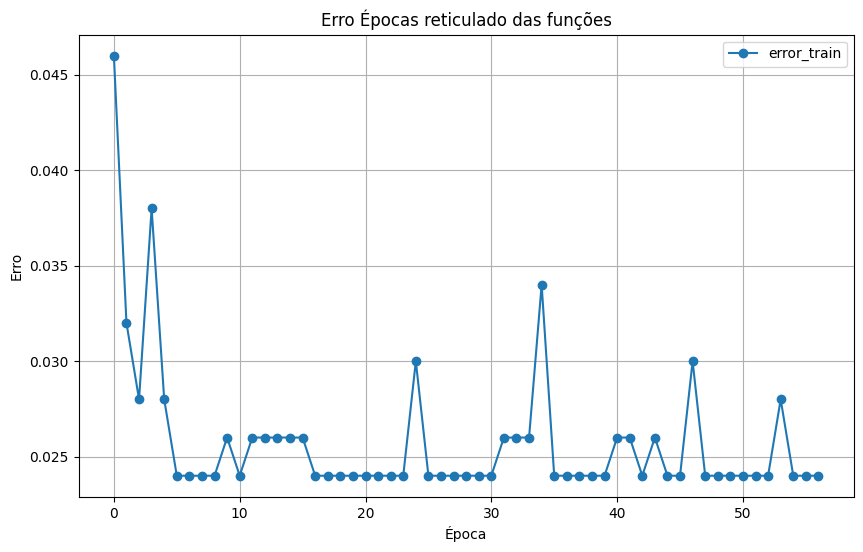

----


In [13]:
for w in df_error_ep_f.W_key.unique()[:100]:
    print(f"Janela {w}")

    coluna_x = 'epoch_f'
    coluna_y = 'error'


    plt.figure(figsize=(10, 6)) 
    plt.plot(df_error_ep_f[df_error_ep_f.W_key==w][coluna_x], df_error_ep_f[df_error_ep_f.W_key==w][coluna_y], label='error_train', marker='o')

    plt.xlabel('Época')
    plt.ylabel('Erro')
    plt.title('Erro Épocas reticulado das funções')

    plt.legend()

    plt.grid(True)  # Adicione grades se desejar
    plt.show()
    print('----')

Análise de Varias Rodadas

In [5]:
import pandas as pd

In [21]:
def print_result(PARAMS_LIST, list):
    base_path = 'output/results/results_run{}_d1.csv'
    base_path_fixed = 'output/results/results_run{}_d1_fixed.csv'
    min_error_test = float('inf')
    min_error_file = None
    min_error_test_fixed = float('inf')
    min_error_file_fixed = None
    
    for ix, i in enumerate(list):
        file_path = base_path.format(i)
        file_path_fixed = base_path_fixed.format(i)
        df = pd.read_csv(file_path)
        df_fixed = pd.read_csv(file_path_fixed)

        params = PARAMS_LIST[ix]
        
        # Carregar os dados do arquivo CSV
        df = pd.read_csv(file_path)


        #min_error_in_file = df['error_val'].min()
        min_error_in_file = df['Test_complet_error'].min()
        min_error_in_file_fixed = df_fixed['Test_complet_error'].min()
    
        # Verificar se este é o menor erro encontrado até agora
        if min_error_in_file < min_error_test:
            min_error_test = min_error_in_file
            min_error_file = file_path
        if min_error_in_file_fixed < min_error_test_fixed:
            min_error_test_fixed = min_error_in_file_fixed
            min_error_file_fixed = file_path_fixed

        # Calcular tempo mínimo e médio
        min_time = df['time'].min()

        # Verificar os dados carregados
        print(f'Dados do arquivo: {file_path}')
        print(params)
        print(f'Erro mínimo: {min_error_in_file}')
        print(f'Erro fixed mínimo: {min_error_in_file_fixed}')
        print(f'Tempo mínimo: {min_time}')
        print('-----------------------------------------')



    print('-----------------------------------------')
    print(f"O menor error_test foi {min_error_test}")
    print(f"Arquivo: {file_path}")
    print(f"O menor error_test - fixed foi {min_error_test_fixed}")
    print(f"Arquivo: {min_error_file_fixed}")

In [22]:
PARAMS_LIST=[  
"--nlayer 7 --wlen 5 --train_size 200 --neighbors_sample_f 12 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 200 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 57", #digito 1 - 30% DE DIG 1
  "--nlayer 7 --wlen 5 --train_size 200 --neighbors_sample_f 8 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 200 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 58", #digito 1 - 30% DE DIG 1
  "--nlayer 7 --wlen 5 --train_size 100 --neighbors_sample_f 12 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 100 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 59", #digito 1 - 30% DE DIG 1
  "--nlayer 7 --wlen 5 --train_size 100 --neighbors_sample_f 8 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 100 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 60", #digito 1 - 30% DE DIG 1
  "--nlayer 7 --wlen 5 --train_size 100 --neighbors_sample_f 10 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 50 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 61", #digito 1 - 30% DE DIG 1
]
list = [57,58,59,60,61]

In [23]:
print_result(PARAMS_LIST, list)

Dados do arquivo: output/results/results_run57_d1.csv
--nlayer 7 --wlen 5 --train_size 200 --neighbors_sample_f 12 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 200 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 57
Erro mínimo: 0.041333333
Erro fixed mínimo: 0.045666665
Tempo mínimo: 359.67080987294514
-----------------------------------------
Dados do arquivo: output/results/results_run58_d1.csv
--nlayer 7 --wlen 5 --train_size 200 --neighbors_sample_f 8 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 200 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 58
Erro mínimo: 0.039333332
Erro fixed mínimo: 0.053999998
Tempo mínimo: 171.4906743168831
-----------------------------------------
Dados do arquivo: output/results/results_run59_d1.csv
--nlayer 7 --wlen 5 --train_size 100 --neighbors_sample_f 12 --neighbors_sample_w 20 --epoch_f 500 --epoch_w 5 --batch 100 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run

# HTML

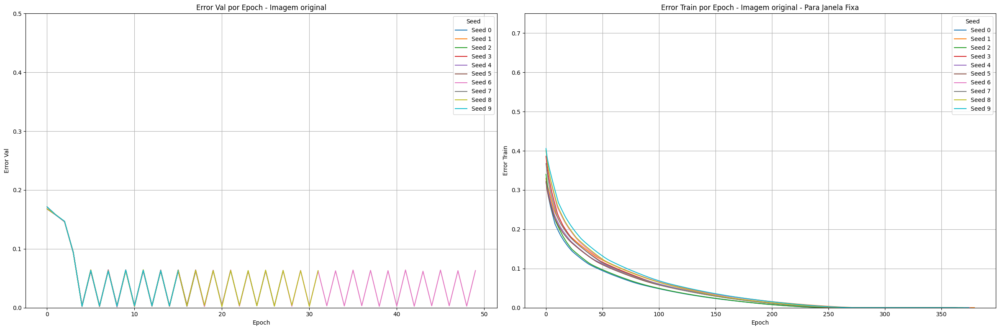

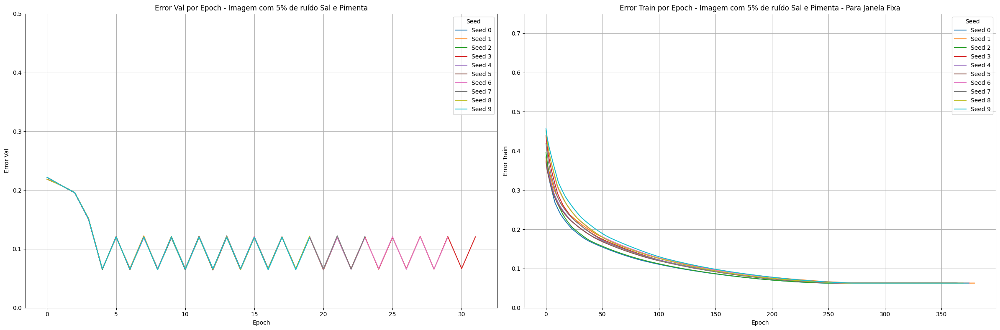

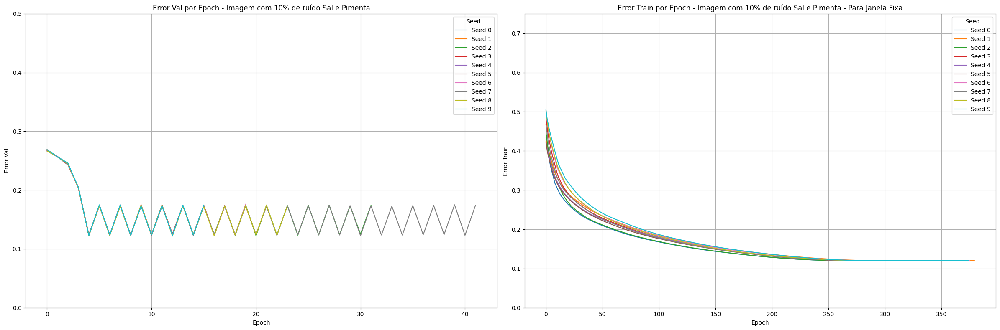

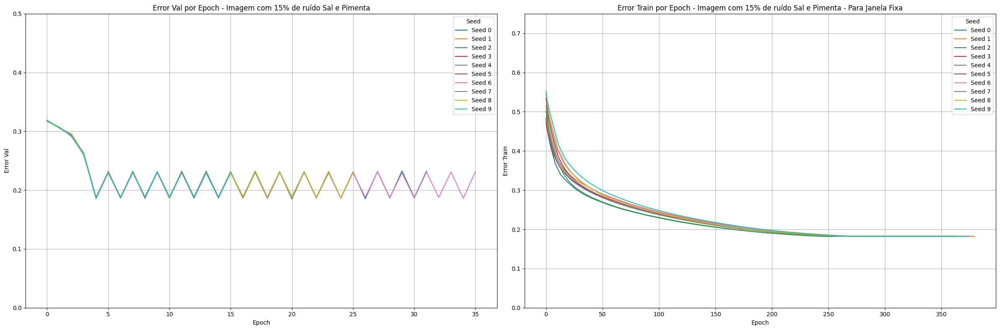

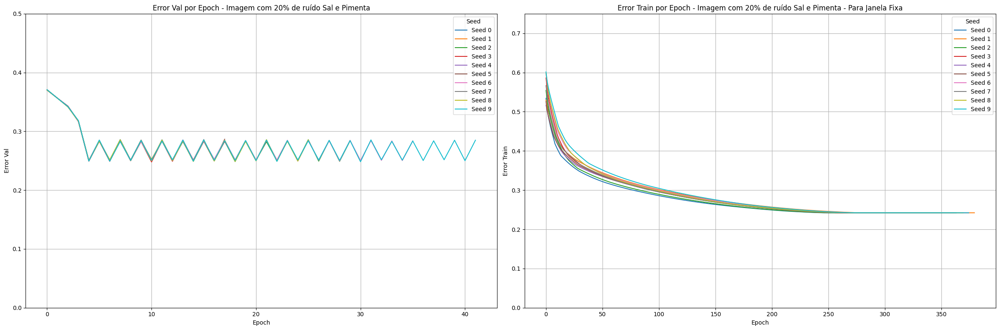

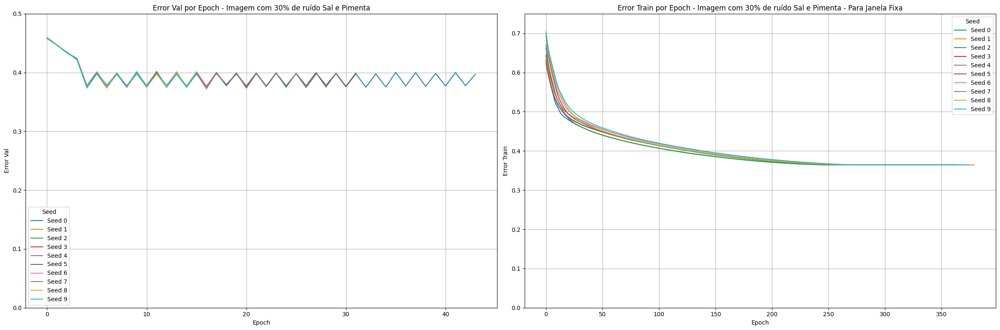

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from jinja2 import Template
import base64
from io import BytesIO

# Função para converter gráfico em imagem base64
def plot_to_base64(fig):
    buf = BytesIO()
    fig.savefig(buf, format="png")
    buf.seek(0)
    return base64.b64encode(buf.read()).decode('utf-8')

report_data = []

for img_type in df.img_type.unique():
    # Aprendizado Janela
    min_time = df[df['img_type']==img_type]['time'].min()
    avg_time = df[df['img_type']==img_type]['time'].mean()
    min_error_val = df[df['img_type']==img_type]['error_val'].min()

    qtd_zeros_diff_w = int((df[df['img_type']==img_type]['seed'].max()+1)*(df[df['img_type']==img_type]['diff_w'] != 0).mean())
    qtd_zeros_diff_joint = int((df[df['img_type']==img_type]['seed'].max()+1)*(df[df['img_type']==img_type]['diff_joint'] != 0).mean())
    avg_diff_joint = df[df['img_type']==img_type]['diff_joint'].mean()
    
    avg_error_gol_final = df[df['img_type']==img_type]['total_error_gol_final'].mean()
    avg_error_gosper_glider = df[df['img_type']==img_type]['total_error_gosper_glider'].mean()
    
    # Fixed:
    min_time_fixed = df_fixed[df_fixed['img_type']==img_type]['time'].min()
    avg_time_fixed = df_fixed[df_fixed['img_type']==img_type]['time'].mean()
    min_error_val_fixed = df_fixed[df_fixed['img_type']==img_type]['error_val'].min()

    qtd_zeros_diff_joint_fixed = int((df[df['img_type']==img_type]['seed'].max()+1)*(df_fixed[df_fixed['img_type']==img_type]['diff_joint'] != 0).mean())
    avg_diff_joint_fixed = df_fixed[df_fixed['img_type']==img_type]['diff_joint'].mean()
    
    avg_error_gol_final_fixed = df_fixed[df_fixed['img_type']==img_type]['total_error_gol_final'].mean()
    avg_error_gosper_glider_fixed = df_fixed[df_fixed['img_type']==img_type]['total_error_gosper_glider'].mean()
    
    # Adicionar dados ao relatório
    report_data.append({
        'image_description': image_descriptions[img_type],
        'min_error_val': f'{min_error_val:.4f}',
        'min_time': f'{min_time:.4f}',
        'avg_time': f'{avg_time:.4f}',
        'qtd_zeros_diff_w': qtd_zeros_diff_w,
        'qtd_zeros_diff_joint': qtd_zeros_diff_joint,
        'avg_diff_joint': f'{avg_diff_joint:.1f}',
        'avg_error_gol_final': f'{avg_error_gol_final:.4f}',
        'avg_error_gosper_glider': f'{avg_error_gosper_glider:.4f}',
        'min_error_val_fixed': f'{min_error_val_fixed:.4f}',
        'min_time_fixed': f'{min_time_fixed:.4f}',
        'avg_time_fixed': f'{avg_time_fixed:.4f}',
        'qtd_zeros_diff_joint_fixed': qtd_zeros_diff_joint_fixed,
        'avg_diff_joint_fixed': f'{avg_diff_joint_fixed:.1f}',
        'avg_error_gol_final_fixed': f'{avg_error_gol_final_fixed:.4f}',
        'avg_error_gosper_glider_fixed': f'{avg_error_gosper_glider_fixed:.4f}',
    })

    # Plotar os dados
    fig, axes = plt.subplots(1, 2, figsize=(24, 8))
    
    # Gráfico de error_train
    for seed in df[df['img_type']==img_type]['seed'].unique():
        seed_data = df[(df['img_type']==img_type)&(df['seed'] == seed)]
        axes[0].plot(seed_data['epoch'], seed_data['error_val'], label=f'Seed {seed}')

    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Error Val')
    axes[0].set_ylim(0, 0.5)
    axes[0].set_title(f'Error Val por Epoch - {image_descriptions[img_type]}')
    axes[0].legend(title='Seed')
    axes[0].grid(True)
    
    # Gráfico de error_val
    for seed in df_fixed[df_fixed['img_type']==img_type]['seed'].unique():
        seed_data = df_fixed[(df_fixed['img_type']==img_type)&(df_fixed['seed'] == seed)]
        axes[1].plot(seed_data['epoch'], seed_data['error'], label=f'Seed {seed}')

    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Error Train')
    axes[1].set_ylim(0, 0.75)
    axes[1].set_title(f'Error Train por Epoch - {image_descriptions[img_type]} - Para Janela Fixa')
    axes[1].legend(title='Seed')
    axes[1].grid(True)

    plt.tight_layout()
    fig_base64 = plot_to_base64(fig)
    report_data[-1]['plot'] = fig_base64

# Template HTML
template_html = """
<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <title>Report GoL</title>
    <style>
        .report-section {
            display: flex;
            justify-content: center;
            align-items: center;
            text-align: center;
        }
        .column {
            flex: 50%;
            padding: 10px;
        }
        img {
            display: block;
            margin-left: auto;
            margin-right: auto;
        }
    </style>
</head>
<body>
    <h1>Relatório GoL</h1>
    {% for data in report_data %}
    <h2>{{ data.image_description }}</h2>
    <div class="report-section">
        <div class="column">
            <p><strong>Aprendizado da Janela</strong></p>
            <p>Erro-val mínimo p/ aprender a Janela: {{ data.min_error_val }}</p>
            <p>Tempo mínimo p/ aprender a Janela: {{ data.min_time }}</p>
            <p>Tempo médio p/ aprender a Janela: {{ data.avg_time }}</p>
            <p>Quantidade de vezes que aprendemos a janela ideal: {{ data.qtd_zeros_diff_w }}</p>
            <p>Quantidade de vezes que não aprendemos a joint ideal: {{ data.qtd_zeros_diff_joint }}</p>
            <p>Quantidade de bits médios diferentes da joint ideal: {{ data.avg_diff_joint }}</p>
            <p>Erro médio no dataset Total - GoL_final: {{ data.avg_error_gol_final }}</p>
            <p>Erro médio no dataset Total - Gosper Glider: {{ data.avg_error_gosper_glider }}</p>
        </div>
        <div class="column">
            <p><strong>Aprendizado Função com Janela Fixa</strong></p>
            <p>Erro-val mínimo p/ aprender a Função: {{ data.min_error_val_fixed }}</p>
            <p>Tempo mínimo p/ aprender a Função: {{ data.min_time_fixed }}</p>
            <p>Tempo médio p/ aprender a Função: {{ data.avg_time_fixed }}</p>
            <p>Quantidade de vezes que não aprendemos a joint ideal: {{ data.qtd_zeros_diff_joint_fixed }}</p>
            <p>Quantidade de bits médios diferentes da joint ideal: {{ data.avg_diff_joint_fixed }}</p>
            <p>Erro médio no dataset Total - GoL_final: {{ data.avg_error_gol_final_fixed }}</p>
            <p>Erro médio no dataset Total - Gosper Glider: {{ data.avg_error_gosper_glider_fixed }}</p>
        </div>
    </div>
    <div class="report-section">
        <img src="data:image/png;base64,{{ data.plot }}" alt="Plot">
    </div>
    <hr>
    {% endfor %}
</body>
</html>
"""

template = Template(template_html)
html_content = template.render(report_data=report_data)

with open('report_GoL.html', 'w') as f:
    f.write(html_content)


In [105]:
import pandas as pd
import matplotlib.pyplot as plt
from io import BytesIO
import base64

def print_result_html(PARAMS_LIST, list):
    base_path = 'output/results/results_run{}.csv'
    min_error_val = float('inf')
    min_error_details = {'file': None, 'seed': None, 'epoch': None}
    report_content = []

    for i in list:
        if i != 5:
            file_path = base_path.format(i)
            params = PARAMS_LIST[i - 1]
            
            # Carregar os dados do arquivo CSV
            df = pd.read_csv(file_path)

            min_error_in_file = df['error_val'].min()
        
            # Verificar se este é o menor erro encontrado até agora
            if min_error_in_file < min_error_val:
                min_error_val = min_error_in_file
                min_error_row = df[df['error_val'] == min_error_in_file].iloc[0]
                min_error_details['file'] = file_path
                min_error_details['seed'] = min_error_row['seed']
                min_error_details['epoch'] = min_error_row['epoch']

            # Calcular tempo mínimo e médio
            min_time = df['time'].min()
            avg_time = df['time'].mean()

            # Adicionar o texto ao conteúdo do relatório
            text = (
                f'<h2>Dados do arquivo: {file_path}</h2>'
                f'<p>Parâmetros: {params}</p>'
                f'<p>Erro mínimo: {min_error_in_file}</p>'
                f'<p>Tempo mínimo: {min_time}</p>'
                f'<p>Tempo médio: {avg_time}</p>'
            )
            report_content.append(text)

            # Plotar os dados
            fig, axes = plt.subplots(1, 3, figsize=(24, 6))
            
            # Gráfico de error_train
            for seed in df['seed'].unique():
                seed_data = df[df['seed'] == seed]
                axes[0].plot(seed_data['epoch'], seed_data['error_train'], label=f'Seed {seed}')

            axes[0].set_xlabel('Epoch')
            axes[0].set_ylabel('Error Train')
            axes[0].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_train
            axes[0].set_title(f'Error Train por Epoch - {file_path}')
            axes[0].legend(title='Seed')
            axes[0].grid(True)
            
            # Gráfico de error_val
            for seed in df['seed'].unique():
                seed_data = df[df['seed'] == seed]
                axes[1].plot(seed_data['epoch'], seed_data['error_val'], label=f'Seed {seed}')

            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('Error Val')
            axes[1].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_val
            axes[1].set_title(f'Error Val por Epoch - {file_path}')
            axes[1].legend(title='Seed')
            axes[1].grid(True)

            # Gráfico de tempo médio de execução por seed
            avg_time_by_seed = df.groupby('seed')['time'].mean()
            axes[2].plot(avg_time_by_seed.index, avg_time_by_seed.values, marker='o')
            axes[2].set_xlabel('Seed')
            axes[2].set_ylabel('Average Time (s)')
            axes[2].set_title(f'Average Execution Time by Seed - {file_path}')
            axes[2].grid(True)

            plt.tight_layout()
            
            # Salvar o gráfico em um buffer de bytes
            buf = BytesIO()
            plt.savefig(buf, format='png')
            plt.close(fig)
            buf.seek(0)

            # Converter a imagem para base64
            img_base64 = base64.b64encode(buf.getvalue()).decode('utf-8')
            img_html = f'<img src="data:image/png;base64,{img_base64}"/>'
            report_content.append(img_html)

    # Adicionar o menor erro ao relatório
    summary_text = (
        f"<h2>Resumo</h2>"
        f"<p>O menor error_val foi {min_error_val}</p>"
        f"<p>Arquivo: {min_error_details['file']}</p>"
        f"<p>Seed: {min_error_details['seed']}</p>"
        f"<p>Epoch: {min_error_details['epoch']}</p>"
    )
    report_content.append(summary_text)

    # Gerar o arquivo HTML
    with open("report.html", "w") as f:
        f.write("<html><head><title>Relatório de Resultados</title></head><body>")
        f.write("".join(report_content))
        f.write("</body></html>")

# Chamar a função com a lista de 1 a 29
#PARAMS_LIST = [...]  # Lista com os parâmetros para cada arquivo
print_result_html(PARAMS_LIST, list_run)


Dados do arquivo: output/results/results_run20.csv
--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 20
Erro mínimo: 0.019847555
Tempo mínimo: 23.945242178440093
Tempo médio: 42.02357973580174


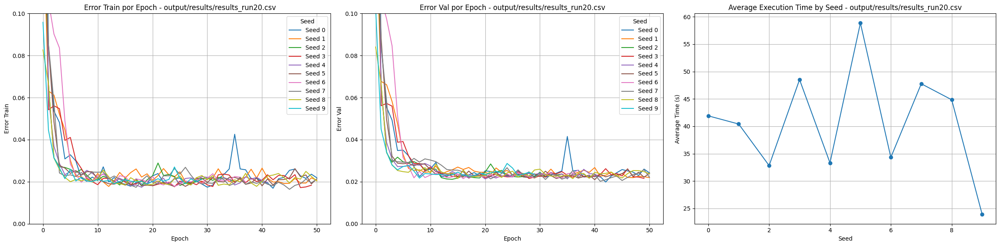

Dados do arquivo: output/results/results_run21.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 21
Erro mínimo: 0.018550396
Tempo mínimo: 13.705568893750508
Tempo médio: 26.4080170117423


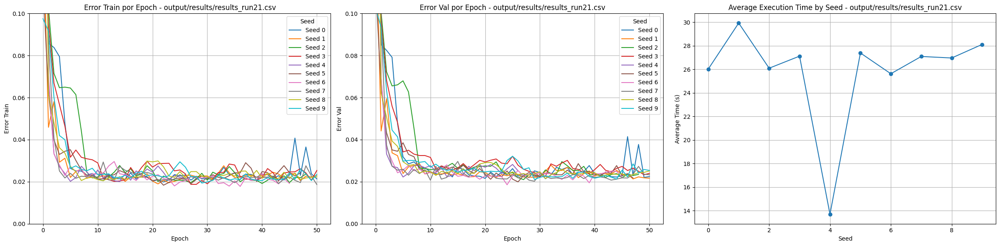

Dados do arquivo: output/results/results_run22.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 15 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 22
Erro mínimo: 0.019776309
Tempo mínimo: 20.658206137021384
Tempo médio: 27.89734351625559


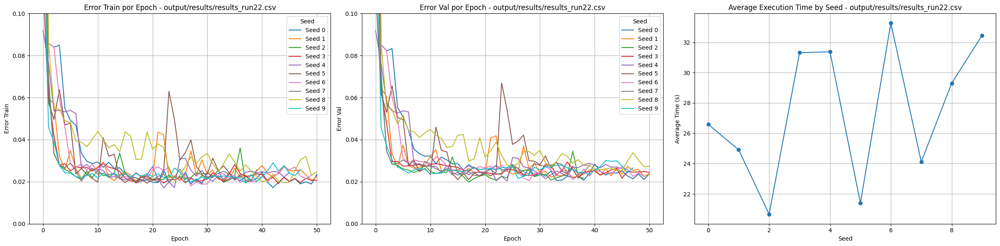

Dados do arquivo: output/results/results_run23.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 7 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 23
Erro mínimo: 0.020792818
Tempo mínimo: 17.450266977151234
Tempo médio: 30.48031392875498


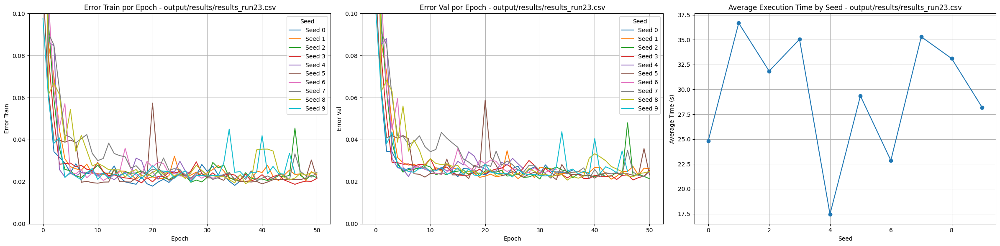

Dados do arquivo: output/results/results_run24.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 24
Erro mínimo: 0.02064447
Tempo mínimo: 16.357715817292533
Tempo médio: 25.37376642689926


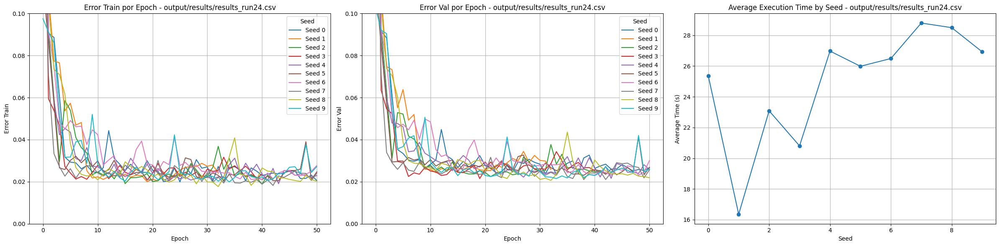

Dados do arquivo: output/results/results_run25.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 12 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 25
Erro mínimo: 0.018550396
Tempo mínimo: 20.48831516901652
Tempo médio: 36.12367261761359


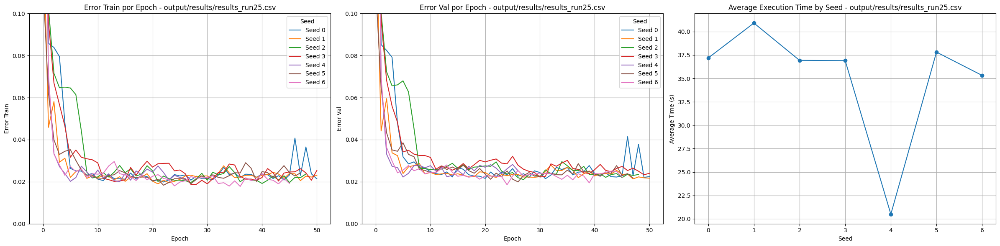

Dados do arquivo: output/results/results_run26.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 14 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 26
Erro mínimo: 0.018550396
Tempo mínimo: 25.057157480716704
Tempo médio: 43.93025022428964


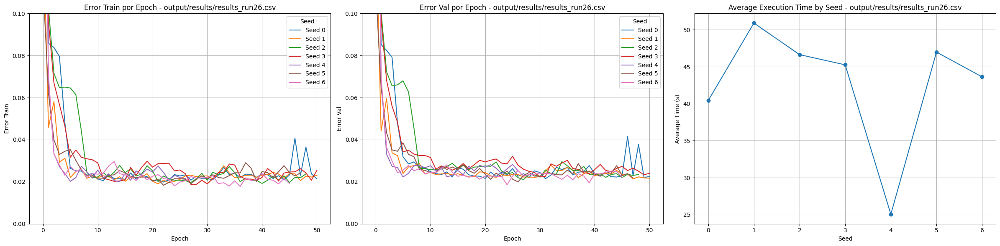

O menor error_val foi 0.018550396
Arquivo: output/results/results_run21.csv
Seed: 6
Epoch: 24


In [6]:
print_result(PARAMS_LIST, [20,21,22,23,24,25,26])

In [2]:
file_path = 'output/results/results_run1.csv'
df = pd.read_csv(file_path)

In [3]:
df.head()

,epoch,error_train,error_val,seed,path_results,time
0,0,0.300477,0.305527,0,results_run1_V0,6.419814
1,1,0.056993,0.063414,0,results_run1_V0,6.419814
2,2,0.037490,0.045857,0,results_run1_V0,6.419814
3,3,0.037861,0.040285,0,results_run1_V0,6.419814
4,4,0.034821,0.044171,0,results_run1_V0,6.419814


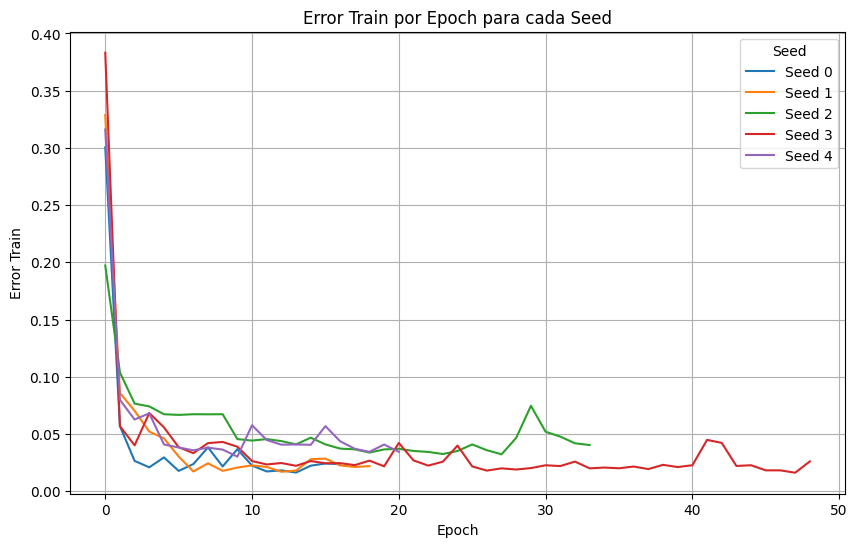

In [5]:

file_path = 'output/results/results_run1.csv'
df = pd.read_csv(file_path)

# Plotar os dados
plt.figure(figsize=(10, 6))

# Iterar sobre cada seed e plotar as linhas
for seed in df['seed'].unique():
    seed_data = df[df['seed'] == seed]
    plt.plot(seed_data['epoch'], seed_data['error_train'], label=f'Seed {seed}')

plt.xlabel('Epoch')
plt.ylabel('Error Train')
plt.title('Error Train por Epoch para cada Seed')
plt.legend(title='Seed')
plt.grid(True)
plt.show()


Dados do arquivo: output/results/results_run1.csv


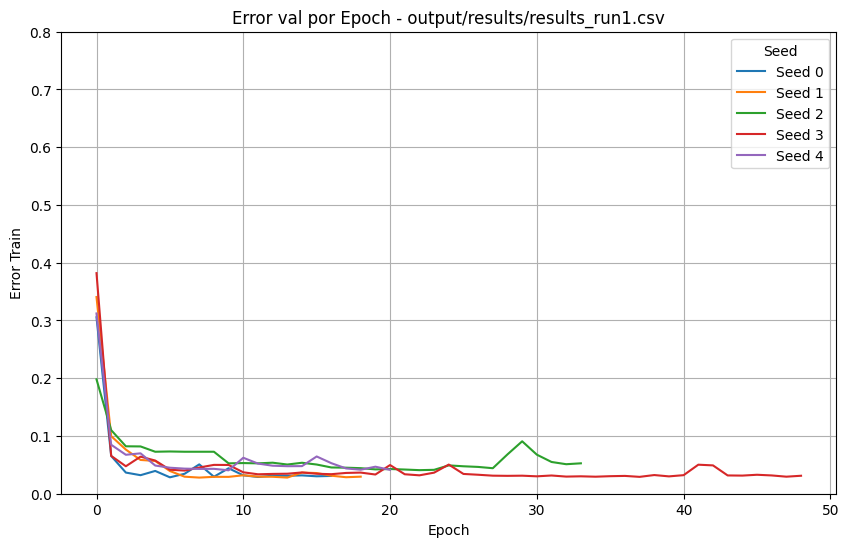

Dados do arquivo: output/results/results_run2.csv


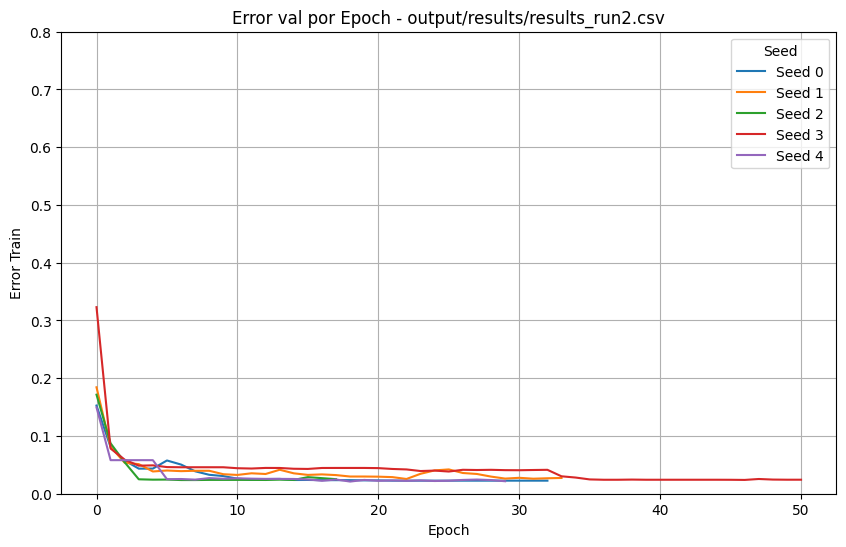

Dados do arquivo: output/results/results_run3.csv


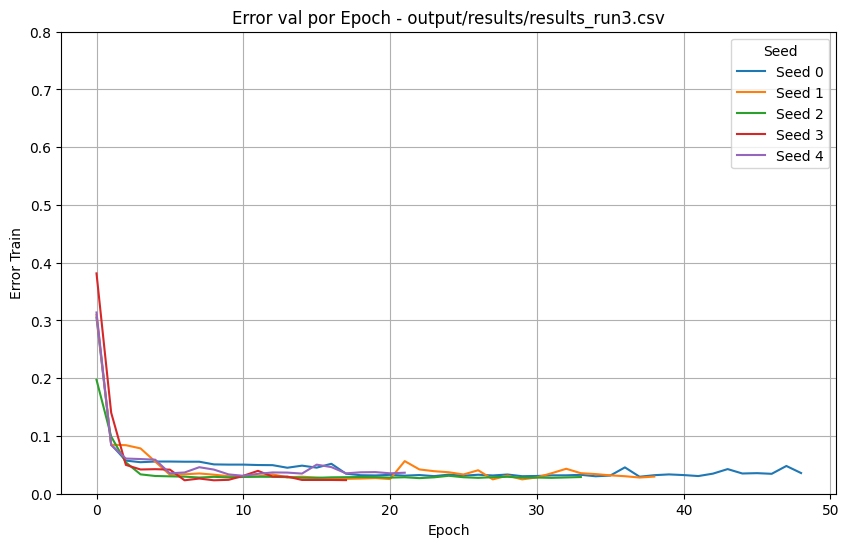

Dados do arquivo: output/results/results_run4.csv


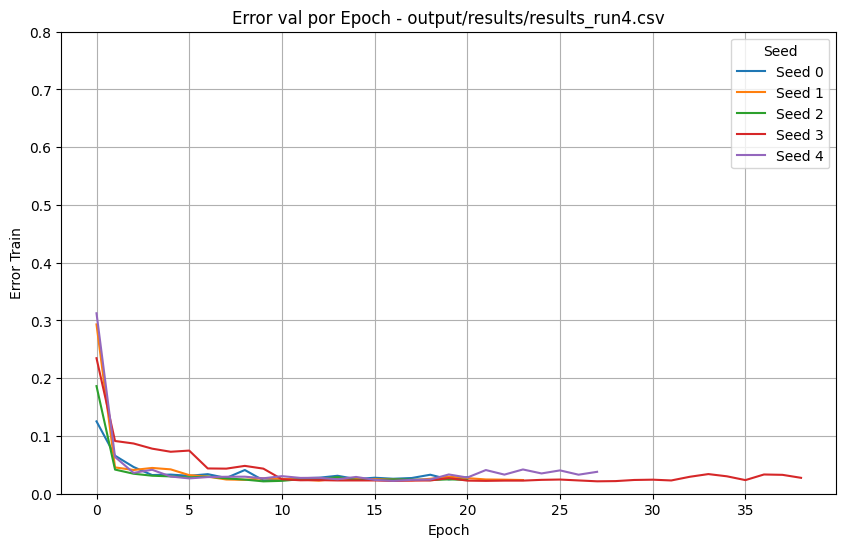

Dados do arquivo: output/results/results_run6.csv


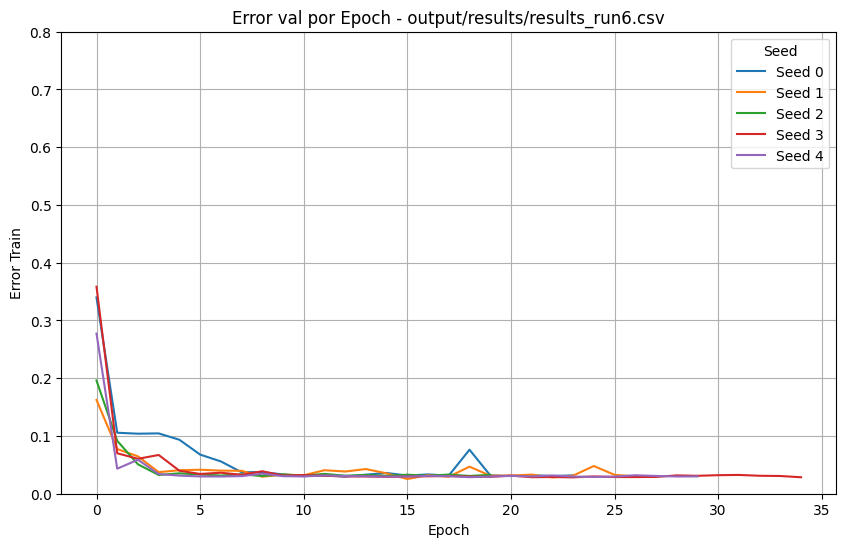

Dados do arquivo: output/results/results_run7.csv


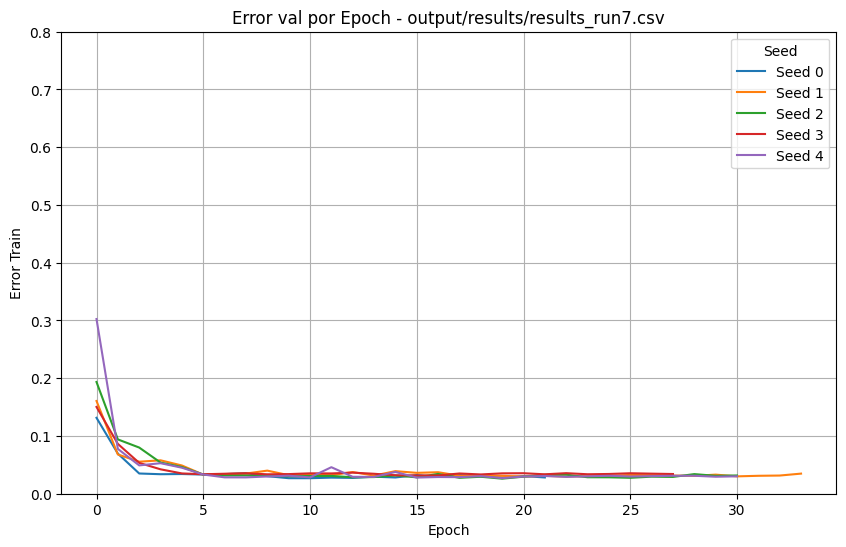

Dados do arquivo: output/results/results_run8.csv


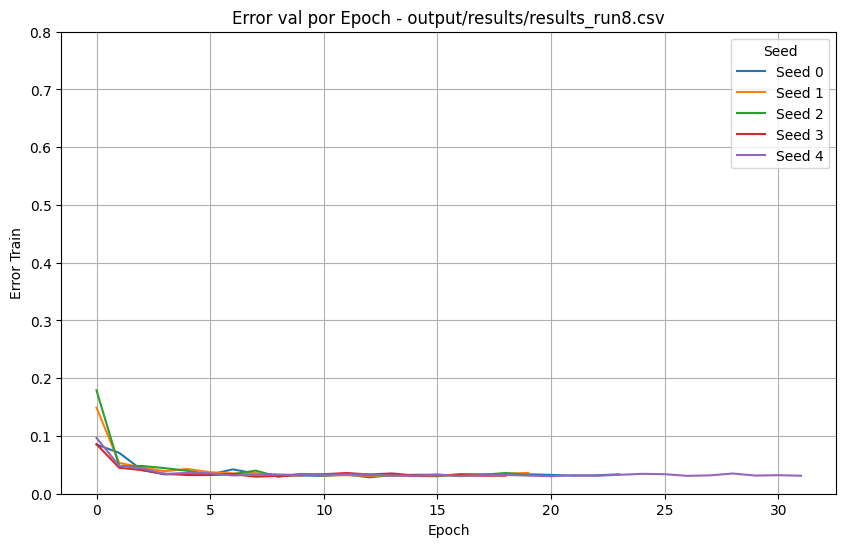

Dados do arquivo: output/results/results_run9.csv


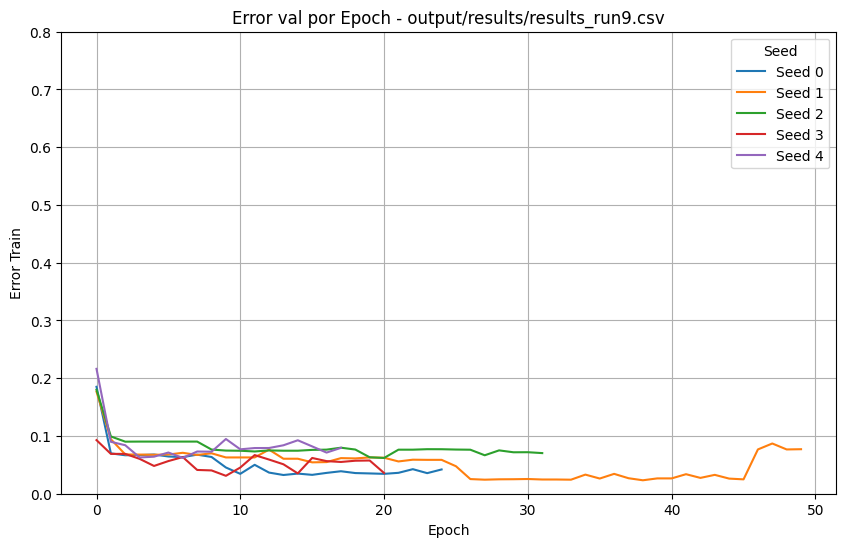

Dados do arquivo: output/results/results_run10.csv


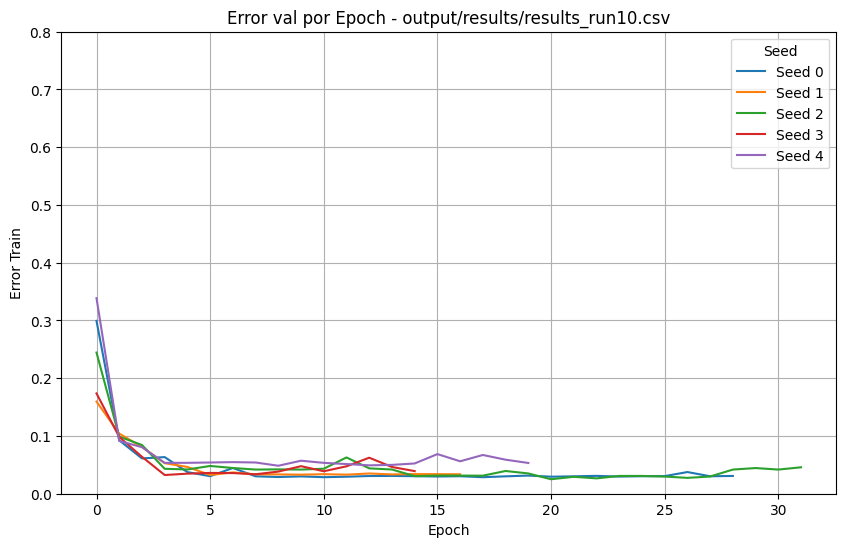

Dados do arquivo: output/results/results_run11.csv


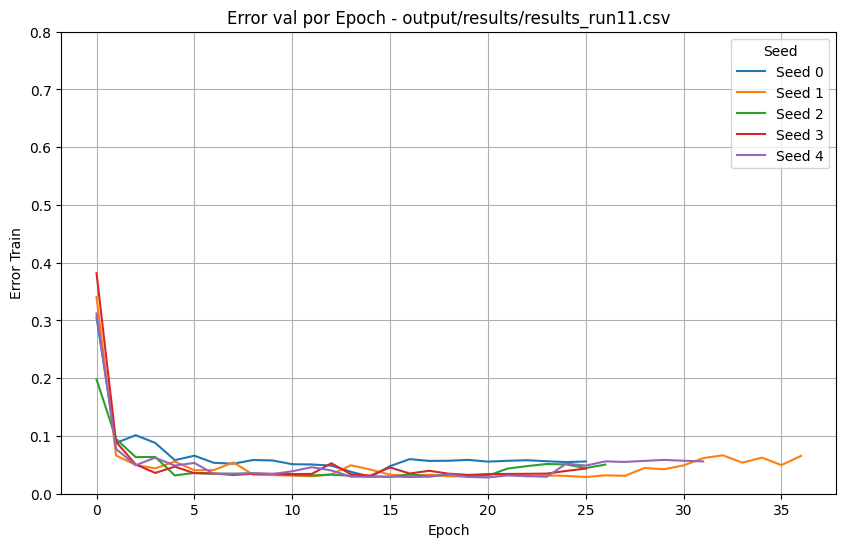

Dados do arquivo: output/results/results_run12.csv


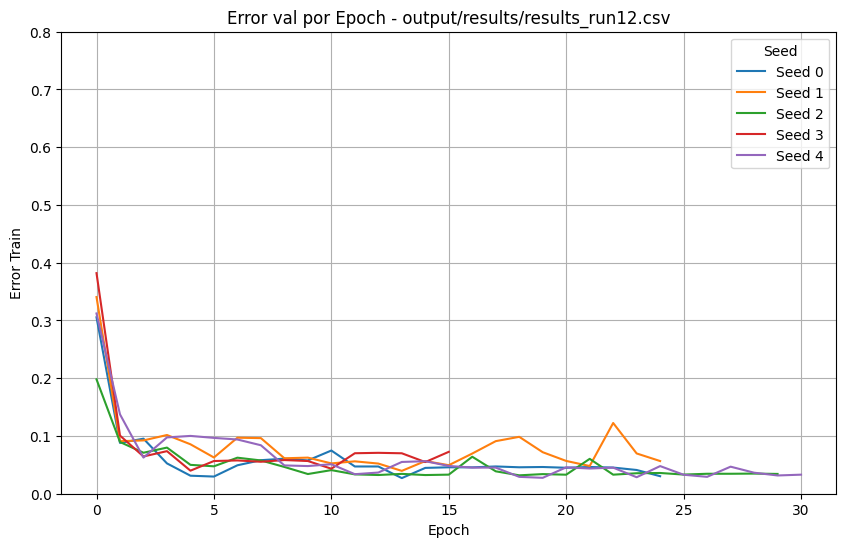

Dados do arquivo: output/results/results_run13.csv


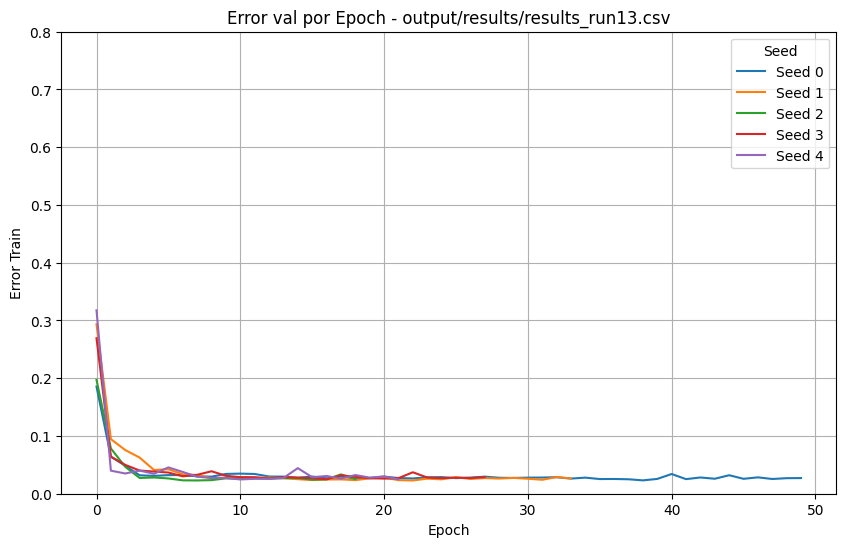

Dados do arquivo: output/results/results_run14.csv


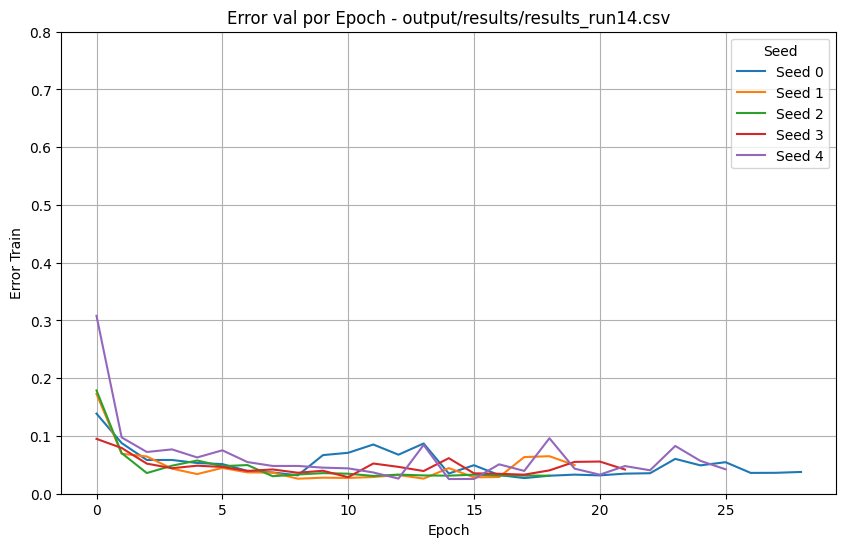

Dados do arquivo: output/results/results_run15.csv


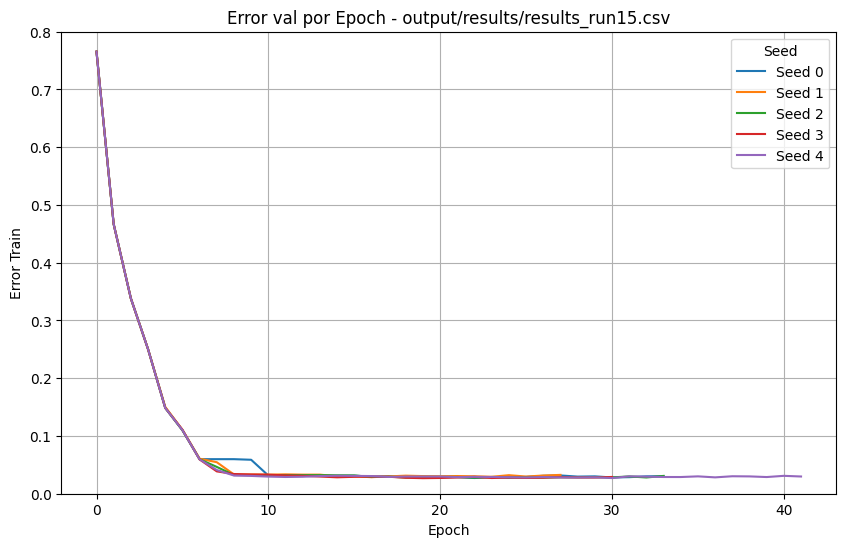

Dados do arquivo: output/results/results_run16.csv


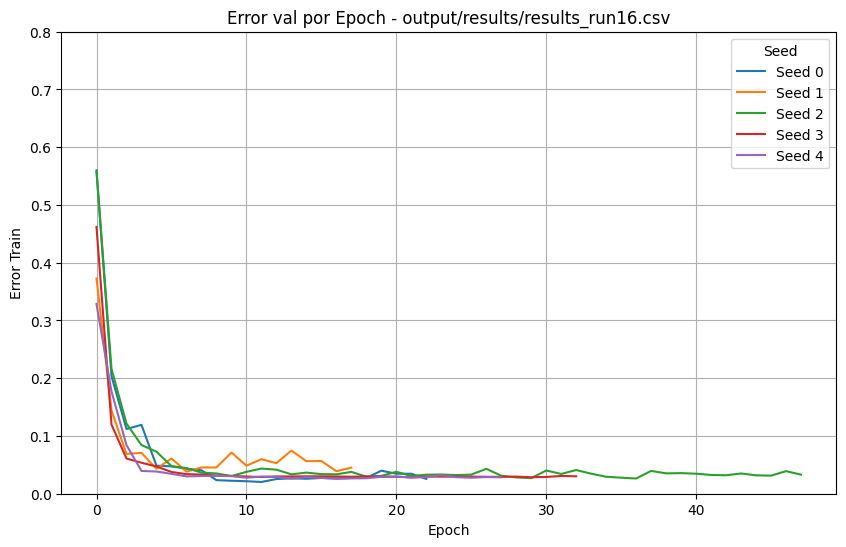

Dados do arquivo: output/results/results_run17.csv


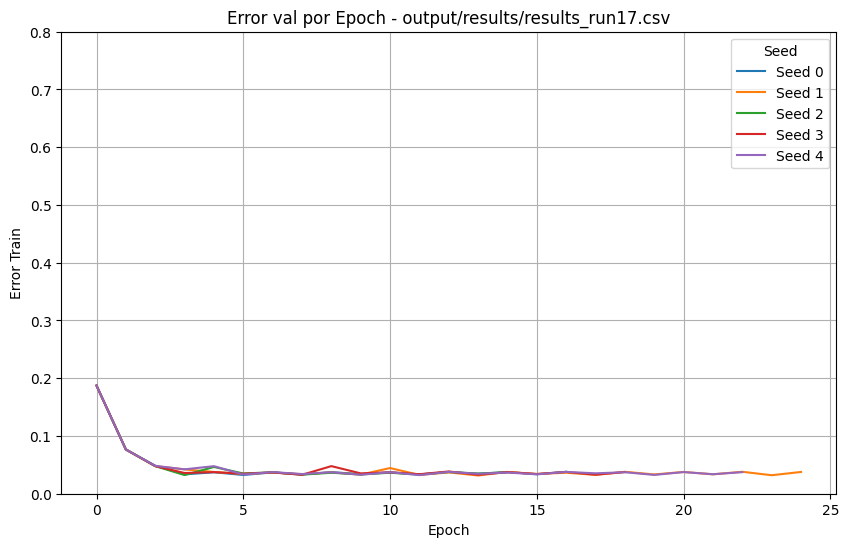

In [10]:
base_path = 'output_V2/results/results_run{}.csv'
min_error_val = float('inf')
min_error_details = {'file': None, 'seed': None, 'epoch': None}

# Iterar sobre os 17 arquivos
for i in range(1, 18):
    if i!=5:
        file_path = base_path.format(i)
        
        # Carregar os dados do arquivo CSV
        df = pd.read_csv(file_path)

        min_error_in_file = df['error_val'].min()
    
        # Verificar se este é o menor erro encontrado até agora
        if min_error_in_file < min_error_val:0
            min_error_val = min_error_in_file
            min_error_row = df[df['error_val'] == min_error_in_file].iloc[0]
            min_error_details['file'] = file_path
            min_error_details['seed'] = min_error_row['seed']
            min_error_details['epoch'] = min_error_row['epoch']

        # Verificar os dados carregados
        print(f'Dados do arquivo: {file_path}')
        #print(df.head())

        # Plotar os dados
        plt.figure(figsize=(10, 6))

        # Iterar sobre cada seed e plotar as linhas
        for seed in df['seed'].unique():
            seed_data = df[df['seed'] == seed]
            plt.plot(seed_data['epoch'], seed_data['error_val'], label=f'Seed {seed}')

        plt.xlabel('Epoch')
        plt.ylabel('Error Train')
        plt.ylim(0, 0.8)
        plt.title(f'Error val por Epoch - {file_path}')
        plt.legend(title='Seed')
        plt.grid(True)
        plt.show()

In [11]:
print(f"O menor error_val foi {min_error_val}")
print(f"Arquivo: {min_error_details['file']}")
print(f"Seed: {min_error_details['seed']}")
print(f"Epoch: {min_error_details['epoch']}")

O menor error_val foi 0.020365065
Arquivo: output/results/results_run16.csv
Seed: 0
Epoch: 11


Dados do arquivo: output/results/results_run20.csv
--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 20
Erro mínimo: 0.019847555
Tempo mínimo: 23.945242178440093
Tempo médio: 42.02357973580174


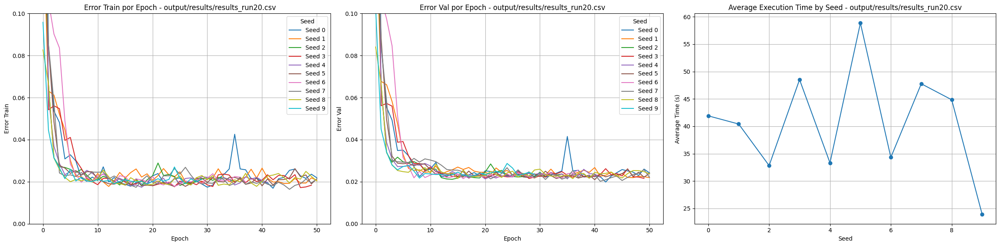

Dados do arquivo: output/results/results_run21.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 21
Erro mínimo: 0.018550396
Tempo mínimo: 13.705568893750508
Tempo médio: 26.4080170117423


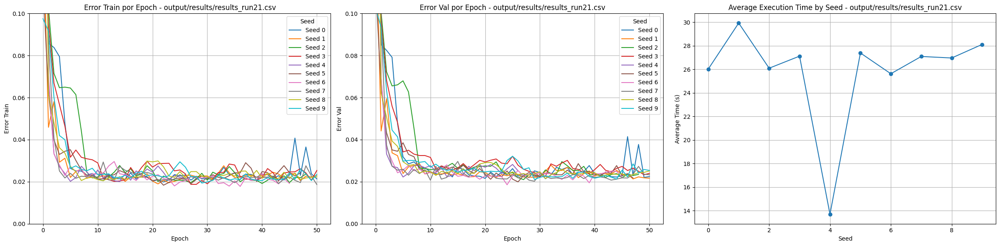

Dados do arquivo: output/results/results_run22.csv
--nlayer 2 --wlen 3 --train_size 30 --neighbors_sample_f 16 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 15 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 22
Erro mínimo: 0.019776309
Tempo mínimo: 20.658206137021384
Tempo médio: 27.89734351625559


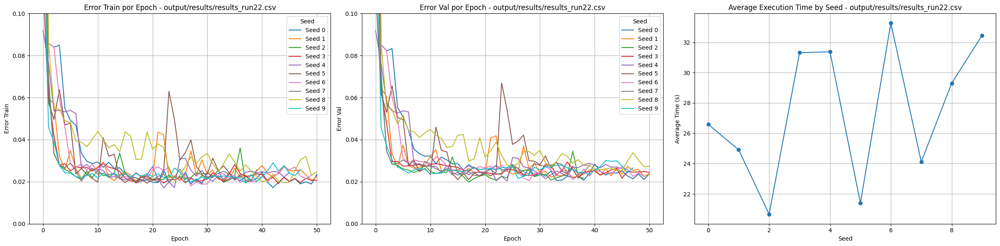

O menor error_val foi 0.018550396
Arquivo: output/results/results_run21.csv
Seed: 6
Epoch: 24


In [19]:
print_result(PARAMS_LIST, [20,21,22])

Dados do arquivo: output/results/results_run1.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 1
Erro mínimo: 0.02200647
Tempo mínimo: 5.17401089668274
Tempo médio: 5.691965400220867


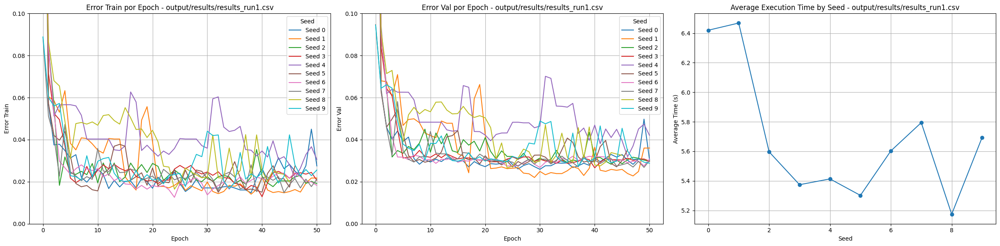

Dados do arquivo: output/results/results_run2.csv
--nlayer 3 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 2
Erro mínimo: 0.02393651
Tempo mínimo: 6.113291855653127
Tempo médio: 10.087170099454768


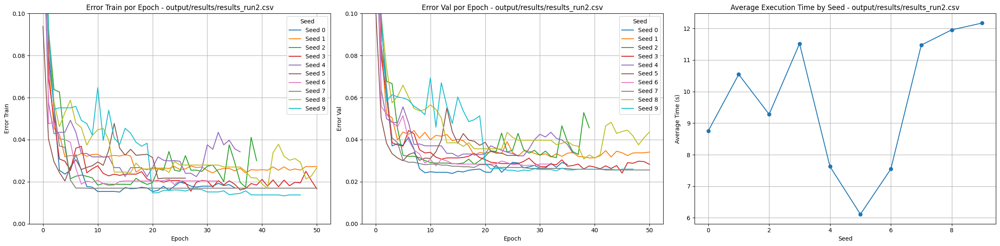

Dados do arquivo: output/results/results_run3.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 20 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 3
Erro mínimo: 0.023291958
Tempo mínimo: 4.356593918800354
Tempo médio: 6.0608124162758115


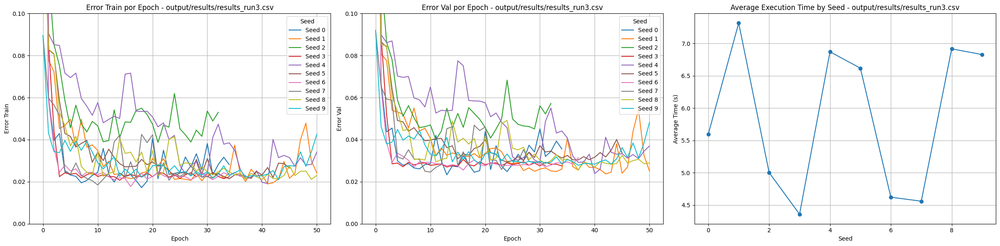

Dados do arquivo: output/results/results_run4.csv
--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 4
Erro mínimo: 0.02063452
Tempo mínimo: 19.128494250774384
Tempo médio: 29.79724928067896


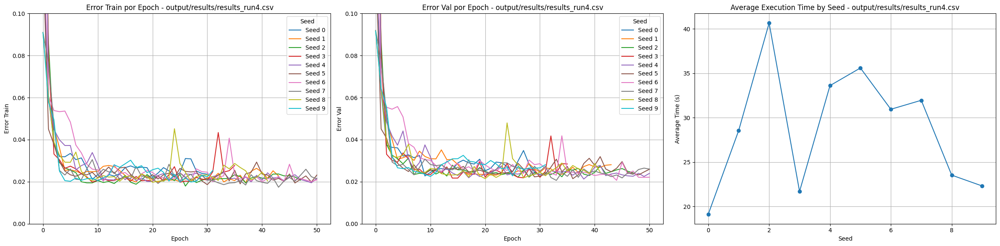

Dados do arquivo: output/results/results_run6.csv
--nlayer 2 --wlen 3 --train_size 5 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 6
Erro mínimo: 0.027047206
Tempo mínimo: 2.974010097980499
Tempo médio: 4.468174224983562


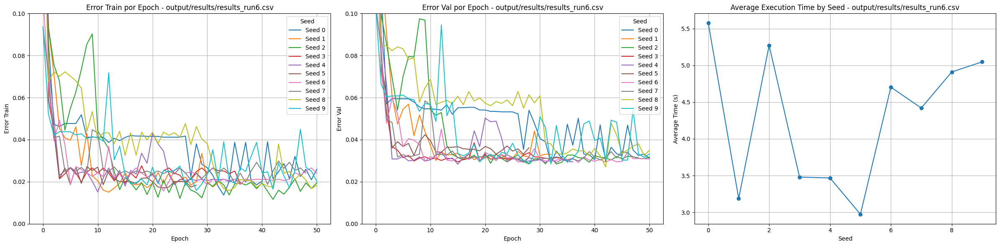

Dados do arquivo: output/results/results_run7.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 7
Erro mínimo: 0.022988236
Tempo mínimo: 6.831516663233439
Tempo médio: 11.530292736488384


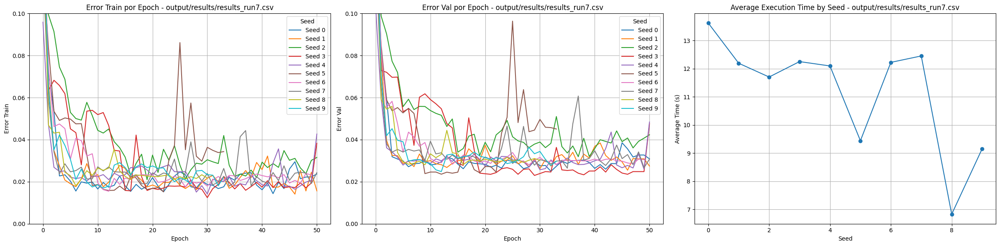

Dados do arquivo: output/results/results_run8.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 1 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 8
Erro mínimo: 0.02511537
Tempo mínimo: 25.974268837769827
Tempo médio: 39.07059655106105


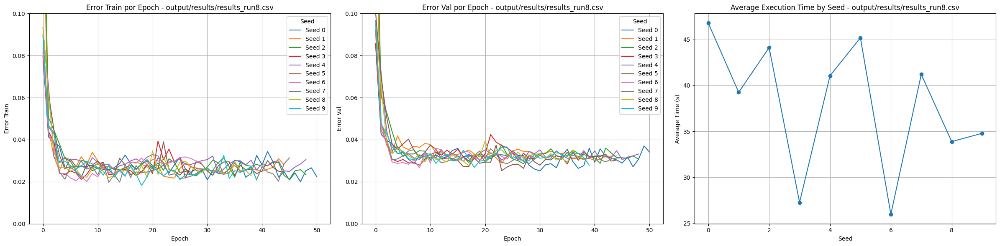

Dados do arquivo: output/results/results_run9.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 4 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 9
Erro mínimo: 0.026069254
Tempo mínimo: 3.1554322123527525
Tempo médio: 4.510522258390824


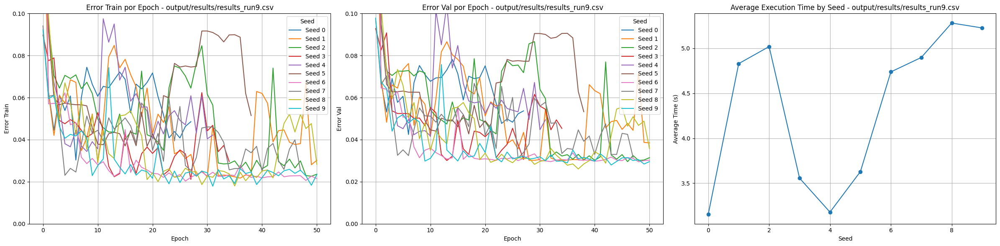

Dados do arquivo: output/results/results_run10.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 12 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 10
Erro mínimo: 0.023819685
Tempo mínimo: 3.634002669652303
Tempo médio: 5.001021637750472


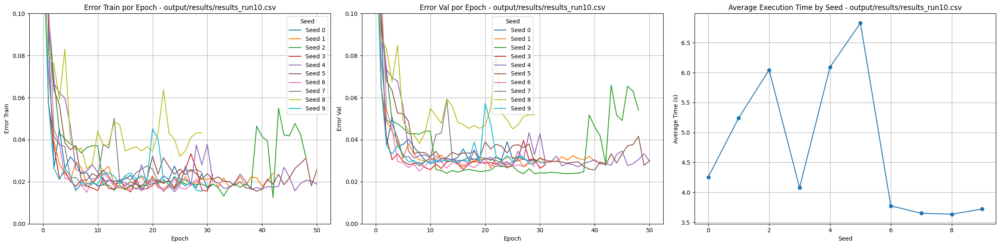

Dados do arquivo: output/results/results_run11.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 11
Erro mínimo: 0.021703959
Tempo mínimo: 2.1194221138954163
Tempo médio: 3.2459589089883387


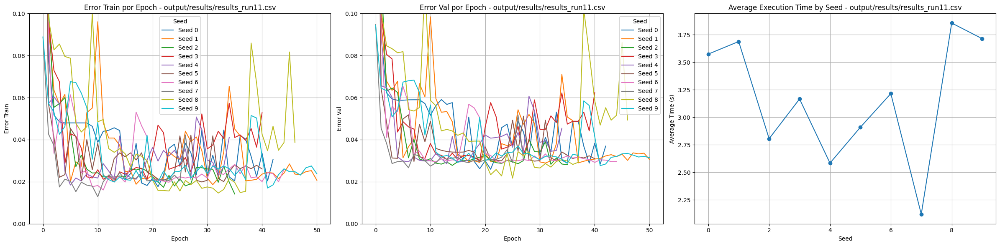

Dados do arquivo: output/results/results_run12.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 3 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 12
Erro mínimo: 0.027138282
Tempo mínimo: 1.191389838854472
Tempo médio: 2.0504472056171115


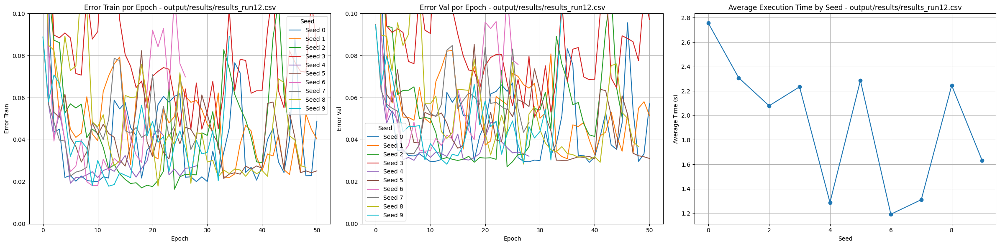

Dados do arquivo: output/results/results_run13.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 13
Erro mínimo: 0.021311004
Tempo mínimo: 8.814244210720062
Tempo médio: 13.10548355822606


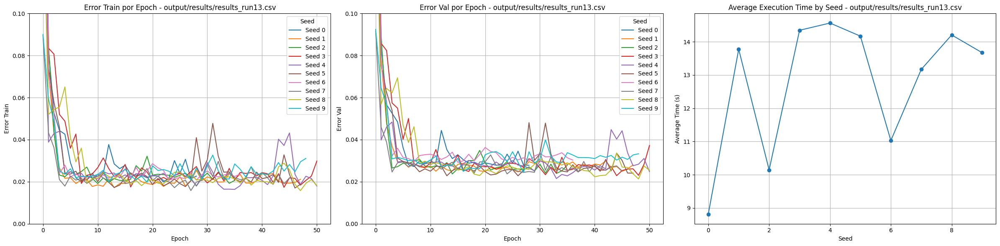

Dados do arquivo: output/results/results_run14.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 4 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 14
Erro mínimo: 0.02498724
Tempo mínimo: 4.380267282327016
Tempo médio: 7.321709259270615


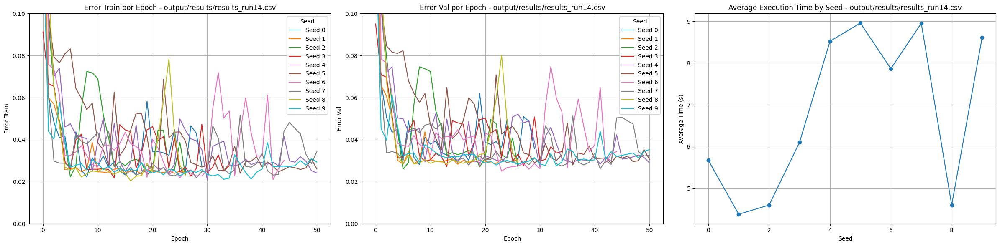

Dados do arquivo: output/results/results_run15.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,1,0,0,0,0]' --run 15
Erro mínimo: 0.025096
Tempo mínimo: 4.4140370408693945
Tempo médio: 5.5400002213257205


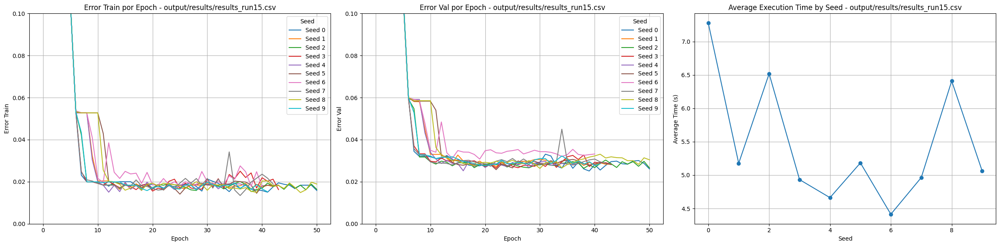

Dados do arquivo: output/results/results_run16.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[1,1,1,1,1,1,1,1,1]' --run 16
Erro mínimo: 0.021906812
Tempo mínimo: 4.165036288897197
Tempo médio: 6.989632612678913


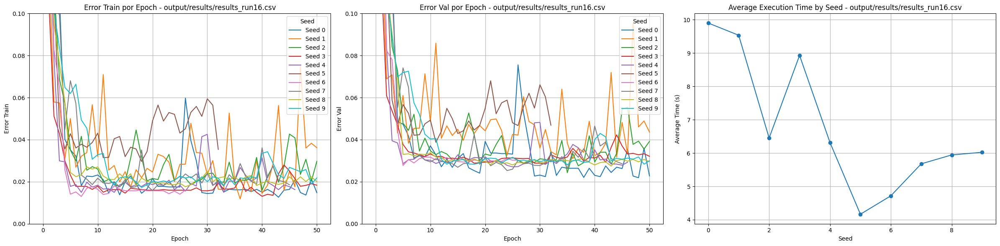

Dados do arquivo: output/results/results_run17.csv
--nlayer 1 --wlen 5 --train_size 10 --neighbors_sample_f 16 --neighbors_sample_w 16 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 17
Erro mínimo: 0.030803366
Tempo mínimo: 2.926795585950216
Tempo médio: 4.990367003639726


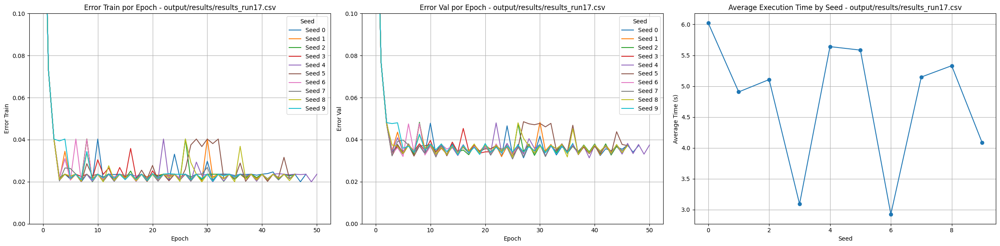

O menor error_val foi 0.02063452
Arquivo: output/results/results_run4.csv
Seed: 7
Epoch: 33


In [9]:


# Caminho base dos arquivos
base_path = 'output/results/results_run{}.csv'

# Lista de parâmetros para cada run
PARAMS_LIST = [
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 1",
    "--nlayer 3 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 2",
    "--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 20 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 3",
    "--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 4",
    "--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 50 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 5",
    "--nlayer 2 --wlen 3 --train_size 5 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 6",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 7",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 1 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 8",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 4 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 9",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 12 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 10",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 11",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 3 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 12",
    "--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 13",
    "--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 4 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 14",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,1,0,0,0,0]' --run 15",
    "--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[1,1,1,1,1,1,1,1,1]' --run 16",
    "--nlayer 1 --wlen 5 --train_size 10 --neighbors_sample_f 16 --neighbors_sample_w 16 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 17"
]

min_error_val = float('inf')
min_error_details = {'file': None, 'seed': None, 'epoch': None}


# Iterar sobre os 17 arquivos
for i in range(1, 18):
    if i != 5:
        file_path = base_path.format(i)
        params = PARAMS_LIST[i - 1]
        
        # Carregar os dados do arquivo CSV
        df = pd.read_csv(file_path)


        min_error_in_file = df['error_val'].min()
    
        # Verificar se este é o menor erro encontrado até agora
        if min_error_in_file < min_error_val:
            min_error_val = min_error_in_file
            min_error_row = df[df['error_val'] == min_error_in_file].iloc[0]
            min_error_details['file'] = file_path
            min_error_details['seed'] = min_error_row['seed']
            min_error_details['epoch'] = min_error_row['epoch']

        # Calcular tempo mínimo e médio
        min_time = df['time'].min()
        avg_time = df['time'].mean()

        # Verificar os dados carregados
        print(f'Dados do arquivo: {file_path}')
        print(params)
        print(f'Erro mínimo: {min_error_in_file}')
        print(f'Tempo mínimo: {min_time}')
        print(f'Tempo médio: {avg_time}')

        # Plotar os dados
        fig, axes = plt.subplots(1, 3, figsize=(24, 6))
        
        # Gráfico de error_train
        for seed in df['seed'].unique():
            seed_data = df[df['seed'] == seed]
            axes[0].plot(seed_data['epoch'], seed_data['error_train'], label=f'Seed {seed}')

        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Error Train')
        axes[0].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_train
        axes[0].set_title(f'Error Train por Epoch - {file_path}')
        axes[0].legend(title='Seed')
        axes[0].grid(True)
        
        # Gráfico de error_val
        for seed in df['seed'].unique():
            seed_data = df[df['seed'] == seed]
            axes[1].plot(seed_data['epoch'], seed_data['error_val'], label=f'Seed {seed}')

        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Error Val')
        axes[1].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_val
        axes[1].set_title(f'Error Val por Epoch - {file_path}')
        axes[1].legend(title='Seed')
        axes[1].grid(True)

        # Gráfico de tempo médio de execução por seed
        avg_time_by_seed = df.groupby('seed')['time'].mean()
        axes[2].plot(avg_time_by_seed.index, avg_time_by_seed.values, marker='o')
        axes[2].set_xlabel('Seed')
        axes[2].set_ylabel('Average Time (s)')
        axes[2].set_title(f'Average Execution Time by Seed - {file_path}')
        axes[2].grid(True)


        plt.tight_layout()
        plt.show()



print(f"O menor error_val foi {min_error_val}")
print(f"Arquivo: {min_error_details['file']}")
print(f"Seed: {min_error_details['seed']}")
print(f"Epoch: {min_error_details['epoch']}")


Dados do arquivo: output/results/results_run1.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 1
Erro mínimo Treino: 0.02793525 / Erro mínimo Vaalidação: 0.02793525


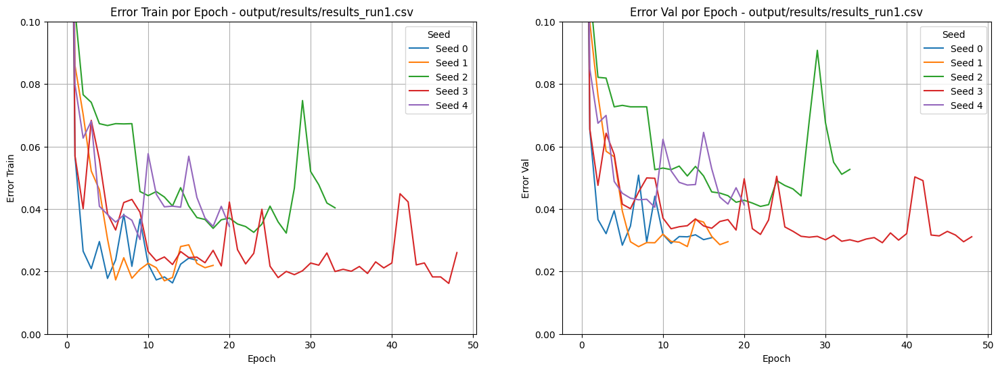

Dados do arquivo: output/results/results_run2.csv
--nlayer 3 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 2
Erro mínimo Treino: 0.02105102 / Erro mínimo Vaalidação: 0.02105102


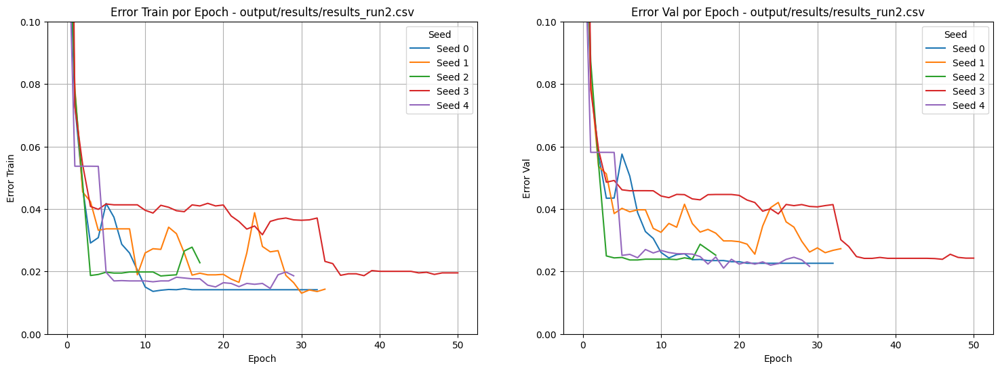

Dados do arquivo: output/results/results_run3.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 20 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 3
Erro mínimo Treino: 0.023258781 / Erro mínimo Vaalidação: 0.023258781


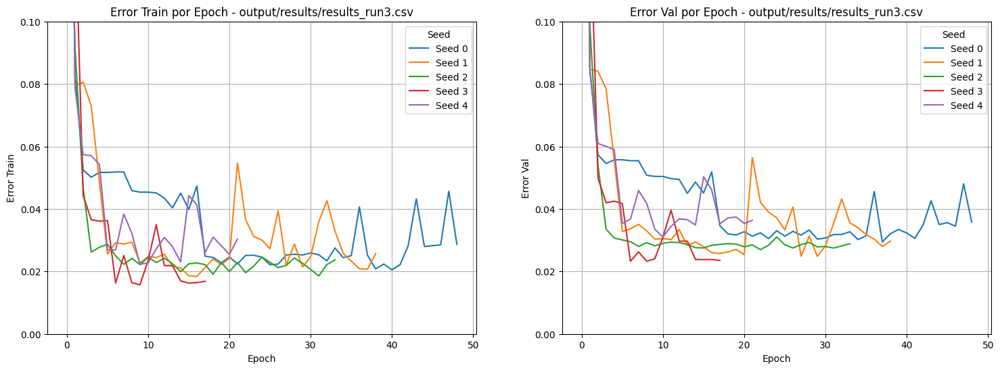

Dados do arquivo: output/results/results_run4.csv
--nlayer 2 --wlen 3 --train_size 50 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 4
Erro mínimo Treino: 0.0213951 / Erro mínimo Vaalidação: 0.0213951


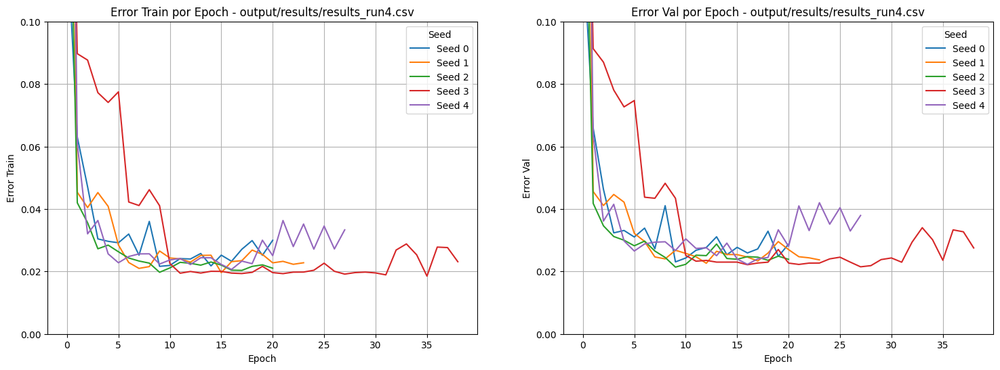

Dados do arquivo: output/results/results_run6.csv
--nlayer 2 --wlen 3 --train_size 5 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 6
Erro mínimo Treino: 0.02541864 / Erro mínimo Vaalidação: 0.02541864


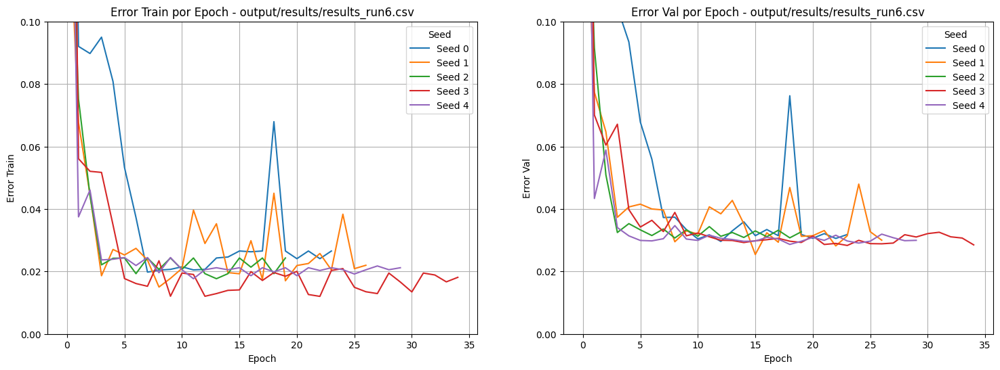

Dados do arquivo: output/results/results_run7.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 5 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 7
Erro mínimo Treino: 0.026065195 / Erro mínimo Vaalidação: 0.026065195


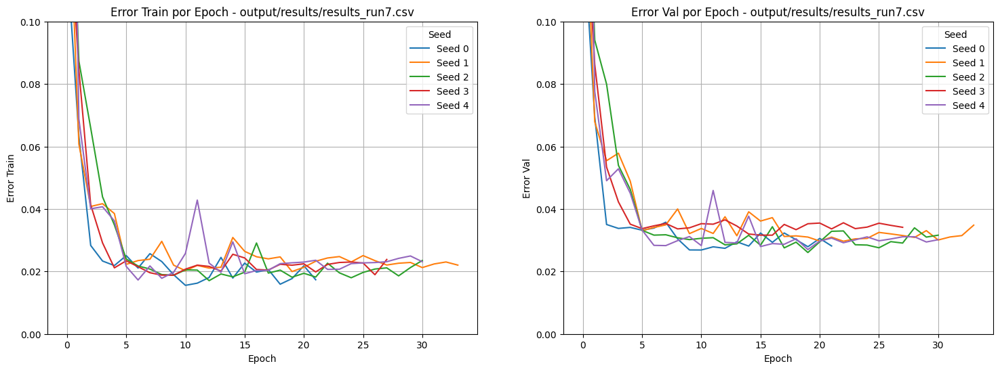

Dados do arquivo: output/results/results_run8.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 1 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 8
Erro mínimo Treino: 0.028442645 / Erro mínimo Vaalidação: 0.028442645


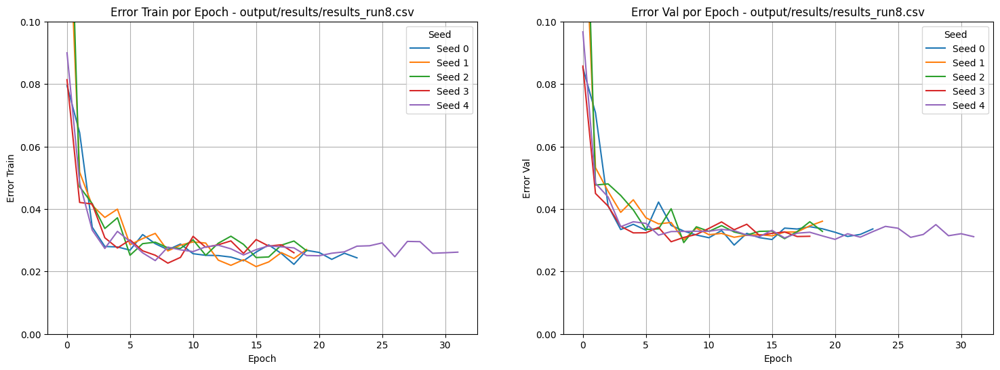

Dados do arquivo: output/results/results_run9.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 4 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 9
Erro mínimo Treino: 0.023281325 / Erro mínimo Vaalidação: 0.023281325


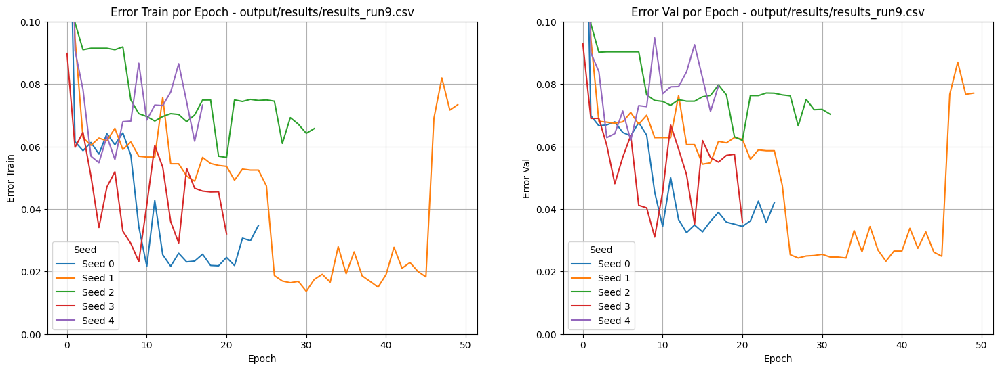

Dados do arquivo: output/results/results_run10.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 12 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 10
Erro mínimo Treino: 0.025056845 / Erro mínimo Vaalidação: 0.025056845


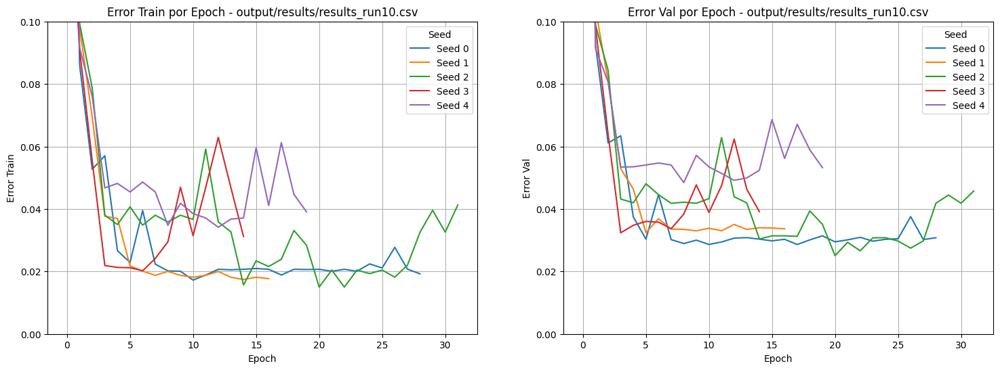

Dados do arquivo: output/results/results_run11.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 11
Erro mínimo Treino: 0.028185708 / Erro mínimo Vaalidação: 0.028185708


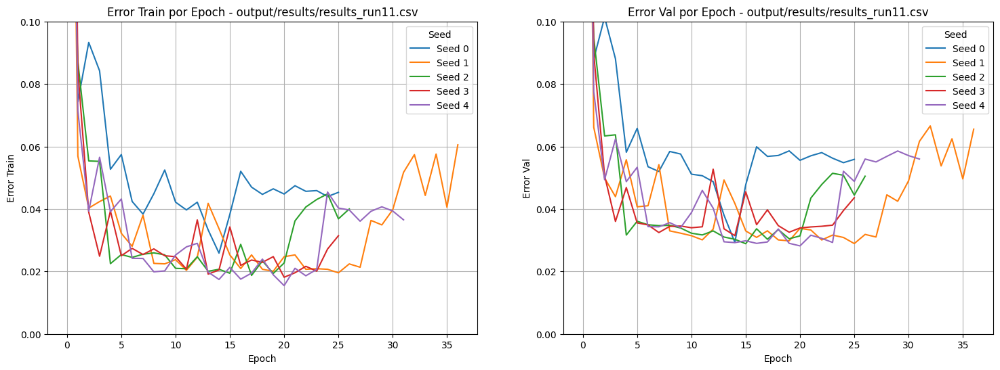

Dados do arquivo: output/results/results_run12.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 3 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 12
Erro mínimo Treino: 0.027039004 / Erro mínimo Vaalidação: 0.027039004


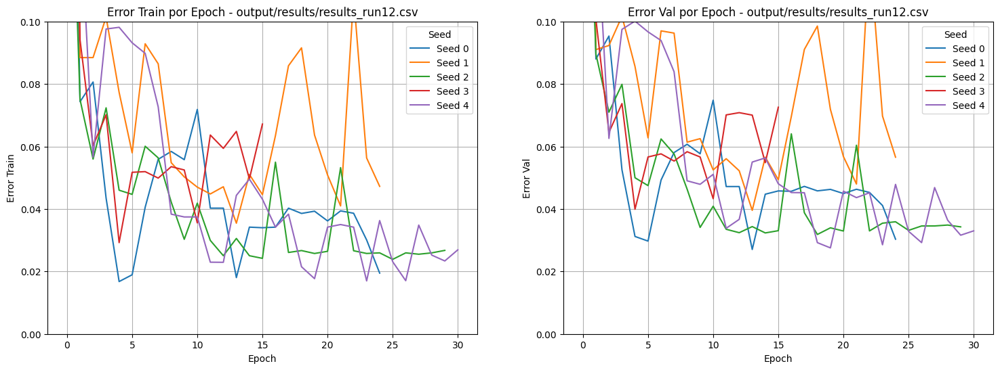

Dados do arquivo: output/results/results_run13.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 13
Erro mínimo Treino: 0.02296192 / Erro mínimo Vaalidação: 0.02296192


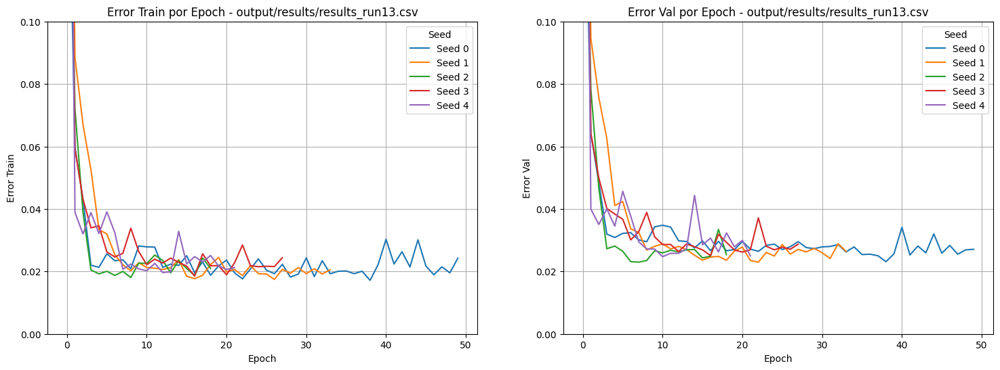

Dados do arquivo: output/results/results_run14.csv
--nlayer 2 --wlen 3 --train_size 20 --neighbors_sample_f 4 --neighbors_sample_w 5 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,1,0,1,1,1,0,1,0]' --run 14
Erro mínimo Treino: 0.025437588 / Erro mínimo Vaalidação: 0.025437588


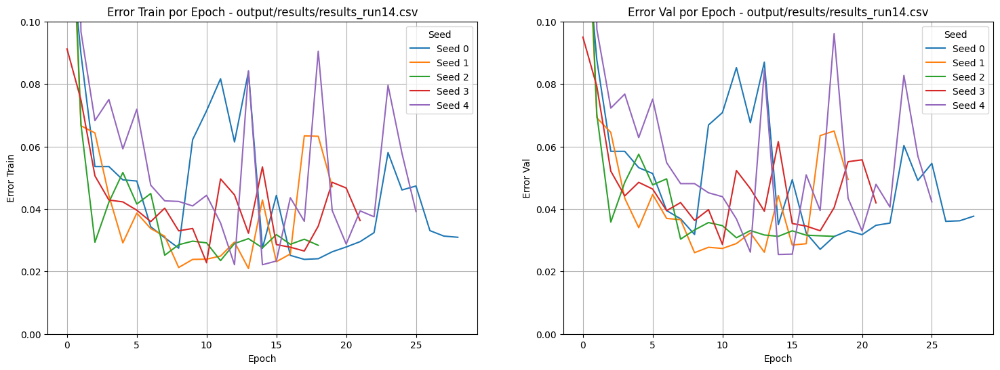

Dados do arquivo: output/results/results_run15.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,1,0,0,0,0]' --run 15
Erro mínimo Treino: 0.026931811 / Erro mínimo Vaalidação: 0.026931811


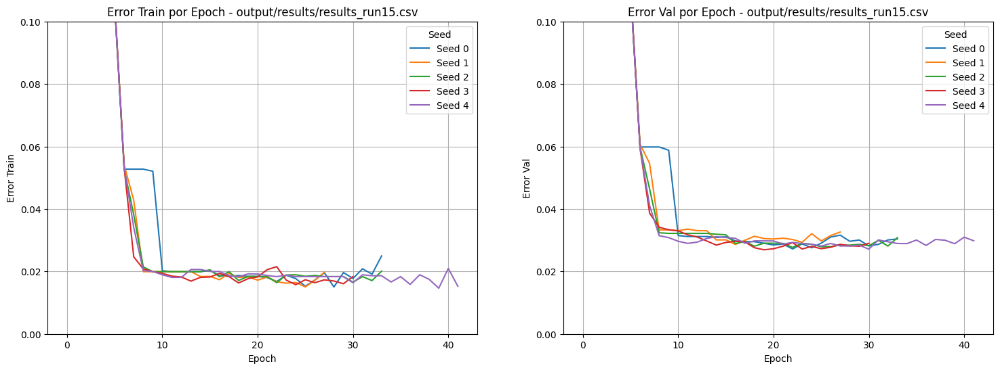

Dados do arquivo: output/results/results_run16.csv
--nlayer 2 --wlen 3 --train_size 10 --neighbors_sample_f 8 --neighbors_sample_w 9 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[1,1,1,1,1,1,1,1,1]' --run 16
Erro mínimo Treino: 0.020365065 / Erro mínimo Vaalidação: 0.020365065


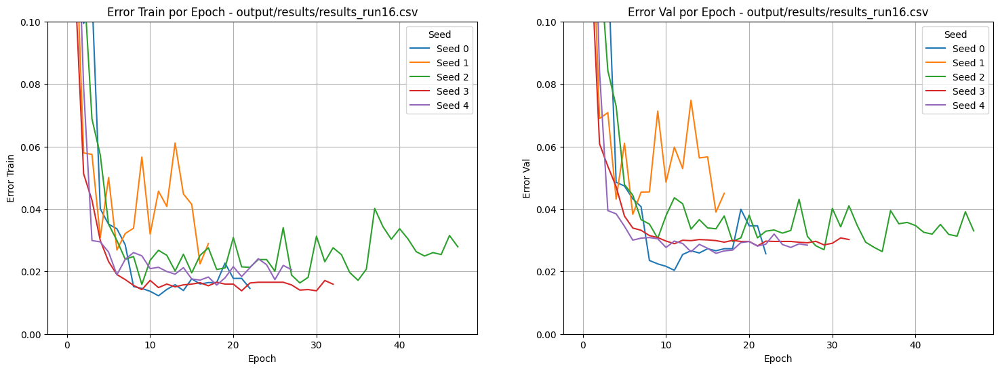

Dados do arquivo: output/results/results_run17.csv
--nlayer 1 --wlen 5 --train_size 10 --neighbors_sample_f 16 --neighbors_sample_w 16 --epoch_f 100 --epoch_w 50 --batch 10 --w_ini '[0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0]' --run 17
Erro mínimo Treino: 0.0315785 / Erro mínimo Vaalidação: 0.0315785


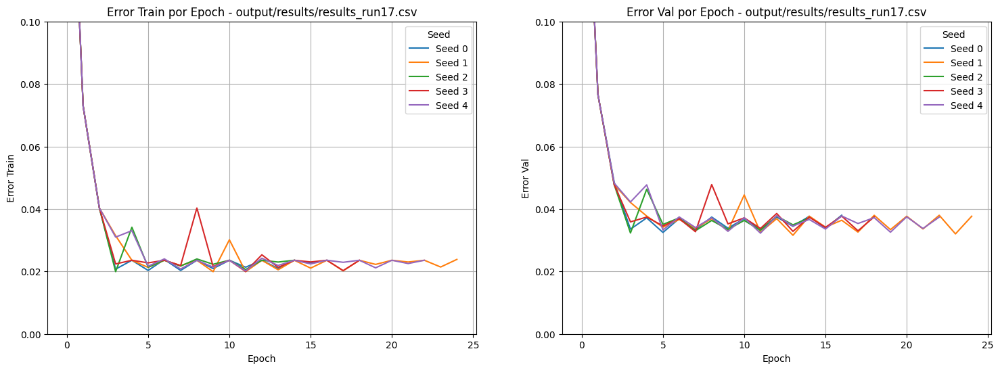

O menor error_val foi 0.020365065
Arquivo: output/results/results_run16.csv
Seed: 0
Epoch: 11


In [22]:
for i in range(1, 18):
    if i!=5:
        file_path = base_path.format(i)
        params = PARAMS_LIST[i - 1]
        
        # Carregar os dados do arquivo CSV
        df = pd.read_csv(file_path)

        min_error_in_file_val = df['error_val'].min()
        min_error_in_file_train = df['error_val'].min()
    
        # Verificar se este é o menor erro encontrado até agora
        if min_error_in_file_val < min_error_val:
            min_error_val = min_error_in_file_val
            min_error_row = df[df['error_val'] == min_error_in_file_val].iloc[0]
            min_error_details['file'] = file_path
            min_error_details['seed'] = min_error_row['seed']
            min_error_details['epoch'] = min_error_row['epoch']

        # Verificar os dados carregados
        print(f'Dados do arquivo: {file_path}')
        #print(df.head())
        print(params)
        print(f'Erro mínimo Treino: {min_error_in_file_train} / Erro mínimo Vaalidação: {min_error_in_file_val}')

        # Plotar os dados
        fig, axes = plt.subplots(1, 2, figsize=(18, 6))
        
        # Gráfico de error_train
        for seed in df['seed'].unique():
            seed_data = df[df['seed'] == seed]
            axes[0].plot(seed_data['epoch'], seed_data['error_train'], label=f'Seed {seed}')

        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Error Train')
        axes[0].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_train
        axes[0].set_title(f'Error Train por Epoch - {file_path}')
        axes[0].legend(title='Seed')
        axes[0].grid(True)
        
        # Gráfico de error_val
        for seed in df['seed'].unique():
            seed_data = df[df['seed'] == seed]
            axes[1].plot(seed_data['epoch'], seed_data['error_val'], label=f'Seed {seed}')

        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Error Val')
        axes[1].set_ylim(0, 0.1)  # Definir os limites do eixo y para error_val
        axes[1].set_title(f'Error Val por Epoch - {file_path}')
        axes[1].legend(title='Seed')
        axes[1].grid(True)

        plt.show()

print(f"O menor error_val foi {min_error_val}")
print(f"Arquivo: {min_error_details['file']}")
print(f"Seed: {min_error_details['seed']}")
print(f"Epoch: {min_error_details['epoch']}")